

# PROGRAMMING ASSIGNMENT-1



**Name: MANISHA CHAWLA**

**Roll Number: 12210370**

**References Used to Complete the Assignment**

    a. https://github.com/gagan-iitb/CS550/blob/main/Handouts/04_training_linear_models_CS550_ipynb_updated.ipynb
    b. https://github.com/gagan-iitb/CS550/blob/main/Handouts/Chapter_2_End_to_End_Model.ipynb
    c. https://github.com/gagan-iitb/CS550/blob/main/Handouts/Regression_With_Noise.ipynb
    d. https://github.com/gagan-iitb/CS550/tree/main/Lectures
    f. https://www.oreilly.com/library/view/hands-on-machine-learning/9781491962282/ch04.html
    g. https://www.kaggle.com/code/burhanykiyakoglu/k-nn-logistic-regression-k-fold-cv-from-scratch/notebook
    f. https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

# Part 1: NY Taxi Fare Prediction

In [1]:
#import libraries
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Read Training and Test data
train = pd.read_csv("train_NYTaxi.csv", nrows = 1000000)
test = pd.read_csv("test_NYTaxi.csv")


In [3]:
train.head()

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,0,2009-04-08 19:11:10.0000004,4.9,2009-04-08 19:11:10 UTC,-73.998287,40.727490,-73.989854,40.735239,2
1,1,2012-07-30 16:19:08.0000003,4.9,2012-07-30 16:19:08 UTC,-73.966597,40.794345,-73.965682,40.803808,2
2,2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00 UTC,-73.971638,40.763382,-73.953767,40.783715,1
3,3,2010-10-07 21:09:35.0000002,14.1,2010-10-07 21:09:35 UTC,-74.003545,40.707399,-73.981312,40.750071,1
4,4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00 UTC,-74.004532,40.707465,-73.977908,40.745633,5


In [4]:
# Check no of rows & columns in the dataset
print("Shape of the Training data :", train.shape)

# See all the columns in the dataset
print("All columns are :", list(train.columns))

Shape of the Training data : (100000, 9)
All columns are : ['Unnamed: 0', 'key', 'fare_amount', 'pickup_datetime', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count']


In [5]:
# Check datatypes & count of not-null values in each field
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         100000 non-null  int64  
 1   key                100000 non-null  object 
 2   fare_amount        100000 non-null  float64
 3   pickup_datetime    100000 non-null  object 
 4   pickup_longitude   100000 non-null  float64
 5   pickup_latitude    100000 non-null  float64
 6   dropoff_longitude  100000 non-null  float64
 7   dropoff_latitude   100000 non-null  float64
 8   passenger_count    100000 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 6.9+ MB


In [6]:
# Check no of rows & columns in the test dataset
print("Shape of the Training data :", test.shape)

# See all the columns in the test dataset
print("All columns are :", list(test.columns))

Shape of the Training data : (9914, 7)
All columns are : ['key', 'pickup_datetime', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count']


We can see that we have a lot of training data but less test data. As we can see training and test data set have different number of columns. In traiing set we have 1 extra column that is unnamed also it is showing index only hence we can remove that column from train set.

In [7]:
# Removing unnamed column from train data
train.drop(train.iloc[:,0:1], inplace=True, axis=1)
train.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-04-08 19:11:10.0000004,4.9,2009-04-08 19:11:10 UTC,-73.998287,40.727490,-73.989854,40.735239,2
1,2012-07-30 16:19:08.0000003,4.9,2012-07-30 16:19:08 UTC,-73.966597,40.794345,-73.965682,40.803808,2
2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00 UTC,-73.971638,40.763382,-73.953767,40.783715,1
3,2010-10-07 21:09:35.0000002,14.1,2010-10-07 21:09:35 UTC,-74.003545,40.707399,-73.981312,40.750071,1
4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00 UTC,-74.004532,40.707465,-73.977908,40.745633,5


In [8]:
#After this check for size of this
train.shape

(100000, 8)

In [9]:
#check for missing values in train data
train.isnull().values.any()

False

In [10]:
train.isnull().sum()

key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

In [11]:
#check for missing values in test data
test.isnull().values.any()

False

In [12]:
test.isnull().sum()

key                  0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

In [13]:
#drop the missing values
#There are no missing values 

In [14]:
#check the target column
print(train.columns)

Index(['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count'],
      dtype='object')


Here we Have to predict the fare amount,  Fare Amount may depend on following parameters:
    
1. fare_Amount= Some Initial amount + Some amount dependent on distance + some amount dependent on waiting_time + Some amount dependent on location(to or from) 

2. Fare Amount may depend on peak hours

3. On week-days

4. Night charges

5. Passenger count

This we have to check using some visualisation.

In [15]:
# check for some statistics of data
train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,11.333564,-72.448815,39.887315,-72.479259,39.890066,1.682150
std,9.810826,10.869743,6.383817,12.774264,6.260724,1.308617
min,-9.300000,-736.516667,-74.015935,-2319.633333,-74.011085,0.000000
25%,6.000000,-73.992133,40.734793,-73.991443,40.734034,1.000000
50%,8.500000,-73.981850,40.752464,-73.980214,40.753093,1.000000
75%,12.500000,-73.967172,40.767032,-73.963718,40.768042,2.000000
max,394.000000,40.801777,404.666667,40.787037,44.640672,6.000000


**Inferences from the above description:-**

1. From this fare amount we have mean of 11.33 and problem of complexity is that we have huge amount of standard deviation that is 9.8 that means most of the fare amount is inthe rangeof  11.33(+/-)9.8

2. Maximum rides i. e. 75% of the total rides have are under fare amount under 12.5.

3. Maximum fare amount is 394 which seems like an outlier. It may be beacuse of intercity travel.

4. Minimum fare amount is negative. So there could be some problem with data set. Fare amount can not be negative. We can remove it.

5. Minimum value of passenger count 0 is also a problem that we need to look at. 


In [16]:
#check for the data types of each field
train.dtypes

key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

From here we can easily see that key and  pickup_datetime are object. So we need to do feature engineering on that.

## A. Data Cleaning and Visualization:

Will perform the following activities

1. Shape of train and test sets
2. Check for NaNs and drop them (if any)
3. Check for outliers and drop them (if any)
4. Type conversion of relevant fields

In [17]:
#check for Null Values 

In [18]:
#check for missing values in train data
train.isnull().values.any()

False

In [19]:
train.isnull().sum()

key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

No null value here in training set.

In [20]:
#check for missing values in test data
test.isnull().values.any()

False

In [21]:
test.isnull().sum()

key                  0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
dtype: int64

No null Values in test set

In [22]:
#Minimum Fare Amount is negative. So we will remove it from data.

In [23]:
#check the target column
train["fare_amount"].describe()

count    100000.000000
mean         11.333564
std           9.810826
min          -9.300000
25%           6.000000
50%           8.500000
75%          12.500000
max         394.000000
Name: fare_amount, dtype: float64

In [24]:
#Look for no. of non-positive fare_amount values.
train.loc[train['fare_amount'] < 0]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
38446,2010-03-13 15:29:10.0000003,-9.3,2010-03-13 15:29:10 UTC,-73.977015,40.779925,-73.949747,40.790322,3
38582,2010-02-27 02:37:10.0000004,-6.9,2010-02-27 02:37:10 UTC,-73.987800,40.747842,-73.981702,40.763600,1
61165,2010-03-24 14:21:10.0000001,-2.5,2010-03-24 14:21:10 UTC,-73.953752,40.813413,-73.953743,40.813407,1


In [25]:
# Remove the non-positive fare_amount values.
#There are only 3 rows with negative fare amount 3. Let us remove it. 
train=train[train['fare_amount'] >= 0]
len(train)

99997

In [26]:
train["fare_amount"].describe()

count    99997.000000
mean        11.334091
std          9.810489
min          0.000000
25%          6.000000
50%          8.500000
75%         12.500000
max        394.000000
Name: fare_amount, dtype: float64

In [27]:
train.dtypes

key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

In [28]:
#Let us see the Histogram for fare amount

(0.0, 400.0)

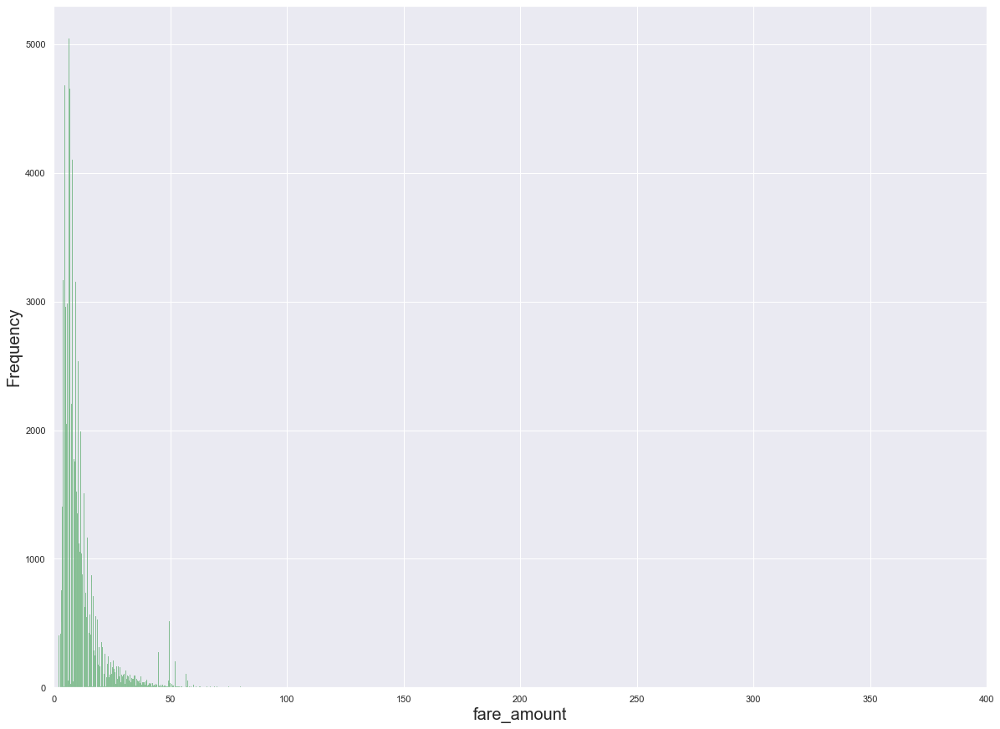

In [29]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(20,15)})
p=sns.histplot(data=train,x='fare_amount',color="g",kde=False)
p.set_xlabel("fare_amount", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,400)

From this we can see that maximum of the Fare amounts are betweem 0 to 20 and there are some peaks at 50-60. We can see it by a distribution plot.

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(0.0, 400.0)

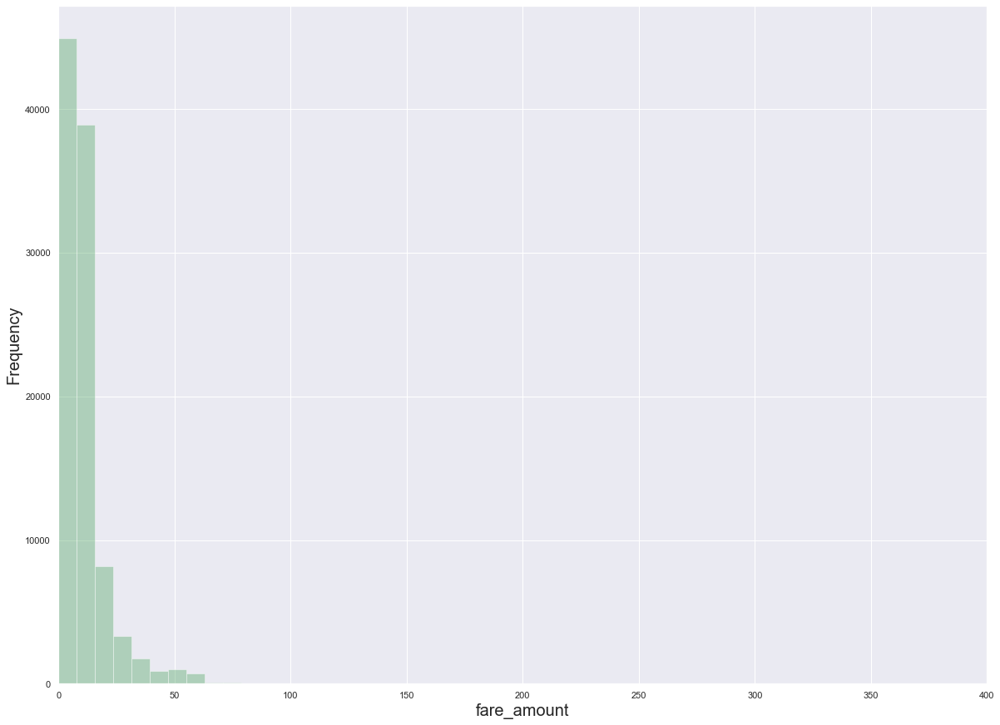

In [30]:
#Distribution plot for fare amount
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(20,15)})
p=sns.distplot(train['fare_amount'],color="g",kde=False)
p.set_xlabel("fare_amount", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,400)

From above plot we can say that majorly the fare amounts are between 0 to 70-80. Let us check only that range with one other plot.

(0.0, 100.0)

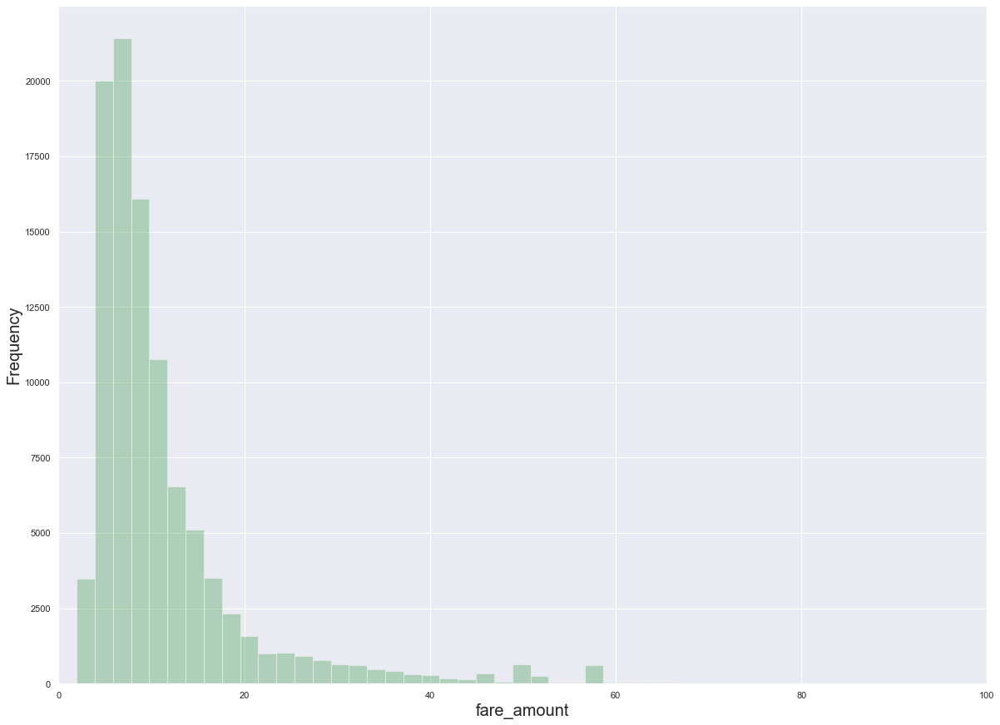

In [31]:
#Zooming the plot with in the range of 0 to 100
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(20,15)})
p=sns.distplot(train[train['fare_amount']<100]['fare_amount'],color="g",kde=False)
p.set_xlabel("fare_amount", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,100)

Maximum values for fareamount are between 0 to 5 and there are some peaks at 50 and 60

Text(0, 0.5, 'Frequency')

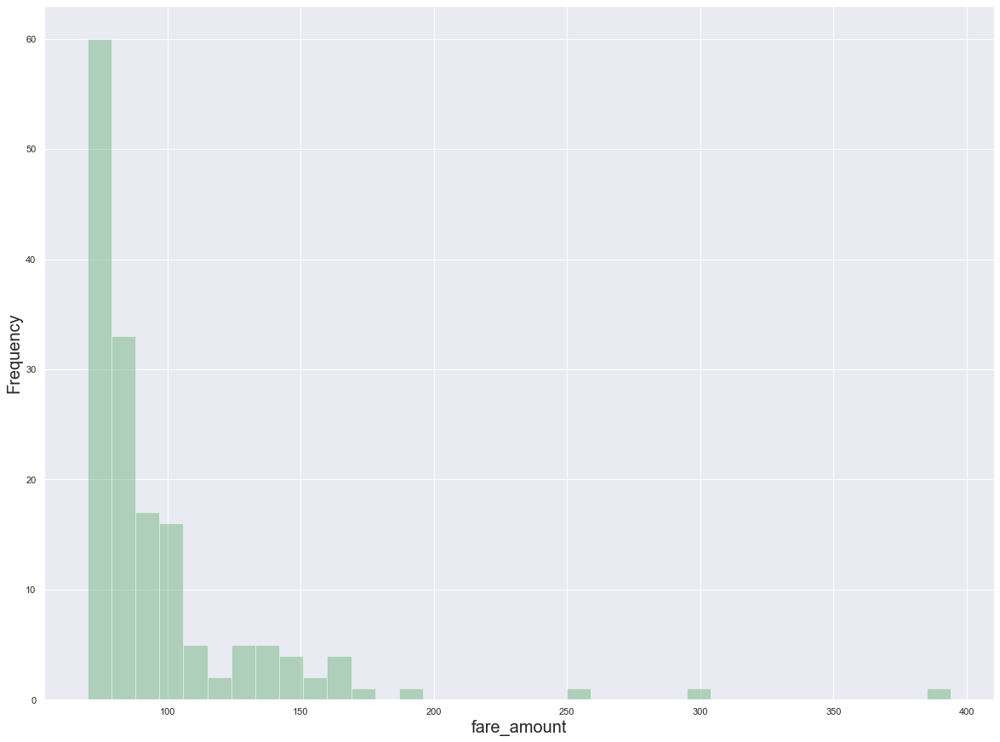

In [32]:
#Zooming the plot with in the range of over 100
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(20,15)})
p=sns.distplot(train[train['fare_amount']>=70]['fare_amount'],color="g",kde=False)
p.set_xlabel("fare_amount", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
#p.set_xlim(0,90)

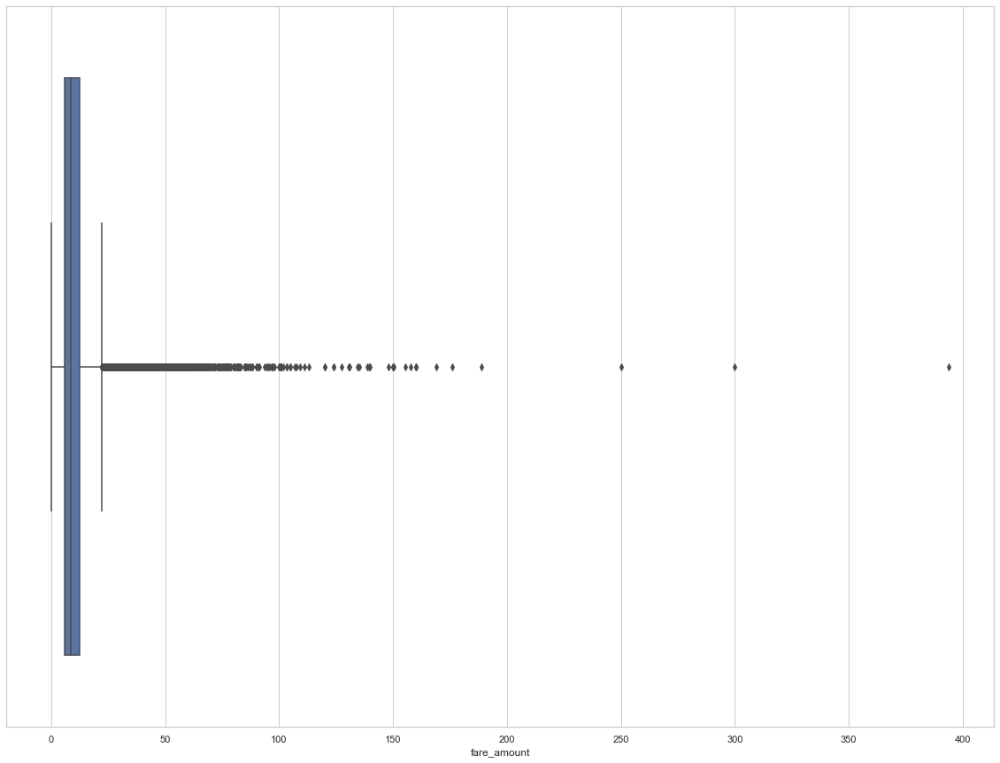

In [33]:
#Lets check box plot 
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=train["fare_amount"])

In [34]:
train["fare_amount"].describe()

count    99997.000000
mean        11.334091
std          9.810489
min          0.000000
25%          6.000000
50%          8.500000
75%         12.500000
max        394.000000
Name: fare_amount, dtype: float64

In [35]:
train.dtypes

key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

According to box plot and statistics given below outliers are:

Q1 = 6

Q3 = 12.5

IQR= Q3-Q1 = 12.5-6=6.5

Outliers< Q1-1.5IQR=6-1.56.5  < -3.75

Outliers> Q3+1.5IQR=12.5+1.56.5 > 22.5

In [36]:
#Look for no. of  fare_amount values greater than 22.5.
train.loc[train['fare_amount'] >22.5 ]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
37,2013-07-21 23:40:00.00000053,26.00,2013-07-21 23:40:00 UTC,-73.864645,40.770967,-73.983777,40.760267,1
39,2011-07-10 20:07:56.0000005,32.10,2011-07-10 20:07:56 UTC,0.000000,0.000000,0.000000,0.000000,2
51,2012-08-06 00:45:35.0000003,45.00,2012-08-06 00:45:35 UTC,-73.781830,40.644827,-73.969792,40.765402,1
66,2014-01-29 08:59:16.0000004,30.00,2014-01-29 08:59:16 UTC,-74.000590,40.710454,-74.023889,40.609115,1
76,2011-09-30 12:22:00.00000018,30.90,2011-09-30 12:22:00 UTC,-73.866543,40.771125,-73.972412,40.757493,1
...,...,...,...,...,...,...,...,...
99934,2013-01-30 20:17:42.0000001,25.50,2013-01-30 20:17:42 UTC,-73.967362,40.766005,-73.989590,40.688709,1
99941,2014-11-11 18:27:00.000000138,34.33,2014-11-11 18:27:00 UTC,-73.866000,40.770750,-73.974870,40.756400,1
99961,2014-12-14 00:04:00.000000191,24.50,2014-12-14 00:04:00 UTC,-73.974398,40.762255,-73.876623,40.749007,1
99965,2012-08-10 13:18:13.0000005,37.30,2012-08-10 13:18:13 UTC,-73.866003,40.770875,-73.983130,40.762585,1


There are 8433 no. of rows which is huge. Hence we can not simply remove it.

**Inference:Because most of the fare aomunt values are between 0 to 15 hence distance travelled should also be with in some range.** 

From this plot we can say that maximum of the fare amount values are betweem 0 to 15.
Also there are some peaks at fare amount 50 and 60 also. This may be possible beacuse usually people move only around some region and rarely go far away from that. This we can also try to see from Map.

From Google:
New York City Latitude and Longitudes are respecively 40.7128° N, 74.0060° W.

In [37]:
# import folium library
import folium

In [38]:
# this will help us to see the pickup and dropoff latitude and longitude of training set.
nyc=folium.Map(location=[40.730610,-73.935242],zoom_start=12)
for i in train.index[:100]:
    folium.CircleMarker(location=(train['pickup_latitude'][i],train['pickup_longitude'][i]),color='green').add_to(nyc)
    folium.CircleMarker(location=(train['dropoff_latitude'][i],train['dropoff_longitude'][i]),color='red').add_to(nyc)
nyc

Next let us explore the pickup latitude and longitudes,

In [39]:
train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000,99997.000000
mean,11.334091,-72.448769,39.887288,-72.479214,39.890039,1.682150
std,9.810489,10.869903,6.383911,12.774453,6.260816,1.308626
min,0.000000,-736.516667,-74.015935,-2319.633333,-74.011085,0.000000
25%,6.000000,-73.992133,40.734792,-73.991443,40.734033,1.000000
50%,8.500000,-73.981850,40.752463,-73.980215,40.753088,1.000000
75%,12.500000,-73.967173,40.767032,-73.963721,40.768042,2.000000
max,394.000000,40.801777,404.666667,40.787037,44.640672,6.000000


From this we can see that dropoff_longitude has minimum -2319.633333 and pickup_latitude has maximum 404.666667. These are incorrect values.

Googling gave me this info

1. Latitudes range from -90 to 90.

2. Longitudes range from -180 to 180.

The above description clearly shows some outliers. Let's filter them.

In [40]:
# Selecting those rows where pickup_latitude range from -90 to 90.
train[(train['pickup_latitude']<-90) | (train['pickup_latitude']>90)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
8246,2011-10-06 15:39:00.000000218,3.7,2011-10-06 15:39:00 UTC,-74.002867,404.666667,-73.997507,40.75414,1


In [41]:
#We need to drop these outliers
train = train.drop(((train[train['pickup_latitude']<-90])).index, axis=0)
train = train.drop(((train[train['pickup_latitude']>90])).index, axis=0)
train.shape


(99996, 8)

In [42]:
# Selecting those rows where pickup_longitude range from -180 to 180.
train[(train['pickup_longitude']<-180) | (train['pickup_longitude']>180)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
5897,2012-05-26 08:18:00.00000070,19.3,2012-05-26 08:18:00 UTC,-736.516667,40.7548,-73.940955,40.829285,6


In [43]:
#We need to drop these outliers
train = train.drop(((train[train['pickup_longitude']<-180])).index, axis=0)
train = train.drop(((train[train['pickup_longitude']>180])).index, axis=0)
train.shape

(99995, 8)

In [44]:
# Selecting those rows where dropoff_latitude Latitudes range from -90 to 90.
train[(train['dropoff_latitude']<-90) | (train['dropoff_latitude']>90)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [45]:
#We need to drop these outliers
train = train.drop(((train[train['dropoff_latitude']<-90])).index, axis=0)
train = train.drop(((train[train['dropoff_latitude']>90])).index, axis=0)
train.shape

(99995, 8)

In [46]:
# Selecting those rows where pickup_longitude range from -180 to 180.
train[(train['dropoff_longitude']<-180) | (train['dropoff_longitude']>180)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
74773,2012-05-30 18:55:00.000000162,12.9,2012-05-30 18:55:00 UTC,-73.974927,40.761857,-2319.633333,0.021667,1


In [47]:
#We need to drop these outliers
train = train.drop(((train[train['dropoff_longitude']<-180])).index, axis=0)
train = train.drop(((train[train['dropoff_longitude']>180])).index, axis=0)
train.shape

(99994, 8)

Doing the same with the test data data also.

In [48]:
# Selecting those rows where Latitudes range from -90 to 90.
test[(test['pickup_latitude']<-90) | (test['pickup_latitude']>90)]

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [49]:
#We need to drop these outliers
test = test.drop(((test[test['pickup_latitude']<-90])).index, axis=0)
test = test.drop(((test[test['pickup_latitude']>90])).index, axis=0)
test.shape

(9914, 7)

In [50]:
# Selecting those rows where pickup_longituderange from -180 to 180.
test[(test['pickup_longitude']<-180) | (test['pickup_longitude']>180)]

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [51]:
#We need to drop these outliers
test = test.drop(((test[test['pickup_longitude']<-180])).index, axis=0)
test = test.drop(((test[test['pickup_longitude']>180])).index, axis=0)
test.shape

(9914, 7)

In [52]:
# Selecting those rows where Latitudes range from -90 to 90.
test[(test['dropoff_latitude']<-90) | (test['dropoff_latitude']>90)]

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [53]:
#We need to drop these outliers
test = test.drop(((test[test['dropoff_longitude']<-180])).index, axis=0)
test = test.drop(((test[test['dropoff_longitude']>180])).index, axis=0)
test.shape

(9914, 7)

In [54]:
# Selecting those rows where pickup_longituderange from -180 to 180.
test[(test['dropoff_longitude']<-180) | (test['dropoff_longitude']>180)]

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [55]:
#We need to drop these outliers
test = test.drop(((train[train['dropoff_longitude']<-180])).index, axis=0)
test = test.drop(((train[train['dropoff_longitude']>180])).index, axis=0)
test.shape

(9914, 7)

**Now lets do Some Feature Engineering**

Check the data types of each column

In [56]:
train.dtypes

key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

key and pickup_datetime seem to be datetime columns which are in object format. Let's convert them to datetime

In [57]:
#Convert for train data
train['key'] = pd.to_datetime(train['key'])
train['pickup_datetime']  = pd.to_datetime(train['pickup_datetime'])

In [58]:
#Convert for test data
test['key'] = pd.to_datetime(test['key'])
test['pickup_datetime']  = pd.to_datetime(test['pickup_datetime'])

In [59]:
#check the dtypes after conversion
train.dtypes

key                       datetime64[ns]
fare_amount                      float64
pickup_datetime      datetime64[ns, UTC]
pickup_longitude                 float64
pickup_latitude                  float64
dropoff_longitude                float64
dropoff_latitude                 float64
passenger_count                    int64
dtype: object

In [60]:
test.dtypes

key                       datetime64[ns]
pickup_datetime      datetime64[ns, UTC]
pickup_longitude                 float64
pickup_latitude                  float64
dropoff_longitude                float64
dropoff_latitude                 float64
passenger_count                    int64
dtype: object

First, let's split the datetime field 'pickup_datetime' to the following - 
* year
* month
* date
* hour
* day of week

Using these we shall calculate the day of the week and come to our conclusions about how pickup_location affects the fare.
Also, create a new field 'distance' to fetch the distance between the pickup and the drop.

We can calulate the distance in a sphere when latitudes and longitudes are given by [Haversine formula](https://en.wikipedia.org/wiki/Haversine_formula)

**haversine(θ) = sin²(θ/2)**

Eventually, the formual boils down to the following where φ is latitude, λ is longitude, R is earth’s radius (mean radius = 6,371km) to include latitude and longitude coordinates (A and B in this case).

**a = sin²((φB - φA)/2) + cos φA . cos φB . sin²((λB - λA)/2)**

**c = 2 * atan2( √a, √(1−a) )**

**d = R ⋅ c**

**d = Haversine distance**

*Refer [this](https://community.esri.com/groups/coordinate-reference-systems/blog/2017/10/05/haversine-formula) page for more info and examples on Haversine formula*

Is this distance equal to the road travel distance? Do we have to do something else?

**ANSWER: This is not the exact measurement because the formula assumes that the Earth is a perfect sphere when in fact it is an oblate spheroid. TO get exact distane we can use other API like Google API**

In [61]:
def haversine_distance(lat1, long1, lat2, long2):
    data = [train, test]
    data
    for i in data:
        R = 6371  #radius of earth in kilometers
        phi1 = np.radians(i[lat1])
        phi2 = np.radians(i[lat2])
    
        delta_phi = np.radians(i[lat2]-i[lat1])
        delta_lambda = np.radians(i[long2]-i[long1])
    
        #a = sin²((φB - φA)/2) + cos φA . cos φB . sin²((λB - λA)/2)
        a = np.sin(delta_phi / 2.0) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0) ** 2
    
        #c = 2 * atan2( √a, √(1−a) )
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    
        #d = R*c
        d = 0.621371*(R * c) #in miles
        i['H_Distance'] = d
    return d

In [62]:
haversine_distance('pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude')

0        1.443606
1        1.507044
2        0.384397
3        1.218529
4        3.347513
          ...    
9909     1.320335
9910     2.032485
9911    11.920345
9912     5.184400
9913     0.733731
Length: 9914, dtype: float64

In [63]:
train['H_Distance'].head()


0    0.693978
1    0.655579
2    1.687618
3    3.169844
4    2.982949
Name: H_Distance, dtype: float64

In [64]:
test['H_Distance'].head()

0    1.443606
1    1.507044
2    0.384397
3    1.218529
4    3.347513
Name: H_Distance, dtype: float64

In [65]:
train.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance
0,2009-04-08 19:11:10.000000400,4.9,2009-04-08 19:11:10+00:00,-73.998287,40.727490,-73.989854,40.735239,2,0.693978
1,2012-07-30 16:19:08.000000300,4.9,2012-07-30 16:19:08+00:00,-73.966597,40.794345,-73.965682,40.803808,2,0.655579
2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00+00:00,-73.971638,40.763382,-73.953767,40.783715,1,1.687618
3,2010-10-07 21:09:35.000000200,14.1,2010-10-07 21:09:35+00:00,-74.003545,40.707399,-73.981312,40.750071,1,3.169844
4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00+00:00,-74.004532,40.707465,-73.977908,40.745633,5,2.982949


In [66]:
test.head()

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance
0,2015-01-27 13:08:24.000000200,2015-01-27 13:08:24+00:00,-73.973320,40.763805,-73.981430,40.743835,1,1.443606
1,2015-01-27 13:08:24.000000300,2015-01-27 13:08:24+00:00,-73.986862,40.719383,-73.998886,40.739201,1,1.507044
2,2011-10-08 11:53:44.000000200,2011-10-08 11:53:44+00:00,-73.982524,40.751260,-73.979654,40.746139,1,0.384397
3,2012-12-01 21:12:12.000000200,2012-12-01 21:12:12+00:00,-73.981160,40.767807,-73.990448,40.751635,1,1.218529
4,2012-12-01 21:12:12.000000300,2012-12-01 21:12:12+00:00,-73.966046,40.789775,-73.988565,40.744427,1,3.347513


Now that we have calculated the distance, we shall create columns for the following -


*   year
*   month
*   date
*   hour
*   day of week






In [67]:
# year, month, date, hour, day of week
data = [train,test]
for i in data:
    i['Year'] = i['pickup_datetime'].dt.year
    i['Month'] = i['pickup_datetime'].dt.month
    i['Date'] = i['pickup_datetime'].dt.day
    i['Day of Week'] = i['pickup_datetime'].dt.dayofweek
    i['Hour'] = i['pickup_datetime'].dt.hour

In [68]:
train.head(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
0,2009-04-08 19:11:10.000000400,4.9,2009-04-08 19:11:10+00:00,-73.998287,40.727490,-73.989854,40.735239,2,0.693978,2009,4,8,2,19
1,2012-07-30 16:19:08.000000300,4.9,2012-07-30 16:19:08+00:00,-73.966597,40.794345,-73.965682,40.803808,2,0.655579,2012,7,30,0,16
2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00+00:00,-73.971638,40.763382,-73.953767,40.783715,1,1.687618,2011,2,22,1,13
3,2010-10-07 21:09:35.000000200,14.1,2010-10-07 21:09:35+00:00,-74.003545,40.707399,-73.981312,40.750071,1,3.169844,2010,10,7,3,21
4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00+00:00,-74.004532,40.707465,-73.977908,40.745633,5,2.982949,2009,10,2,4,22


In [69]:
test.head()

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
0,2015-01-27 13:08:24.000000200,2015-01-27 13:08:24+00:00,-73.973320,40.763805,-73.981430,40.743835,1,1.443606,2015,1,27,1,13
1,2015-01-27 13:08:24.000000300,2015-01-27 13:08:24+00:00,-73.986862,40.719383,-73.998886,40.739201,1,1.507044,2015,1,27,1,13
2,2011-10-08 11:53:44.000000200,2011-10-08 11:53:44+00:00,-73.982524,40.751260,-73.979654,40.746139,1,0.384397,2011,10,8,5,11
3,2012-12-01 21:12:12.000000200,2012-12-01 21:12:12+00:00,-73.981160,40.767807,-73.990448,40.751635,1,1.218529,2012,12,1,5,21
4,2012-12-01 21:12:12.000000300,2012-12-01 21:12:12+00:00,-73.966046,40.789775,-73.988565,40.744427,1,3.347513,2012,12,1,5,21



Now, for **EDA**. The following are my considerations - 
1. Does the number of passengers affect the fare? 
2. Does the date and time of pickup affect the fare?
3. Does the day of the week affect the fare?
4. Does the distance travelled affect the fare?
5. Does the year of  travell affect the fare?

Now let us check with the correlation matrix first

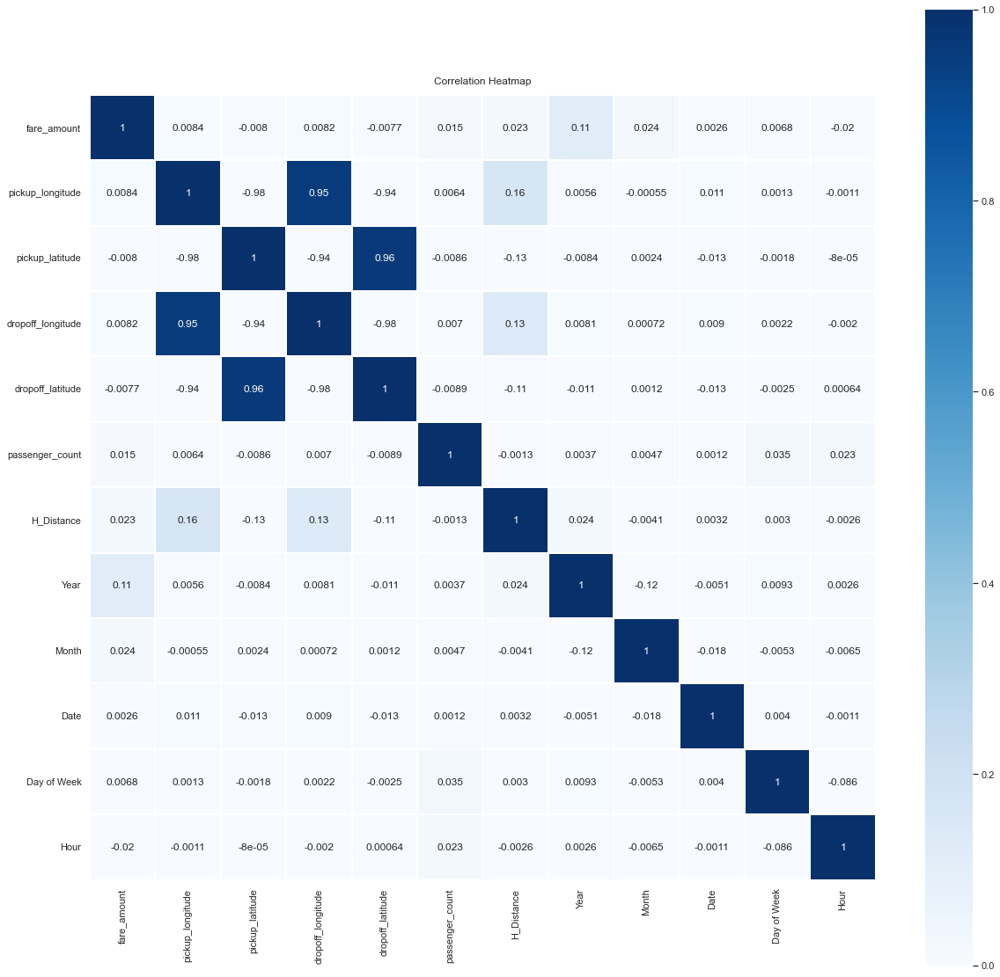

In [70]:
#code to create a correlation matrix/heat map
colormap = plt.cm.RdBu
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(train.corr(),linewidths=0.1,vmax=1.0,vmin=0, 
            square=True, cmap="Blues", linecolor='white', annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

From this matrix , we can notice that there is some correlation between fare amount and H_dstance, fare amount and year.

In [71]:
#Let us make pair plots

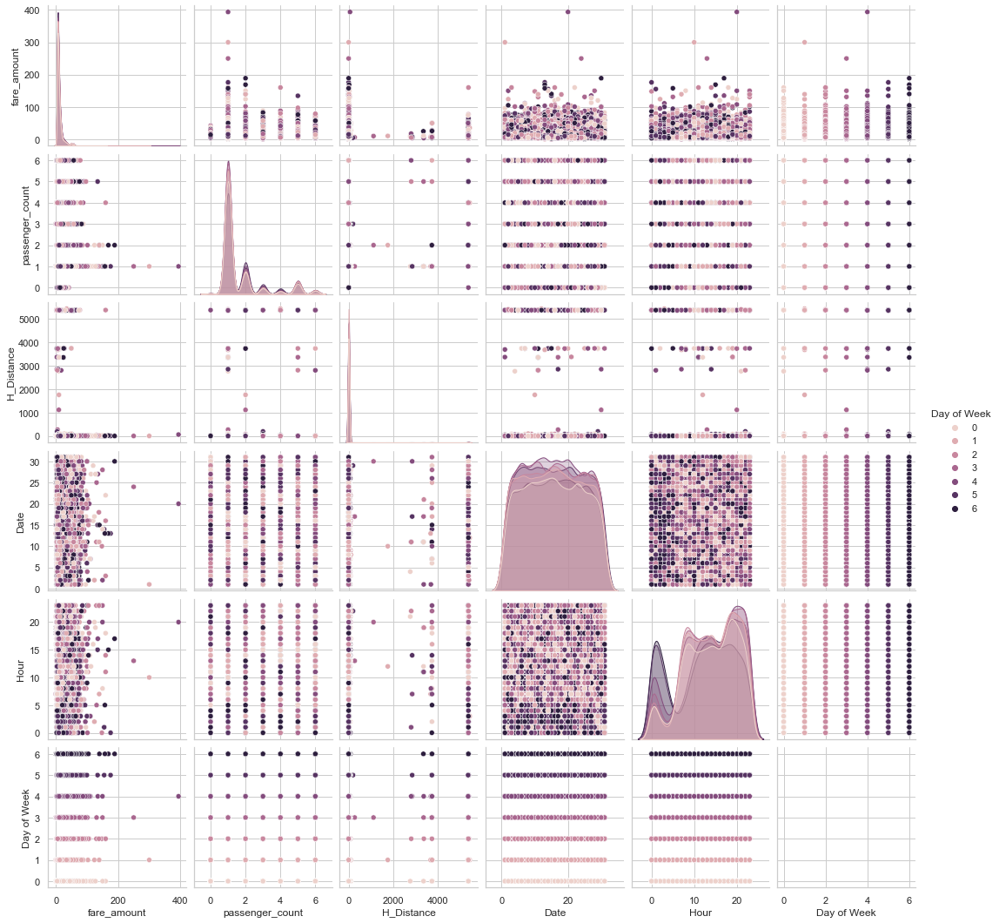

In [72]:
sns.pairplot(train, vars = ["fare_amount", "passenger_count", "H_Distance", "Date", "Hour","Day of Week"],hue ='Day of Week', dropna = True)

These plots are showing the relations among all the attributes.

**1. Does the number of passengers affect the fare?**

(0.0, 70.0)

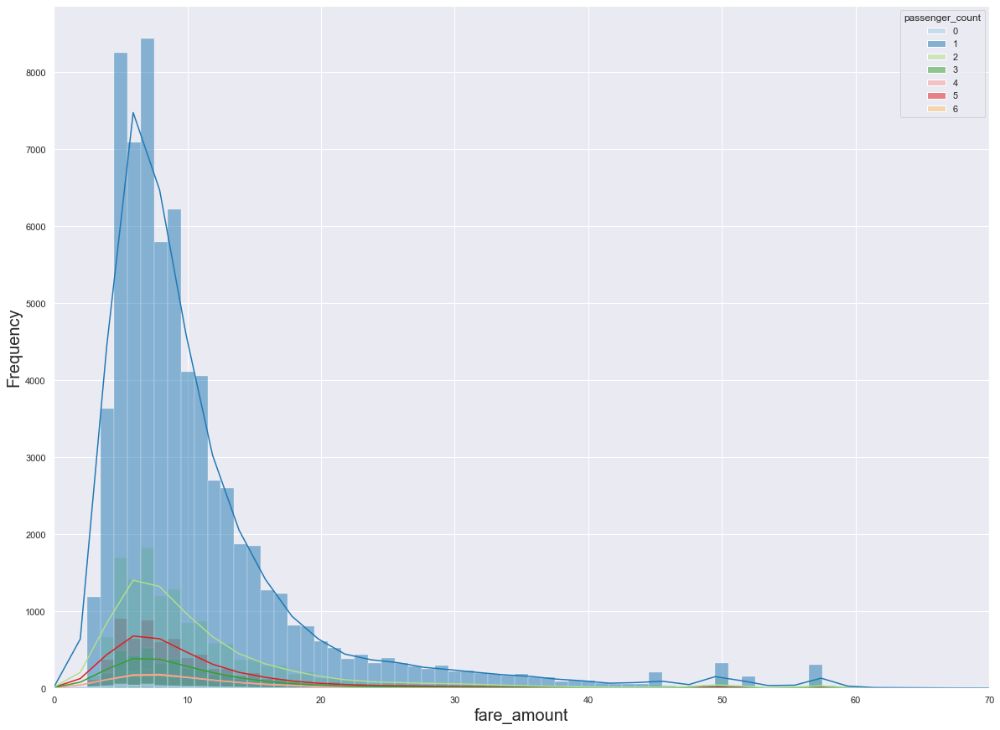

In [73]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(20,15)})
p=sns.histplot(data=train,x='fare_amount',hue='passenger_count',palette="Paired",discrete=True,kde = True)
p.set_xlabel("fare_amount", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,70)

From above histogram we can clearly say that passenger_count =1 is more frequent and hence contributing more to the fare amount.

<AxesSubplot:xlabel='passenger_count', ylabel='fare_amount'>

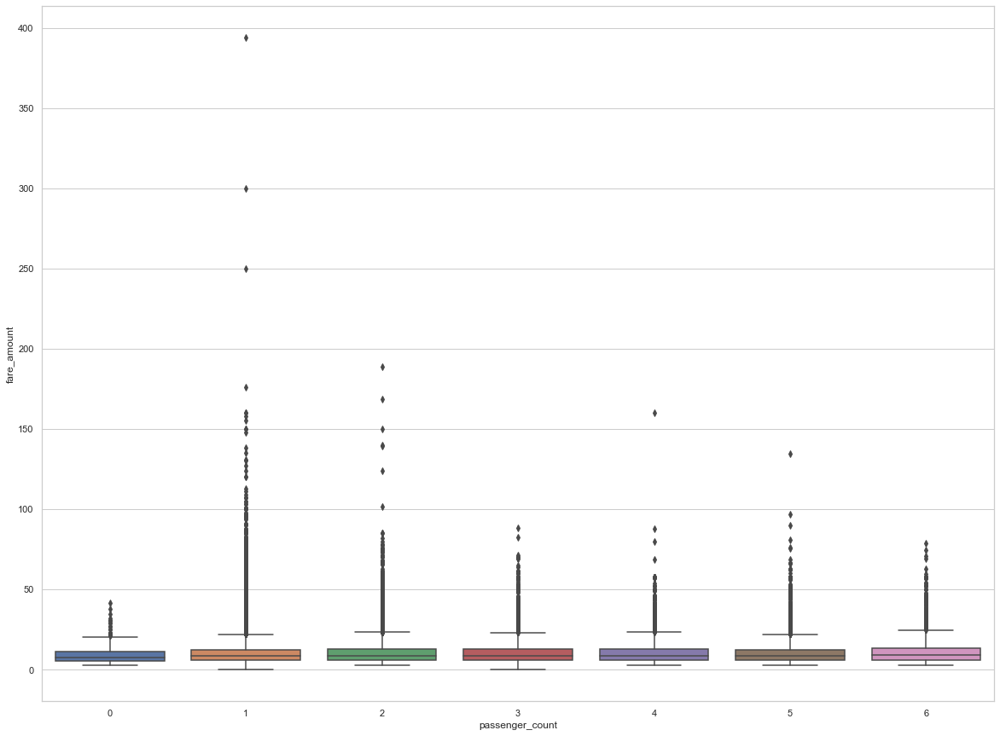

In [74]:
#Let us check with box plot
sns.set_style("whitegrid")
sns.boxplot(x ='passenger_count', y = 'fare_amount', data = train)

From this passenger vs fare amount box polt we can see that there are many data that are outside and can br treated as outliers 

Text(0, 0.5, 'Fare amount')

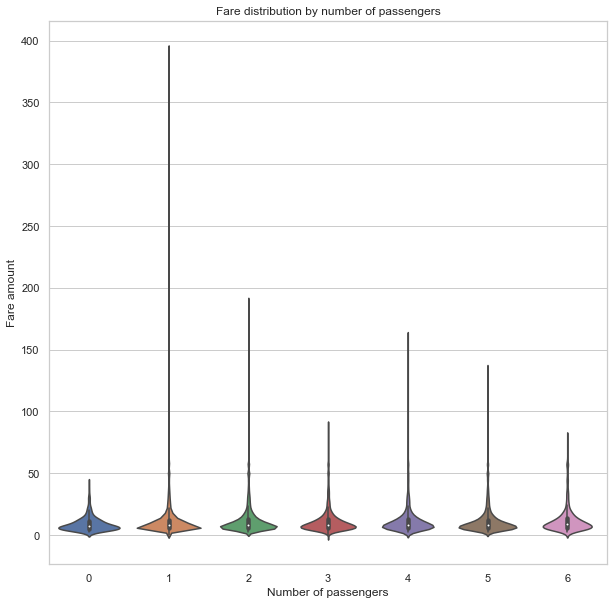

In [75]:
plt.figure(figsize=(10,10))
sns.violinplot(x="passenger_count", y="fare_amount", data=train)
plt.title('Fare distribution by number of passengers')
plt.xlabel('Number of passengers')
plt.ylabel('Fare amount')

From this box graph and violinplot we can clearly see that maximun fare amount charged is also coming from single passengers.

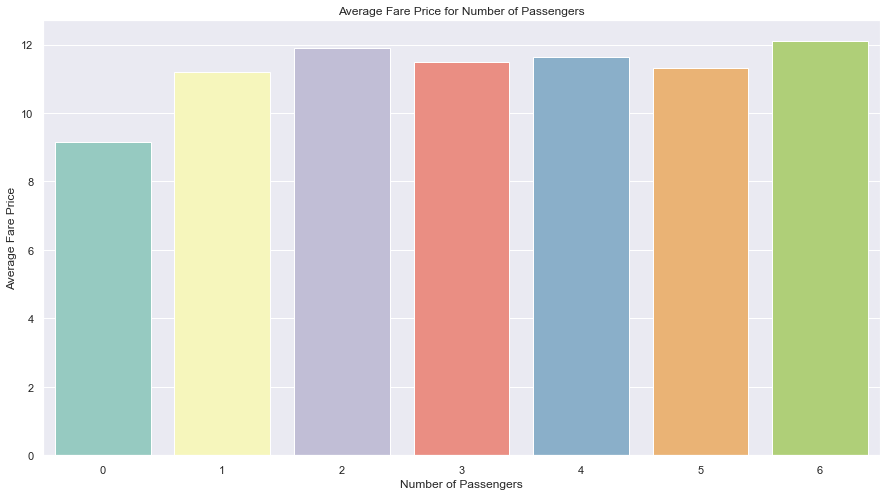

In [76]:
#bar plot Average Fare Price for Number of Passengers'
sns.set(rc = {'figure.figsize':(15,8)})
passenger_fare = train.groupby(['passenger_count']).mean()
sns.barplot(x=passenger_fare.index, y=passenger_fare['fare_amount'], palette = "Set3")
plt.xlabel('Number of Passengers')
plt.ylabel('Average Fare Price')
plt.title('Average Fare Price for Number of Passengers')
plt.show()

From this we can say that average fare for number of the passengers. So here maximum average fare is coming from passenger count 2 and 6 are more. 

This thing we can also check using mean command as:

In [77]:
train.groupby(['passenger_count']).mean()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,H_Distance,Year,Month,Date,Day of Week,Hour
passenger_count,,,,,,,,,,,
0,9.146341,-72.976423,40.199501,-72.772396,40.091321,16.433888,2011.346883,6.094851,16.327913,2.962060,13.623306
1,11.189200,-72.448363,39.892452,-72.461044,39.897836,12.346000,2011.765712,6.252106,15.697628,2.954986,13.335194
2,11.886414,-72.539721,39.942473,-72.585469,39.962507,11.690290,2011.627888,6.296140,15.604444,3.224178,14.147730
3,11.484771,-72.491776,39.920452,-72.525530,39.941598,12.262632,2011.693787,6.380774,15.798593,3.314654,13.741149
4,11.621013,-72.466676,39.892408,-72.537338,39.930510,17.264523,2011.694327,6.408345,15.911392,3.480544,13.649320
5,11.310228,-72.306408,39.784313,-72.273611,39.773264,8.784542,2011.395866,6.213082,15.781962,3.048563,13.717117
6,12.099054,-71.798802,39.383160,-71.762034,39.363567,15.211992,2012.926966,6.382959,15.542135,3.051030,13.683521


Text(0.5, 1.0, 'Passanger Count Bar Graph')

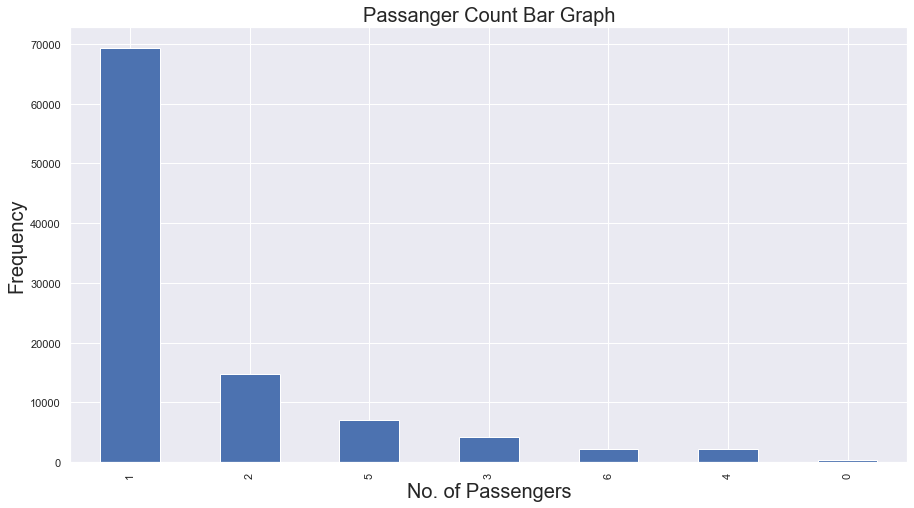

In [78]:
# Check the frequency of passenger_coun
sns.set(rc = {'figure.figsize':(15,8)})
p=train['passenger_count'].value_counts().plot.bar()
p.set_xlabel("No. of Passengers", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
plt.title("Passanger Count Bar Graph",fontsize = 20)

Also frequency of one passenger count rides are more. Here passenger count zero is also present. May be it is beacuse of passenger booked the ride but then cancelled.

Cleary passenger count will affect Fare Amount.

**2. Does the date and time of pickup affect the fare?**

Text(0.5, 1.0, 'Date of pickup vs Fare Amount')

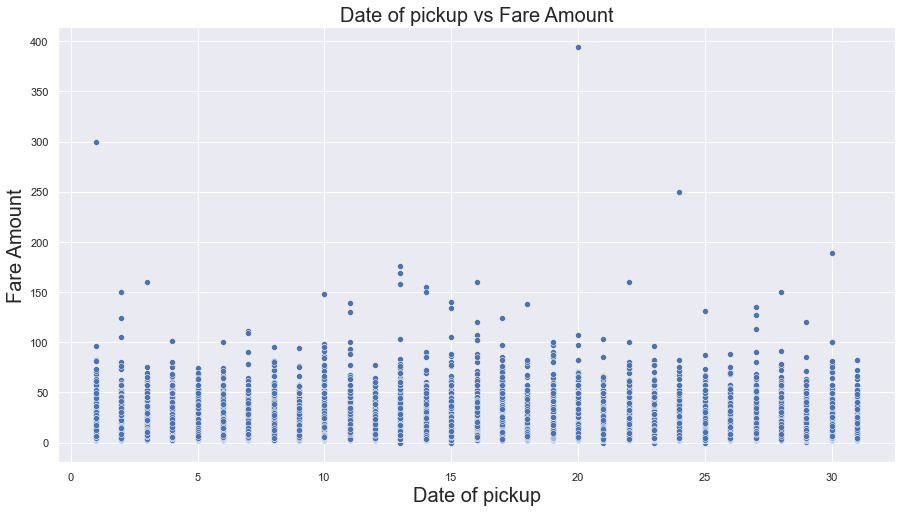

In [79]:
# Let us check with the help of scatter plot
sns.set(rc = {'figure.figsize':(15,8)})
sns.scatterplot(x="Date",
                y="fare_amount",
               data=train)
plt.xlabel("Date of pickup", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Date of pickup vs Fare Amount",fontsize = 20)

The maximum fare was paid on the 20th, 1st, and 24th rspectively. The rates throughout the month generally appear to be consistent.

Text(0.5, 1.0, 'Average Fare Price for Date of pickup')

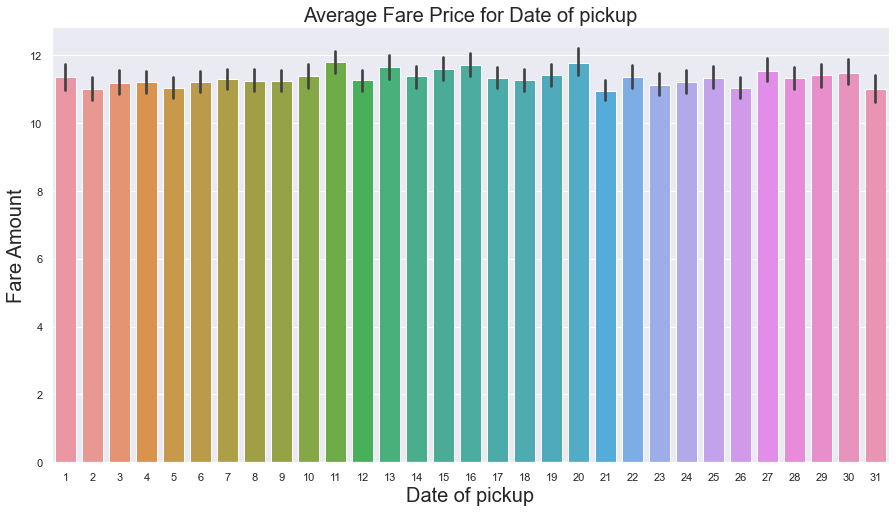

In [80]:
# Now let us check average fare amount on a particular date
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.barplot(x="Date",
                y="fare_amount",
               data=train)
plt.xlabel("Date of pickup", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Average Fare Price for Date of pickup",fontsize = 20)

It seems like average fare amount is fluctuating but not huge.

Text(0.5, 1.0, 'Bar graph for Hour of pickup')

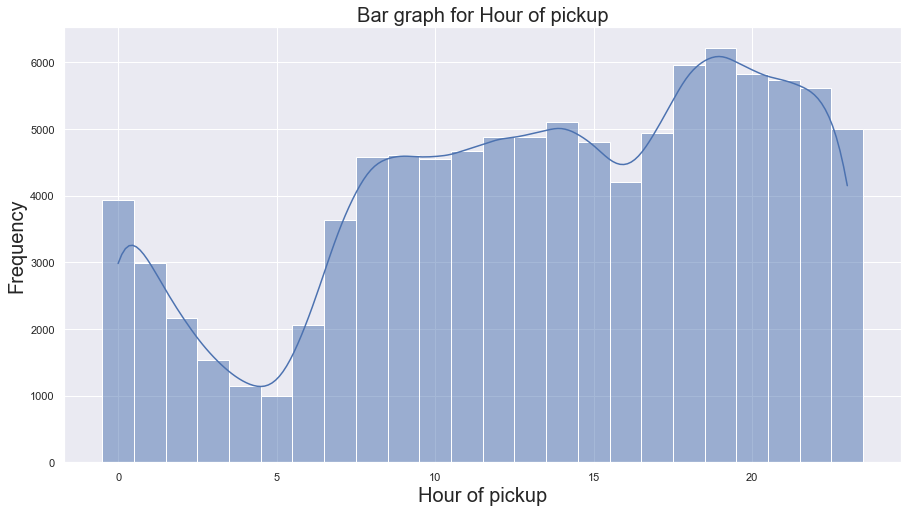

In [81]:
# Lets generate bar plot for hour frequency
sns.set(rc = {'figure.figsize':(15,8)})
p=sns.histplot(train['Hour'],discrete=True,kde=True)
p.set_xlabel("Hour", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
plt.xlabel("Hour of pickup", fontsize = 20)
plt.ylabel("Frequency", fontsize = 20)
plt.title("Bar graph for Hour of pickup",fontsize = 20)

From this graph we can easily say that tha high frequency of travel is betweem 6 PM to 10 PM. And at 5.00AM morning frequency is quite low.

Text(0.5, 1.0, 'Average Fare Price for Hour of pickup')

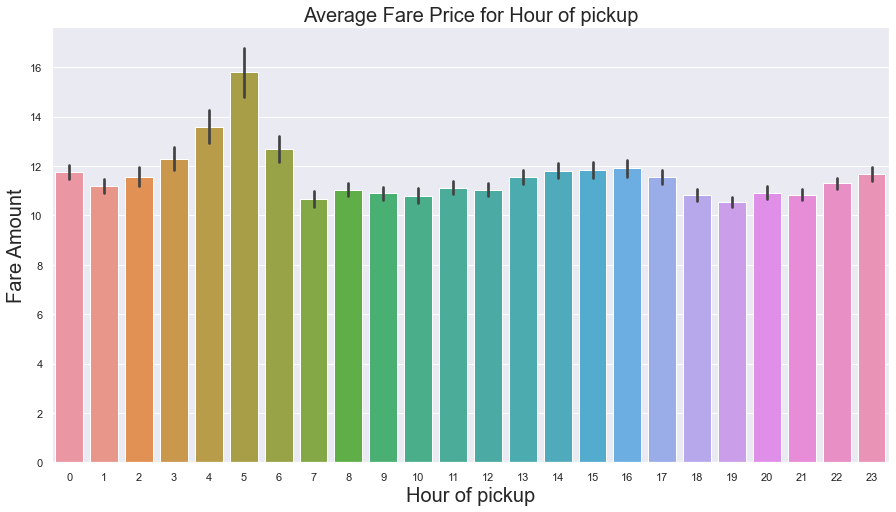

In [82]:
# Average Fare amount vs hour
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.barplot(x="Hour",
                y="fare_amount",
               data=train)
plt.xlabel("Hour of pickup", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Average Fare Price for Hour of pickup",fontsize = 20)

From this graph we can easily say that tha high frequency of travel is betweem 6 PM to 10 PM and average fare at those time are lower than other time. lower frequency of travel is between 3 AM to 5 AM and average fare at those time are higher than other time.

Certainly, the time of day has significant impact on fare amount

**3. Does the day of the week affect the fare?**

Text(0.5, 1.0, 'Histogram for Hour of pickup')

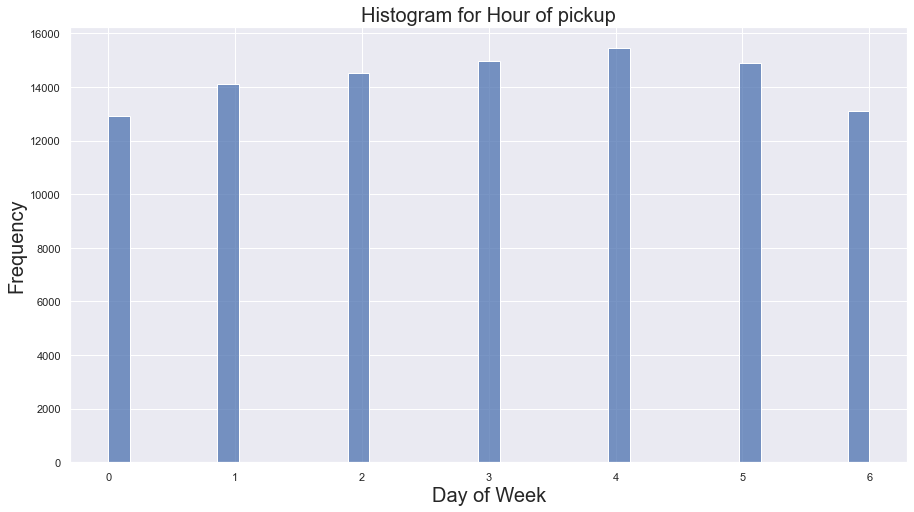

In [83]:
# Frequency of rides in a particular day of the week
sns.set(rc = {'figure.figsize':(15,8)})
p=sns.histplot(train['Day of Week'])
p.set_xlabel("Day of Week", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
plt.xlabel("Day of Week", fontsize = 20)
plt.ylabel("Frequency", fontsize = 20)
plt.title("Histogram for Hour of pickup",fontsize = 20)

From this we can say that some week days frequency of total rides are more than other days.

Text(0.5, 1.0, 'Average Fare Price for Day of Week')

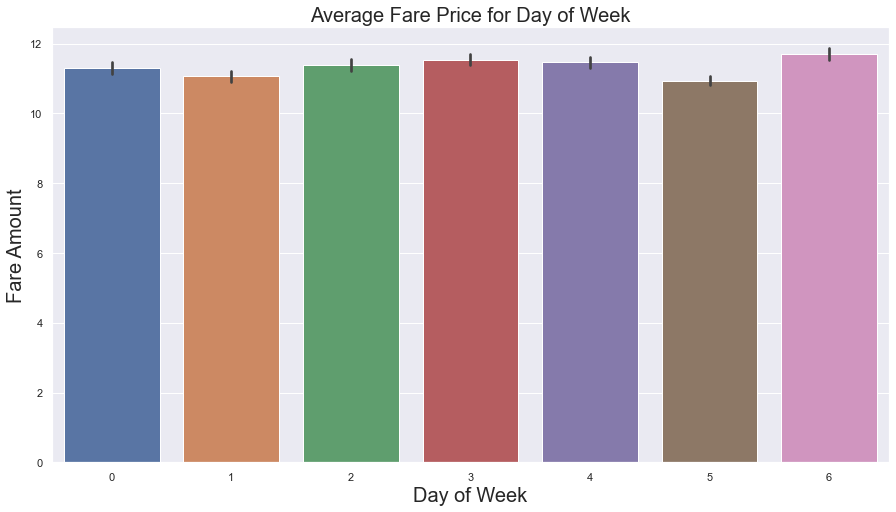

In [84]:
# Now let us check average fare price of a particular day of the week
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.barplot(x="Day of Week",
                y="fare_amount",
               data=train)
plt.xlabel("Day of Week", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Average Fare Price for Day of Week",fontsize = 20)

Average fare amount on friday's are low and on saturday's it is high.

Text(0.5, 1.0, 'Scatter Price for Fare Price VS Day of Week')

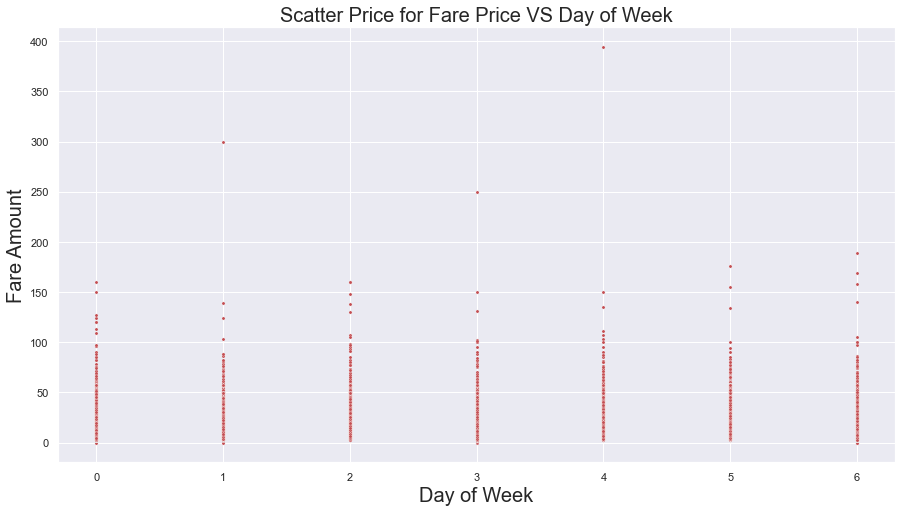

In [86]:
# We can also see it in scatter plot.
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.scatterplot(x="Day of Week",
                y="fare_amount",
               data=train,s=10,color='r')
plt.xlabel("Day of Week", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Scatter Price for Fare Price VS Day of Week",fontsize = 20)

From above Scatter plot we can see that some days maximum fare amounts are betweem 200 to 400.

From above we can say that Days of the week will have effect on Fare Amount.

**3. Does the Year affect the fare?**

Text(0.5, 1.0, 'Average Fare Price for Year')

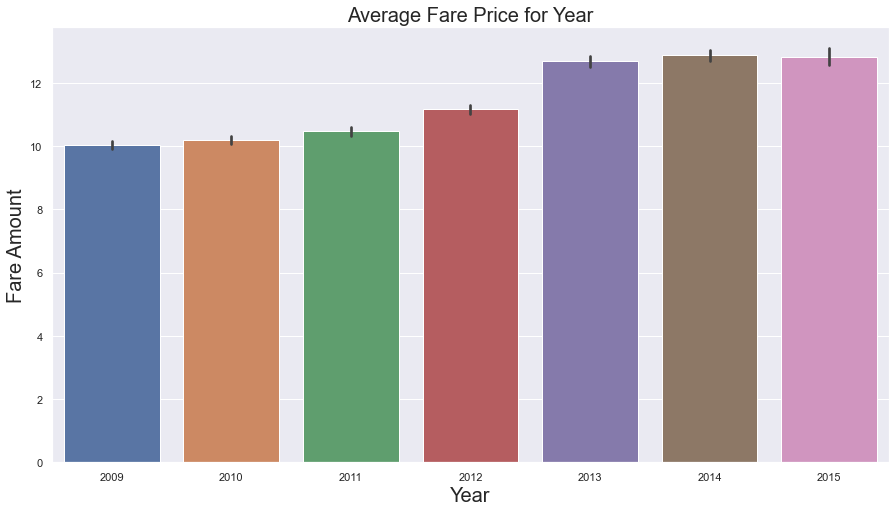

In [87]:
# Year of ride and average fare amount
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.barplot(x="Year",
                    y="fare_amount",
                    data=train)
plt.xlabel("Year", fontsize = 20)
plt.ylabel("Fare Amount", fontsize = 20)
plt.title("Average Fare Price for Year",fontsize = 20)

Clearly from this graph we can see that average fare amount is incresing year by year.

Text(0.5, 1.0, 'Bargraph for Year')

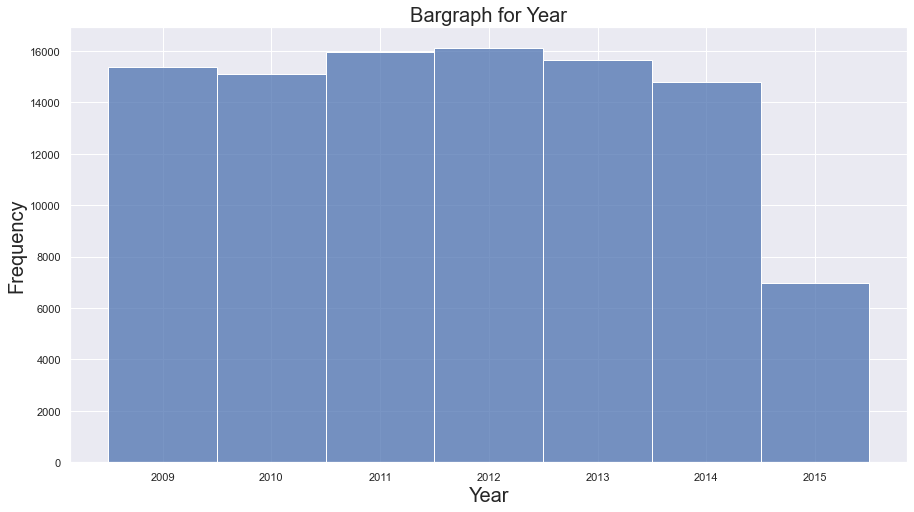

In [88]:
# Frequency of a particular year 
sns.set(rc = {'figure.figsize':(15,8)})
p=sns.histplot(train['Year'],discrete=True)
p.set_xlabel("Year", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
plt.xlabel("Year", fontsize = 20)
plt.ylabel("Frequency", fontsize = 20)
plt.title("Bargraph for Year",fontsize = 20)

Frequecy of rides are low in 2015. Also from above graph Averge Fare amount is very high in 2015.

Cleary Fare amount will be affected by Year of ride.

**4. Does the distance affect the fare?**

(0.0, 50.0)

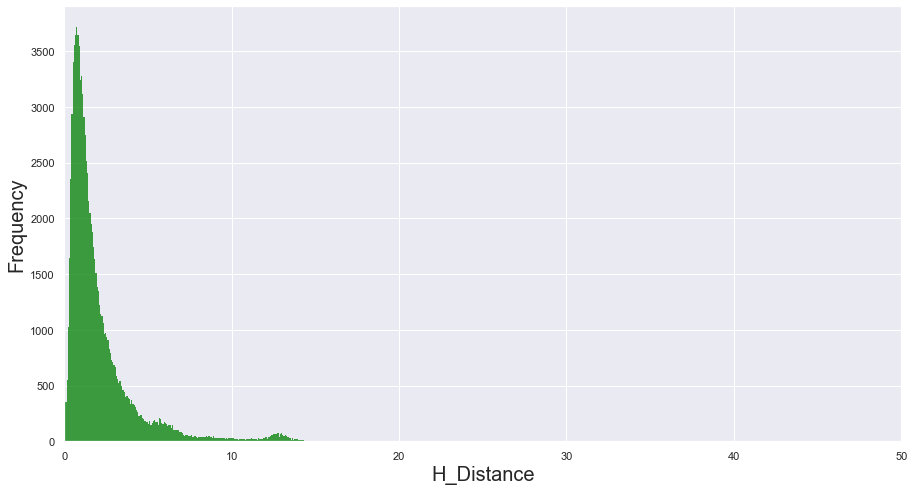

In [89]:
# Histogram of H_distance
sns.set(rc = {'figure.figsize':(15,8)})
p=sns.histplot(train["H_Distance"],color='green', kde = False)
p.set_xlabel("H_Distance", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,50)

From graph we can say that maximum frequency of travel is between 0 to somewhere between 5 miles. We can check for other informations also.

In [90]:
train["H_Distance"].describe()

count    99994.000000
mean        12.175608
std        228.869054
min          0.000000
25%          0.754861
50%          1.312470
75%          2.415823
max       5444.702133
Name: H_Distance, dtype: float64

Here we can see that mean is 12 miles and standard deviation is 228 miles which is very high. Also maximum distance is 5444.78 miles which is huge

Here minimum charges are zero. May be some one came to same location and may be someone cancalled the booking. We dont have any extra information about that.

Also see 75% percentile have travelled below 2.4 miles

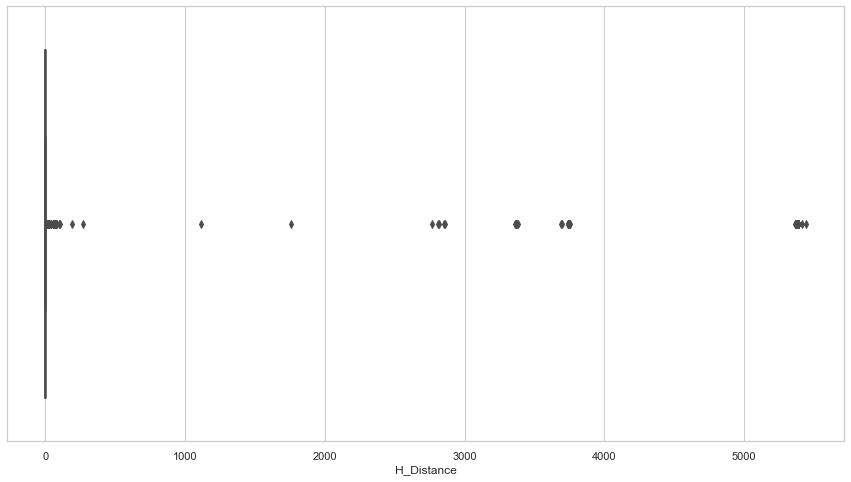

In [91]:
#Box plot for H distance
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=train["H_Distance"])

Check for outliers in H_distance using box plot

Q1 = 0.754861

Q3 = 2.415823

IQR= Q3-Q1 = 2.415823-0.754861=1.661

Outliers< Q1-1.5IQR= 0.754861-1.5*1.661 <-1.736582

Outliers> Q3+1.5IQR=2.415823+1.5*1.661 > 4.9073

But there are huge number of rows above 4.9 miles. So we can not drop it.

Now let us check histogram for distance less than 15 miles. This is what we have seen from above description.

(0.0, 15.0)

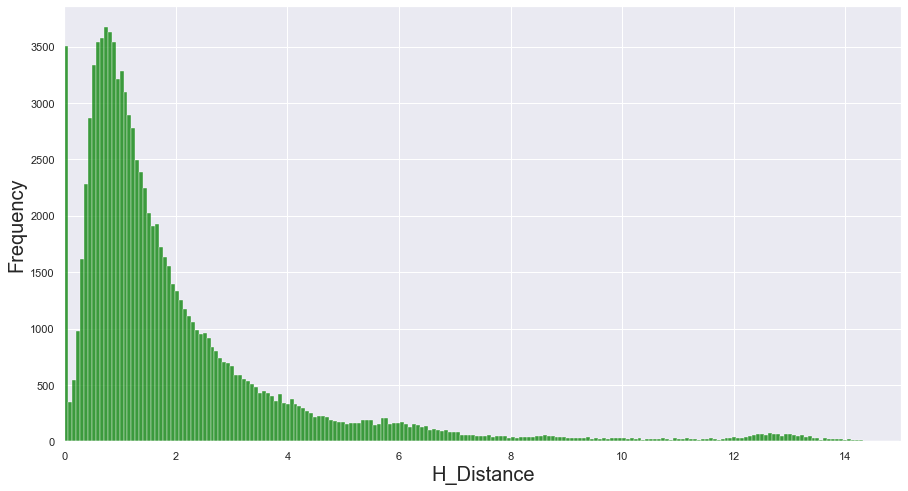

In [92]:
# Let us Zoom the histogram for distance less than 15 miles
sns.set(rc = {'figure.figsize':(15,8)})
#p=sns.histplot(train['Day of Week'])
p=sns.histplot(data=(train.loc[(train["H_Distance"]< 15)])["H_Distance"],color='green', kde = False)
p.set_xlabel("H_Distance", fontsize = 20)
p.set_ylabel("Frequency", fontsize = 20)
p.set_xlim(0,15)

From this we can see that most of the rides are between 0 to 4 miles.

In [93]:
train.groupby('passenger_count')['H_Distance','fare_amount'].mean()

C:\Users\shubh\AppData\Local\Temp\ipykernel_12604\507510172.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  train.groupby('passenger_count')['H_Distance','fare_amount'].mean()


,H_Distance,fare_amount
passenger_count,,
0,16.433888,9.146341
1,12.346000,11.189200
2,11.690290,11.886414
3,12.262632,11.484771
4,17.264523,11.621013
5,8.784542,11.310228
6,15.211992,12.099054


From this we can see that mean average distance is around 15 and mean fare amount is 11.5 But for passenger count 0 it is quite high and for passenger count 5 it is low.

Now let us check for scatter plot for Distance vs fare Amount

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='H_Distance', ylabel='fare_amount'>

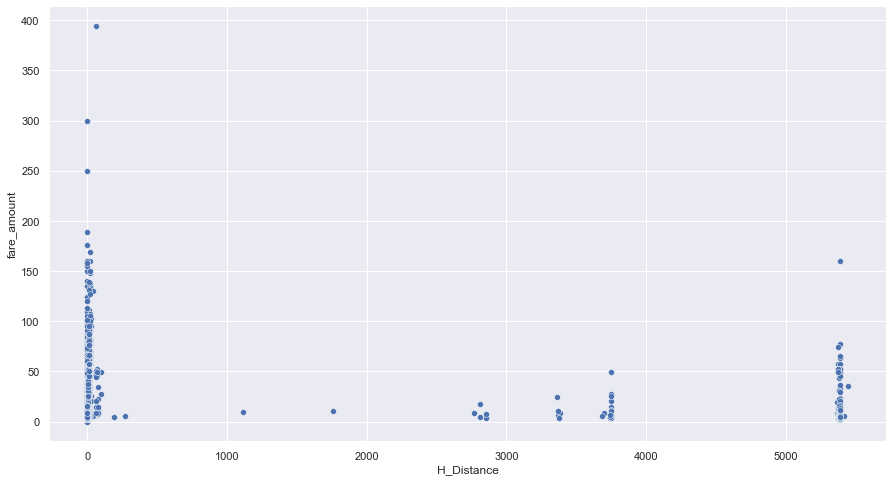

In [94]:
#Scatter plot
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.scatterplot("H_Distance",
                    "fare_amount", 
                    data=train)

See from this graph we can not see any thing. Lets Zoom it by setting the limit for distance betweem 0 to 50

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(0.0, 50.0)

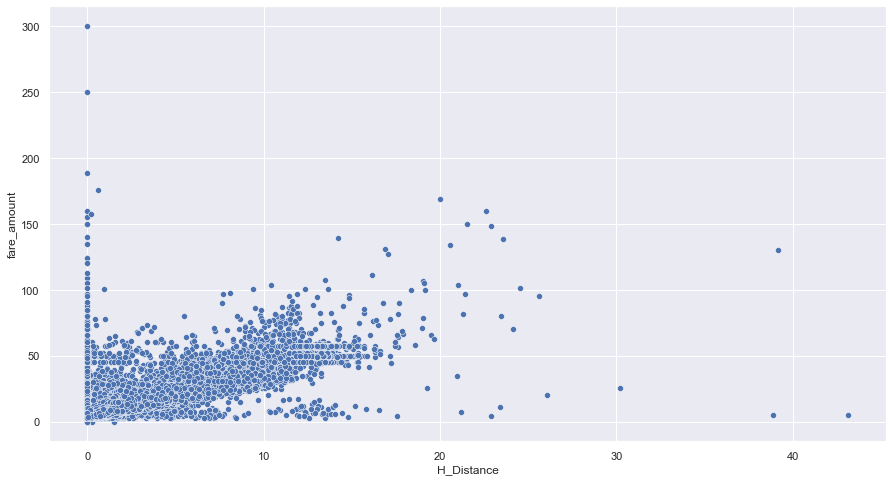

In [95]:
# Zoom it with in the range of 0 to 50
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
sns.scatterplot((train.loc[(train["H_Distance"]<50)])["H_Distance"],
                    y="fare_amount", 
                    data=train)
p.set_xlim(0,50)

Some Inferences from these Plots are:
1. On 0 miles distance there are many points on with some fare amount. There are some scenario where person has traveled zero but still being charged.
2. Highest Fare amount at 0 is around 300.
3. Distance 0 to 20, there is linear kind of relationship.
4. Also At price around 50 we can see horizontal lines. Showing price are constant over distance.
5. There is linear regression between distance miles and fare amount.
6. There are some cases where distance are high but still fare charges are very low.

Now let us check for distance between 50 to 3000

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='H_Distance', ylabel='fare_amount'>

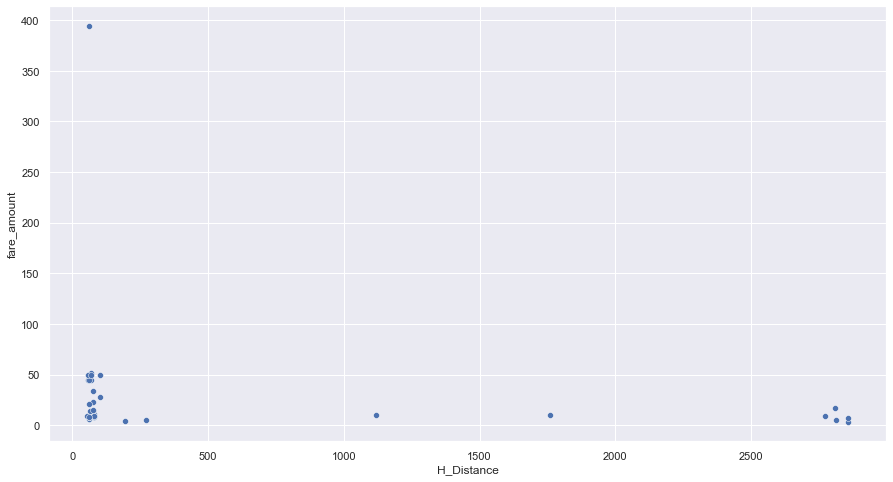

In [96]:
# Zoom it with in the range of 50 to 3000
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
#d=train.loc[(train['H_Distance'] >0) & (train["H_Distance"] == 0)]
d=train[(train['H_Distance'] >50) & (train['H_Distance'] < 3000)]
sns.scatterplot("H_Distance",
                    "fare_amount", 
                    data=d)

Now let us check for distance between 3000 to 5000

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='H_Distance', ylabel='fare_amount'>

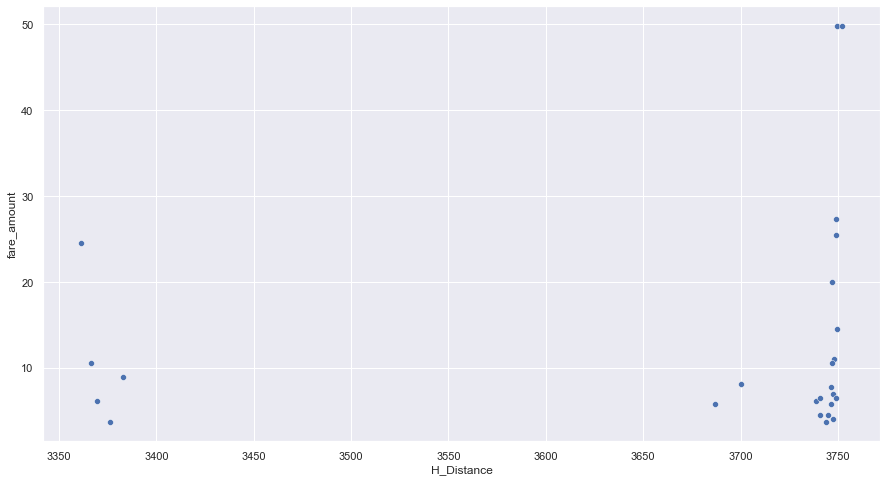

In [97]:
# Zoom it with in the range of 3000 to 5000
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
#d=train.loc[(train['H_Distance'] >0) & (train["H_Distance"] == 0)]
d=train[(train['H_Distance'] >3000) & (train['H_Distance'] < 5000)]
sns.scatterplot("H_Distance",
                    "fare_amount", 
                    data=d)

Here we can see that person has travelled thousands of miles but still being charged very less

Now let us check for distance between 3000 to 5000

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='H_Distance', ylabel='fare_amount'>

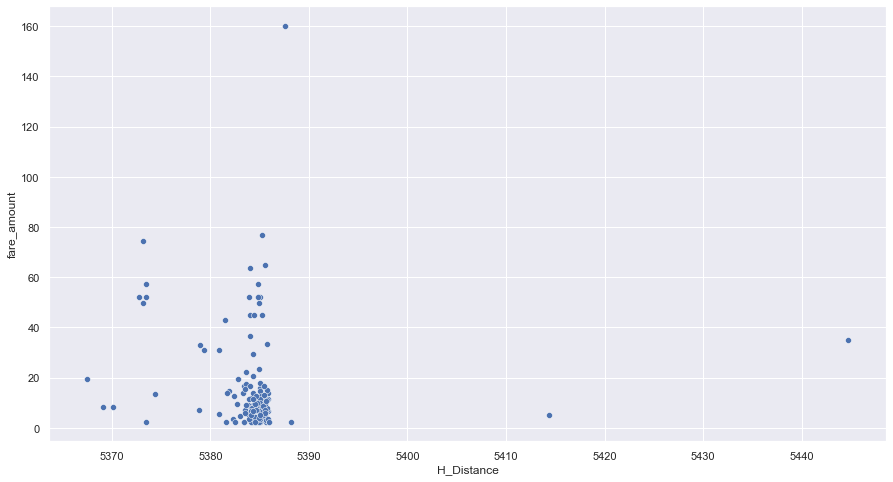

In [98]:
# Zoom it with in the range of 3000 to 5000
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
#d=train.loc[(train['H_Distance'] >0) & (train["H_Distance"] == 0)]
d=train[(train['H_Distance'] >5000)]
sns.scatterplot("H_Distance",
                    "fare_amount", 
                    data=d)

There are so many points where distance is very high and fare amount is quite low. 

Lets check for no. of rows having distance greater than 200 miles. and fare amount is not zero. 
There are 2 reasons behind it:

1. It is impracticle to travel thousands of miles wth such a low fare amount value.
2. Beacuse fare amount is not zero so we can say that either fare amount or H_distance have got corrupted.

In [99]:
# Look for rows having distance greater than 200 miles. and fare amount is not zero
train.loc[(train['H_Distance']>200)&(train['fare_amount']!=0)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
987,2011-11-29 08:00:00.000000100,6.1,2011-11-29 08:00:00+00:00,-0.132250,40.768440,-73.955195,40.768887,1,3738.685844,2011,11,29,1,8
1150,2014-06-07 21:57:59.000000200,4.5,2014-06-07 21:57:59+00:00,-73.975477,40.759501,0.000000,0.000000,1,5384.487958,2014,6,7,5,21
1266,2014-10-08 18:02:50.000000300,6.0,2014-10-08 18:02:50+00:00,-73.973532,40.784595,0.000000,0.000000,1,5384.707576,2014,10,8,2,18
2113,2013-03-28 06:05:00.000000150,52.0,2013-03-28 06:05:00+00:00,-73.964592,40.760675,0.000000,0.000000,5,5383.943015,2013,3,28,3,6
2600,2011-05-04 11:58:52.000000200,32.9,2011-05-04 11:58:52+00:00,0.000000,0.000000,-73.864898,40.770503,1,5378.941726,2011,5,4,2,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98703,2012-06-11 12:57:00.000000180,10.5,2012-06-11 12:57:00+00:00,-7.991052,40.749720,-73.975127,40.751032,1,3366.575783,2012,6,11,0,12
98810,2014-05-09 07:32:00.000000133,11.5,2014-05-09 07:32:00+00:00,-73.976822,40.739087,0.000000,0.000000,3,5384.297264,2014,5,9,4,7
99000,2012-01-19 20:59:00.000000260,6.5,2012-01-19 20:59:00+00:00,-0.166667,40.742245,-73.987515,40.728562,1,3740.610799,2012,1,19,3,20
99169,2012-04-20 06:42:13.000000200,49.8,2012-04-20 06:42:13+00:00,0.000000,0.000000,-73.785845,40.638806,1,5373.181990,2012,4,20,4,6


Only 201 rows. We can drop those outliers!!

In [100]:
train.shape

(99994, 14)

In [101]:
train['H_Distance'].describe()

count    99994.000000
mean        12.175608
std        228.869054
min          0.000000
25%          0.754861
50%          1.312470
75%          2.415823
max       5444.702133
Name: H_Distance, dtype: float64

In [102]:
# Dropping the rows where fare amount is greater than 200 miles. and fare amount is not zero.
train = train.drop(train.loc[(train['H_Distance']>200)].index, axis=0)
train.shape

(99793, 14)

In [103]:
train['H_Distance'].describe()

count    99793.000000
mean         2.044084
std          2.614151
min          0.000000
25%          0.753970
50%          1.309769
75%          2.405336
max        193.892744
Name: H_Distance, dtype: float64

There is a significant decrease in standard deviation of H_distance with this move!!

**Now we shall check for rows where the distance values are 0**

In [104]:
# Check for rows where distance is 0
train[train['H_Distance']==0]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
19,2009-11-13 15:52:00.000000780,7.3,2009-11-13 15:52:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009,11,13,4,15
32,2009-12-10 00:55:00.000000320,17.3,2009-12-10 00:55:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009,12,10,3,0
38,2013-04-28 01:19:56.000000100,22.5,2013-04-28 01:19:56+00:00,0.000000,0.000000,0.000000,0.000000,4,0.0,2013,4,28,6,1
39,2011-07-10 20:07:56.000000500,32.1,2011-07-10 20:07:56+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2011,7,10,6,20
103,2014-04-29 11:36:00.000000260,12.0,2014-04-29 11:36:00+00:00,0.000000,0.000000,0.000000,0.000000,5,0.0,2014,4,29,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99885,2014-06-12 13:04:45.000000700,23.5,2014-06-12 13:04:45+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2014,6,12,3,13
99922,2010-09-18 02:33:00.000000900,6.5,2010-09-18 02:33:00+00:00,-73.950393,40.783262,-73.950393,40.783262,2,0.0,2010,9,18,5,2
99929,2010-06-22 10:41:05.000000300,3.7,2010-06-22 10:41:05+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2010,6,22,1,10
99955,2014-05-25 00:02:00.000000880,3.0,2014-05-25 00:02:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2014,5,25,6,0


There are 2864 rows 

This could be due to 2 reasons:
1. The cab waited the whole time and the passenger eventually cancelled. That's why the pickup and drop-off co-ordinates are the same and maybe the passenger was charged for the waiting time.

2. The pickup and drop co-ordinates were not entered. In other words, these are missing value.

In [105]:
#Let us check for distance = 0 and fare =0 rows and drop
train[(train['H_Distance']==0)&(train['fare_amount']==0)]
# No such records are found

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour


In [106]:
#Drop if any
#train = train.drop(train.loc[(train['H_Distance']==0)&(train['fare_amount']==0)].index, axis=0)

From Google :NYC taxi standard fare:

1. 2.50 initial charge.
2. Plus 50 cents per 1/5 mile when traveling above 12mph or per 60 seconds in slow traffic or when the vehicle is stopped.Plus 50 cents MTA State Surcharge for all trips that end in New York City or Nassau, Suffolk, Westchester, Rockland, Dutchess, Orange or Putnam Counties.
3. Plus 30 cents Improvement Surcharge.
4. Plus 50 cents overnight surcharge 8pm to 6am.
5. Plus 1.00 rush hour surcharge from 4pm to 8pm on weekdays, excluding holidays.
6. Plus New York State Congestion Surcharge of 2.50 (Yellow Taxi) or 2.75 (Green Taxi and FHV) or 75 cents (any shared ride) for all trips that begin, end or pass through Manhattan south of 96th Street.
7. Plus tips and any tolls.
8. There is no charge for extra passengers, luggage or bags, or paying by credit card.
9. The on-screen rate message should read: "Rate #01 – Standard City Rate."
10. Make sure to always take your receipt.

According to above information , Lets try to drop the incorrect values and impute some values.

For waiting time, surcharge , tips , tolls ,extra charge for passenger etc. are missing So we can only impute values with respect to given information.

In [107]:
# Delete rows with fare amount less than 2.50 and distance 0, and these fares are incorrect values. drop
train[(train['H_Distance']==0)&(train['fare_amount']<2.5)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour


In [108]:
# To drop such values
#train = train.drop(train.loc[(train['H_Distance']==0)&(train['fare_amount']<2.5)].index, axis=0)

In [109]:
train.shape

(99793, 14)

In [110]:
# Fare is 0, but Distance is not 0. Fare values need to be imputed.
train.loc[(train['H_Distance']!=0) & (train['fare_amount']==0)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
44049,2015-01-25 18:00:06.000000500,0.0,2015-01-25 18:00:06+00:00,-73.801102,40.670094,-73.801086,40.670536,1,0.030585,2015,1,25,6,18
55472,2015-02-23 09:34:48.000000200,0.0,2015-02-23 09:34:48+00:00,-73.982201,40.768417,-73.981392,40.764874,1,0.248487,2015,2,23,0,9
72873,2015-01-15 07:49:05.000000400,0.0,2015-01-15 07:49:05+00:00,-73.901909,40.763988,-73.901917,40.763969,3,0.001377,2015,1,15,3,7


In [111]:
#Take such records iin different Dataframe
Impute_Fare = train.loc[(train['H_Distance']!=0) & (train['fare_amount']==0)]

In [112]:
# to check for rows for--> Plus 50 cents overnight surcharge 8pm to 6am and put it in Impute_Fare_1
Impute_Fare_1 = Impute_Fare.loc[(Impute_Fare['Hour']>=20) | (Impute_Fare['Hour']<=6)]
Impute_Fare = Impute_Fare.drop(Impute_Fare.loc[(Impute_Fare['Hour']>=20) | (Impute_Fare['Hour']<=6)].index, axis=0)

In [113]:
# to check for --> Plus 1.00 rush hour surcharge from 4pm to 8pm on weekdays, excluding holidays and put it in Impute_Fare_2
Impute_Fare_2 = Impute_Fare.loc[((Impute_Fare['Hour']>=16) & (Impute_Fare['Hour']<20)) & (Impute_Fare['Day of Week']<5)  ]
Impute_Fare = Impute_Fare.drop(Impute_Fare.loc[((Impute_Fare['Hour']>=16) & (Impute_Fare['Hour']<20)) & (Impute_Fare['Day of Week']<5)].index, axis=0)


In [114]:
# Impute fare amount: normal charges
Impute_Fare['fare_amount'] = Impute_Fare.apply(
    lambda row: ((row['H_Distance'] * 2.5) + 2.50), axis=1
)

In [115]:
# Imputer fare amount + Plus 50 cents overnight surcharge 8pm to 6am. NO such records are found on this dataframe
#Impute_Fare_1['fare_amount'] = Impute_Fare_1.apply(
#   lambda row: ((row['H_Distance'] * 2.5) + 2.50 + 0.5 ), axis=1
#)

In [116]:
#Imputer fare amount + Plus 1.00 rush hour surcharge from 4pm to 8pm on weekdays, excluding holidays.NO such records are found on this dataframe
#Impute_Fare_2['fare_amount'] = Impute_Fare_2.apply(
#   lambda row: ((row['H_Distance'] * 2.5) + 2.50 + 1 ), axis=1
#)

In [117]:
Impute_Fare

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
44049,2015-01-25 18:00:06.000000500,2.576461,2015-01-25 18:00:06+00:00,-73.801102,40.670094,-73.801086,40.670536,1,0.030585,2015,1,25,6,18
55472,2015-02-23 09:34:48.000000200,3.121217,2015-02-23 09:34:48+00:00,-73.982201,40.768417,-73.981392,40.764874,1,0.248487,2015,2,23,0,9
72873,2015-01-15 07:49:05.000000400,2.503443,2015-01-15 07:49:05+00:00,-73.901909,40.763988,-73.901917,40.763969,3,0.001377,2015,1,15,3,7


In [118]:
# Update imputed records to main dataframe
train.update(Impute_Fare)
# Change passenger count data type to int
train['passenger_count'] = train['passenger_count'].apply(np.int64)
#train.update(Impute_Fare_1)
#train.update(Impute_Fare_1)

In [119]:
# When Fare is not 0, but Distance is 0. Distance values need to be imputed.
train.loc[(train['H_Distance']==0) & (train['fare_amount']!=0)]

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
19,2009-11-13 15:52:00.000000780,7.3,2009-11-13 15:52:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009.0,11.0,13.0,4.0,15.0
32,2009-12-10 00:55:00.000000320,17.3,2009-12-10 00:55:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009.0,12.0,10.0,3.0,0.0
38,2013-04-28 01:19:56.000000100,22.5,2013-04-28 01:19:56+00:00,0.000000,0.000000,0.000000,0.000000,4,0.0,2013.0,4.0,28.0,6.0,1.0
39,2011-07-10 20:07:56.000000500,32.1,2011-07-10 20:07:56+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2011.0,7.0,10.0,6.0,20.0
103,2014-04-29 11:36:00.000000260,12.0,2014-04-29 11:36:00+00:00,0.000000,0.000000,0.000000,0.000000,5,0.0,2014.0,4.0,29.0,1.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99885,2014-06-12 13:04:45.000000700,23.5,2014-06-12 13:04:45+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2014.0,6.0,12.0,3.0,13.0
99922,2010-09-18 02:33:00.000000900,6.5,2010-09-18 02:33:00+00:00,-73.950393,40.783262,-73.950393,40.783262,2,0.0,2010.0,9.0,18.0,5.0,2.0
99929,2010-06-22 10:41:05.000000300,3.7,2010-06-22 10:41:05+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2010.0,6.0,22.0,1.0,10.0
99955,2014-05-25 00:02:00.000000880,3.0,2014-05-25 00:02:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2014.0,5.0,25.0,6.0,0.0


There are 2864 rows with Fare is not 0, but Distance is 0

In [120]:
# Fare is not 0, but Distance is 0. Take those rows in Impute_Dist
Impute_Dist = train.loc[(train['H_Distance']==0) & (train['fare_amount']!=0)]

In [121]:
#check for rows where fare amount = 2.5 that is initial charge and distance is 0.
#This is because for booking and cancelling the ride
# We should not delete such rows.
Impute_Dist1 = Impute_Dist.loc[(Impute_Dist['fare_amount']==2.5)&(Impute_Dist['H_Distance']==0)]
Impute_Dist1.shape

(100, 14)

Keep these rows as it is.

In [122]:
# Check for those rows where fare amount > 2.5 and distance is 0. Here we need to impute distance values 
Impute_Dist2=Impute_Dist.loc[(Impute_Dist['fare_amount']>2.5)&(Impute_Dist['H_Distance']==0)]
Impute_Dist2

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
19,2009-11-13 15:52:00.000000780,7.3,2009-11-13 15:52:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009.0,11.0,13.0,4.0,15.0
32,2009-12-10 00:55:00.000000320,17.3,2009-12-10 00:55:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2009.0,12.0,10.0,3.0,0.0
38,2013-04-28 01:19:56.000000100,22.5,2013-04-28 01:19:56+00:00,0.000000,0.000000,0.000000,0.000000,4,0.0,2013.0,4.0,28.0,6.0,1.0
39,2011-07-10 20:07:56.000000500,32.1,2011-07-10 20:07:56+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2011.0,7.0,10.0,6.0,20.0
103,2014-04-29 11:36:00.000000260,12.0,2014-04-29 11:36:00+00:00,0.000000,0.000000,0.000000,0.000000,5,0.0,2014.0,4.0,29.0,1.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99885,2014-06-12 13:04:45.000000700,23.5,2014-06-12 13:04:45+00:00,0.000000,0.000000,0.000000,0.000000,2,0.0,2014.0,6.0,12.0,3.0,13.0
99922,2010-09-18 02:33:00.000000900,6.5,2010-09-18 02:33:00+00:00,-73.950393,40.783262,-73.950393,40.783262,2,0.0,2010.0,9.0,18.0,5.0,2.0
99929,2010-06-22 10:41:05.000000300,3.7,2010-06-22 10:41:05+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2010.0,6.0,22.0,1.0,10.0
99955,2014-05-25 00:02:00.000000880,3.0,2014-05-25 00:02:00+00:00,0.000000,0.000000,0.000000,0.000000,1,0.0,2014.0,5.0,25.0,6.0,0.0


In [123]:
# Impute H_distance values to dataframe
Impute_Dist2['H_Distance'] = Impute_Dist2.apply(
lambda row: ((row['fare_amount']-2.51)/2.50), axis=1
)

C:\Users\shubh\AppData\Local\Temp\ipykernel_12604\3891614413.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Impute_Dist2['H_Distance'] = Impute_Dist2.apply(


In [124]:
Impute_Dist2.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
19,2009-11-13 15:52:00.000000780,7.3,2009-11-13 15:52:00+00:00,0.0,0.0,0.0,0.0,1,1.916,2009.0,11.0,13.0,4.0,15.0
32,2009-12-10 00:55:00.000000320,17.3,2009-12-10 00:55:00+00:00,0.0,0.0,0.0,0.0,1,5.916,2009.0,12.0,10.0,3.0,0.0
38,2013-04-28 01:19:56.000000100,22.5,2013-04-28 01:19:56+00:00,0.0,0.0,0.0,0.0,4,7.996,2013.0,4.0,28.0,6.0,1.0
39,2011-07-10 20:07:56.000000500,32.1,2011-07-10 20:07:56+00:00,0.0,0.0,0.0,0.0,2,11.836,2011.0,7.0,10.0,6.0,20.0
103,2014-04-29 11:36:00.000000260,12.0,2014-04-29 11:36:00+00:00,0.0,0.0,0.0,0.0,5,3.796,2014.0,4.0,29.0,1.0,11.0


In [125]:
# Update these values to original dataframe.
train.update(Impute_Dist2)
train['passenger_count'] = train['passenger_count'].apply(np.int64)

In [126]:
train.shape

(99793, 14)

In [127]:
train.groupby('passenger_count')['H_Distance','fare_amount'].mean()

C:\Users\shubh\AppData\Local\Temp\ipykernel_12604\507510172.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  train.groupby('passenger_count')['H_Distance','fare_amount'].mean()


,H_Distance,fare_amount
passenger_count,,
0,1.870379,9.157880
1,2.112260,11.185801
2,2.282025,11.878971
3,2.250879,11.486905
4,2.189666,11.523832
5,2.141123,11.297326
6,2.177634,12.104216


From here we can see that average H_distance is around 2 and fare_amount is around 11. 

**Lets drop columns which are of no use or has no impact/less impact on Fare Amount**

In [128]:
#Let us remove all unwanted columns
train.drop(['key','pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude','Date'], inplace = False, axis = 1)

,fare_amount,passenger_count,H_Distance,Year,Month,Day of Week,Hour
0,4.9,2,0.693978,2009.0,4.0,2.0,19.0
1,4.9,2,0.655579,2012.0,7.0,0.0,16.0
2,6.9,1,1.687618,2011.0,2.0,1.0,13.0
3,14.1,1,3.169844,2010.0,10.0,3.0,21.0
4,12.1,5,2.982949,2009.0,10.0,4.0,22.0
...,...,...,...,...,...,...,...
99995,4.5,1,0.744761,2015.0,6.0,0.0,7.0
99996,25.5,1,5.016678,2012.0,9.0,0.0,15.0
99997,14.5,1,1.745018,2013.0,2.0,5.0,19.0
99998,9.0,1,1.290064,2013.0,12.0,5.0,15.0


In [129]:
train.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,H_Distance,Year,Month,Date,Day of Week,Hour
0,2009-04-08 19:11:10.000000400,4.9,2009-04-08 19:11:10+00:00,-73.998287,40.727490,-73.989854,40.735239,2,0.693978,2009.0,4.0,8.0,2.0,19.0
1,2012-07-30 16:19:08.000000300,4.9,2012-07-30 16:19:08+00:00,-73.966597,40.794345,-73.965682,40.803808,2,0.655579,2012.0,7.0,30.0,0.0,16.0
2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00+00:00,-73.971638,40.763382,-73.953767,40.783715,1,1.687618,2011.0,2.0,22.0,1.0,13.0
3,2010-10-07 21:09:35.000000200,14.1,2010-10-07 21:09:35+00:00,-74.003545,40.707399,-73.981312,40.750071,1,3.169844,2010.0,10.0,7.0,3.0,21.0
4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00+00:00,-74.004532,40.707465,-73.977908,40.745633,5,2.982949,2009.0,10.0,2.0,4.0,22.0


In [130]:
#Let us remove all unwanted columns and cpoy dataframe to other dataframe
train_New=train.drop(['key','pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude','Date'], inplace = False, axis = 1)

In [131]:
# Before moving further reset index
train_New.reset_index(inplace=True)
train_New.head()

,index,fare_amount,passenger_count,H_Distance,Year,Month,Day of Week,Hour
0,0,4.9,2,0.693978,2009.0,4.0,2.0,19.0
1,1,4.9,2,0.655579,2012.0,7.0,0.0,16.0
2,2,6.9,1,1.687618,2011.0,2.0,1.0,13.0
3,3,14.1,1,3.169844,2010.0,10.0,3.0,21.0
4,4,12.1,5,2.982949,2009.0,10.0,4.0,22.0


In [132]:
import gc
gc.collect()

4421715

In [133]:
# deleting unwanted objects to free memory
del train
del Impute_Dist2

In [134]:
# deleting unwanted objects to free memory
del Impute_Dist1
del Impute_Dist
del Impute_Fare
del Impute_Fare_1
del Impute_Fare_2
#del high_distance

## B.Data Scaling:

In [135]:
# Import libraries
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

sts = StandardScaler()
# one hot encoding for ordinal attributes
onehot=OneHotEncoder(sparse = False)
X=train_New
X

,index,fare_amount,passenger_count,H_Distance,Year,Month,Day of Week,Hour
0,0,4.9,2,0.693978,2009.0,4.0,2.0,19.0
1,1,4.9,2,0.655579,2012.0,7.0,0.0,16.0
2,2,6.9,1,1.687618,2011.0,2.0,1.0,13.0
3,3,14.1,1,3.169844,2010.0,10.0,3.0,21.0
4,4,12.1,5,2.982949,2009.0,10.0,4.0,22.0
...,...,...,...,...,...,...,...,...
99788,99995,4.5,1,0.744761,2015.0,6.0,0.0,7.0
99789,99996,25.5,1,5.016678,2012.0,9.0,0.0,15.0
99790,99997,14.5,1,1.745018,2013.0,2.0,5.0,19.0
99791,99998,9.0,1,1.290064,2013.0,12.0,5.0,15.0


In [136]:
# OneHot Encoding on Day of Week
Y= onehot.fit_transform((X[['Day of Week']]))
X.drop(['Day of Week'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['MON', 'TUE', 'WED', 'THU','FRI','SAT','SUM']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,index,fare_amount,passenger_count,H_Distance,Year,Month,Hour,Day of Week_0.0,Day of Week_1.0,Day of Week_2.0,Day of Week_3.0,Day of Week_4.0,Day of Week_5.0,Day of Week_6.0
0,0,4.9,2,0.693978,2009.0,4.0,19.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,1,4.9,2,0.655579,2012.0,7.0,16.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,6.9,1,1.687618,2011.0,2.0,13.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3,14.1,1,3.169844,2010.0,10.0,21.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,4,12.1,5,2.982949,2009.0,10.0,22.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99788,99995,4.5,1,0.744761,2015.0,6.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99789,99996,25.5,1,5.016678,2012.0,9.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99790,99997,14.5,1,1.745018,2013.0,2.0,19.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
99791,99998,9.0,1,1.290064,2013.0,12.0,15.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [137]:
# OneHot Encoding on Month
Y= onehot.fit_transform((X[['Month']]))
X.drop(['Month'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['JAN', 'FEB', 'MAR', 'APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,index,fare_amount,passenger_count,H_Distance,Year,Hour,Day of Week_0.0,Day of Week_1.0,Day of Week_2.0,Day of Week_3.0,...,Month_3.0,Month_4.0,Month_5.0,Month_6.0,Month_7.0,Month_8.0,Month_9.0,Month_10.0,Month_11.0,Month_12.0
0,0,4.9,2,0.693978,2009.0,19.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,4.9,2,0.655579,2012.0,16.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2,6.9,1,1.687618,2011.0,13.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,14.1,1,3.169844,2010.0,21.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,4,12.1,5,2.982949,2009.0,22.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99788,99995,4.5,1,0.744761,2015.0,7.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99789,99996,25.5,1,5.016678,2012.0,15.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99790,99997,14.5,1,1.745018,2013.0,19.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99791,99998,9.0,1,1.290064,2013.0,15.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [138]:
# OneHot Encoding on Year
Y= onehot.fit_transform((X[['Year']]))
X.drop(['Year'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['2009','2010','2011','2012','2013','2014','2015']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,index,fare_amount,passenger_count,H_Distance,Hour,Day of Week_0.0,Day of Week_1.0,Day of Week_2.0,Day of Week_3.0,Day of Week_4.0,...,Month_10.0,Month_11.0,Month_12.0,Year_2009.0,Year_2010.0,Year_2011.0,Year_2012.0,Year_2013.0,Year_2014.0,Year_2015.0
0,0,4.9,2,0.693978,19.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,4.9,2,0.655579,16.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2,6.9,1,1.687618,13.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,3,14.1,1,3.169844,21.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,4,12.1,5,2.982949,22.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99788,99995,4.5,1,0.744761,7.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
99789,99996,25.5,1,5.016678,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99790,99997,14.5,1,1.745018,19.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
99791,99998,9.0,1,1.290064,15.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [139]:
# OneHot Encoding on Hour
Y= onehot.fit_transform((X[['Hour']]))
X.drop(['Hour'], axis=1, inplace=True)
onehot.get_feature_names()
onehote = pd.DataFrame(Y)
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

C:\Users\shubh\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,index,fare_amount,passenger_count,H_Distance,Day of Week_0.0,Day of Week_1.0,Day of Week_2.0,Day of Week_3.0,Day of Week_4.0,Day of Week_5.0,...,Hour_14.0,Hour_15.0,Hour_16.0,Hour_17.0,Hour_18.0,Hour_19.0,Hour_20.0,Hour_21.0,Hour_22.0,Hour_23.0
0,0,4.9,2,0.693978,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,1,4.9,2,0.655579,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,6.9,1,1.687618,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,14.1,1,3.169844,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,4,12.1,5,2.982949,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99788,99995,4.5,1,0.744761,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99789,99996,25.5,1,5.016678,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99790,99997,14.5,1,1.745018,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
99791,99998,9.0,1,1.290064,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [140]:
X.columns

Index(['index', 'fare_amount', 'passenger_count', 'H_Distance',
       'Day of Week_0.0', 'Day of Week_1.0', 'Day of Week_2.0',
       'Day of Week_3.0', 'Day of Week_4.0', 'Day of Week_5.0',
       'Day of Week_6.0', 'Month_1.0', 'Month_2.0', 'Month_3.0', 'Month_4.0',
       'Month_5.0', 'Month_6.0', 'Month_7.0', 'Month_8.0', 'Month_9.0',
       'Month_10.0', 'Month_11.0', 'Month_12.0', 'Year_2009.0', 'Year_2010.0',
       'Year_2011.0', 'Year_2012.0', 'Year_2013.0', 'Year_2014.0',
       'Year_2015.0', 'Hour_0.0', 'Hour_1.0', 'Hour_2.0', 'Hour_3.0',
       'Hour_4.0', 'Hour_5.0', 'Hour_6.0', 'Hour_7.0', 'Hour_8.0', 'Hour_9.0',
       'Hour_10.0', 'Hour_11.0', 'Hour_12.0', 'Hour_13.0', 'Hour_14.0',
       'Hour_15.0', 'Hour_16.0', 'Hour_17.0', 'Hour_18.0', 'Hour_19.0',
       'Hour_20.0', 'Hour_21.0', 'Hour_22.0', 'Hour_23.0'],
      dtype='object')

In [141]:
# Scaling using standard scaler
train_scaled_STS = sts.fit_transform(X)

In [142]:
train_scaled_STS.shape

(99793, 54)

In [143]:
# deleting unwanted objects to free memory
del train_scaled_STS
del X
del train_New

## C. Building a Pipeline

In [144]:
# Import Libraries for pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

In [145]:
# Read complete CSV file
train_pipe = pd.read_csv('train_NYTaxi.csv')
test_pipe = pd.read_csv('test_NYTaxi.csv')
# Drop first unknowm column
train_pipe = train_pipe.drop(train_pipe.columns[[0]],axis = 1)
train_pipe.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-04-08 19:11:10.0000004,4.9,2009-04-08 19:11:10 UTC,-73.998287,40.727490,-73.989854,40.735239,2
1,2012-07-30 16:19:08.0000003,4.9,2012-07-30 16:19:08 UTC,-73.966597,40.794345,-73.965682,40.803808,2
2,2011-02-22 13:35:00.000000121,6.9,2011-02-22 13:35:00 UTC,-73.971638,40.763382,-73.953767,40.783715,1
3,2010-10-07 21:09:35.0000002,14.1,2010-10-07 21:09:35 UTC,-74.003545,40.707399,-73.981312,40.750071,1
4,2009-10-02 22:51:00.000000140,12.1,2009-10-02 22:51:00 UTC,-74.004532,40.707465,-73.977908,40.745633,5


In [146]:
#This class is for Null/Nan removal
class Remove_null(BaseEstimator, TransformerMixin):
    def __init__(self, X):
        self.X = X

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        print(".........Null Remove......")
        X.dropna(inplace=True) #drop null values
        return X

In [147]:
#This class is for deleting rows with certain conditions
class Remove_rows(BaseEstimator,TransformerMixin):

    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        print(".........Delete Rows.....  ")
        X.drop(X[(X["pickup_latitude"]<-90) | (X["pickup_latitude"]>90)].index,inplace=True)
        X.drop(X[(X["pickup_longitude"]<-180) | (X["pickup_longitude"]>180)].index,inplace=True)
        X.drop(X[(X["dropoff_latitude"]<-90) | (X["dropoff_latitude"]>90)].index,inplace=True)
        X.drop(X[(X["dropoff_longitude"]<-180) | (X["dropoff_longitude"]>180)].index,inplace=True)
        return X

In [148]:
#Thisfunction is for calculating distance in miles
def haversine_distance(lat1, long1, lat2, long2,X):
    data = [X]
    for i in data:
        R = 6371  #radius of earth in kilometers
        phi1 = np.radians(i[lat1])
        phi2 = np.radians(i[lat2])
    
        delta_phi = np.radians(i[lat2]-i[lat1])
        delta_lambda = np.radians(i[long2]-i[long1])
    
        #a = sin²((φB - φA)/2) + cos φA . cos φB . sin²((λB - λA)/2)
        a = np.sin(delta_phi / 2.0) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0) ** 2
    
        #c = 2 * atan2( √a, √(1−a) )
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    
        #d = R*c
        d = 0.621371*(R * c) #in miles
        i['H_Distance'] = d
    return data

In [149]:
#This class is for adding calling distance function
class Add_Distance(BaseEstimator,TransformerMixin):
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        print("........Distance Calculation.......")
        haversine_distance('pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude',X)
        return X

In [150]:
class Add_Features(BaseEstimator, TransformerMixin):

    def __init__(self, Year=True, Month=True, Date=True, Day_of_Week=True, Hour=True):
        self.Year = Year
        self.Month = Month
        self.Date = Date
        self.Day_of_Week=Day_of_Week
        self.Hour=Hour

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        print(".......Add Features ........")
        X['key'] = pd.to_datetime(X['key'])
        X['pickup_datetime']  = pd.to_datetime(X['pickup_datetime'])
        data = [X]
        for i in data:
            i['Year'] = i['pickup_datetime'].dt.year
            i['Month'] = i['pickup_datetime'].dt.month
            i['Date'] = i['pickup_datetime'].dt.day
            i['Day of Week'] = i['pickup_datetime'].dt.dayofweek
            i['Hour'] = i['pickup_datetime'].dt.hour
            return X

In [151]:
class Cols_Dropper(BaseEstimator,TransformerMixin):
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        print("...Column Drop.....")
        #return X.drop(columns=["key","pickup_datetime","pickup_longitude","pickup_latitude","dropoff_longitude","dropoff_latitude","Month","Date"])
        return X.drop(columns=["key","pickup_datetime","pickup_longitude","pickup_latitude","dropoff_longitude","dropoff_latitude","Date"])

In [152]:
class Delete_Distance(BaseEstimator,TransformerMixin):
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        print(".....Remove Outliers.....")
        X.drop(X[(X["H_Distance"]>200)].index,inplace=True)
        X.drop(X[(X["H_Distance"]==0) & (X["fare_amount"]==0)].index,inplace=True)
        X.drop(X[(X["H_Distance"]==0) & (X["fare_amount"]<2.5)].index,inplace=True)
        return X

In [153]:
class Impute_Fair(BaseEstimator, TransformerMixin):
   
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        print(".......Impute Fair.......")
        X.drop(X[X["fare_amount"]<0].index,inplace=True)
        Impute_Fare=X.loc[(X['H_Distance']!=0) & (X['fare_amount']==0)]
        Impute_Fare_1 = Impute_Fare.loc[(Impute_Fare['Hour']>=20) | (Impute_Fare['Hour']<=6)]
        Impute_Fare_2 = Impute_Fare.loc[((Impute_Fare['Hour']>=16) & (Impute_Fare['Hour']<20)) & (Impute_Fare['Day of Week']<5)]
        Impute_Fare = Impute_Fare.drop(Impute_Fare.loc[(Impute_Fare['Hour']>=20) | (Impute_Fare['Hour']<=6)].index, axis=0)
        Impute_Fare = Impute_Fare.drop(Impute_Fare.loc[((Impute_Fare['Hour']>=16) & (Impute_Fare['Hour']<20)) & (Impute_Fare['Day of Week']<5)].index, axis=0)
        Impute_Fare['fare_amount'] = Impute_Fare.apply(
            lambda row: ((row['H_Distance'] * 2.5) + 2.50), axis=1
        )
        X.update(Impute_Fare)
        X['passenger_count'] = X['passenger_count'].apply(np.int64)
        return X

In [154]:
class Impute_Dist(BaseEstimator, TransformerMixin):
   
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        print("......Impute Distance.........")
        Impute_Dist = X.loc[(X['H_Distance']==0) & (X['fare_amount']!=0)]
        Impute_Dist2=Impute_Dist.loc[(Impute_Dist['fare_amount']>2.5)&(Impute_Dist['H_Distance']==0)]
        # Impute H_distance 
        Impute_Dist2['H_Distance'] = Impute_Dist2.apply(
            lambda row: ((row['fare_amount']-2.51)/2.50), axis=1
        )
        X.update(Impute_Dist2)
        X['passenger_count'] = X['passenger_count'].apply(np.int64)
        return X

In [155]:
# OneHot encoding for Month column
from sklearn.preprocessing import OneHotEncoder
# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotM(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        print("......OneHot Encode.........")
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['JAN', 'FEB', 'MAR', 'APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
        #onehot.columns=self.encoder.get_feature_names()
        onehot.columns=self.encoder.get_feature_names_out()
        X = pd.concat([X, onehot], axis=1)
        return X

In [156]:
# OneHot encoding for Days of Week column
from sklearn.preprocessing import OneHotEncoder

# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotW(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        #self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['MON', 'TUE', 'WED', 'THU','FRI','SAT','SUM']
        #onehot.columns=self.encoder.get_feature_names()
        onehot.columns=self.encoder.get_feature_names_out()
        X = pd.concat([X, onehot], axis=1)
        return X

In [157]:
# OneHot encoding for Year column
from sklearn.preprocessing import OneHotEncoder
# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotY(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        #self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['2009','2010','2011','2012','2013','2014','2015']
        #onehot.columns=self.encoder.get_feature_names()
        onehot.columns=self.encoder.get_feature_names_out()
        X = pd.concat([X, onehot], axis=1)
        return X

In [158]:
# OneHot encoding for Hour column
from sklearn.preprocessing import OneHotEncoder
# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotH(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        #self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['H1','H2','H3','H4','H5','H6','H7','H8','H9','H10','H11','H12','H13','H14','H15','H16','H17','H18','H19','H20','H21','H22','H23','H24']
        onehot.columns=self.encoder.get_feature_names_out()
        #onehot.columns = self.names
        X = pd.concat([X, onehot], axis=1)
        sts = StandardScaler()
        X = X.drop(X.columns[[0]],axis = 1)
        # Sandard scaling
        print("......Scaling......")
        train_scaled_STS = sts.fit_transform(X)
        print("......Done!!")
        return train_scaled_STS
        #return X

In [159]:
# calling pipelin with training data 
pre_pipe = Pipeline([
    ("Remove_null",Remove_null(X=train_pipe)),
    ("Remove_rows",Remove_rows()),
    ("Add_Features",Add_Features()),
    ("Add_Distance",Add_Distance()),
    ("Cols_Dropper",Cols_Dropper()),
    ("Delete_Distance",Delete_Distance()),
    ("Impute_Fair",Impute_Fair()),
    ("Impute_Dist",Impute_Dist()),
    ('onehotM', onehotM(col="Month")),
    ('onehotW', onehotW(col="Day of Week")),
    ('onehotY', onehotY(col="Year")),
    ('onehotH', onehotH(col="Hour"))
     
])

train_prepared = pre_pipe.fit_transform(train_pipe)
train_prepared

.........Null Remove......
.........Delete Rows.....  
.......Add Features ........
........Distance Calculation.......
...Column Drop.....
.....Remove Outliers.....
.......Impute Fair.......
......Impute Distance.........


C:\Users\shubh\AppData\Local\Temp\ipykernel_12604\1952873758.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Impute_Dist2['H_Distance'] = Impute_Dist2.apply(


......OneHot Encode.........
......Scaling......
......Done!!


array([[-0.65692904,  0.24287946, -0.52394309, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.65692904,  0.24287946, -0.53778599, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.45252895, -0.52130599, -0.16573466, ..., -0.24651575,
        -0.24392088, -0.22913368],
       ...,
       [ 0.32419142, -0.52130599, -0.14504195, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.23790885, -0.52130599, -0.30905321, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [ 0.37529144, -0.52130599, -0.14215006, ..., -0.24651575,
        -0.24392088, -0.22913368]])

In [160]:
type(train_prepared.dtype)

numpy.dtype[float64]

In [161]:
train_prepared.shape

(99793, 53)

In [162]:
#train_prepared.columns

In [163]:
# Converting it into DF 
train_Val = pd.DataFrame(train_prepared)

In [164]:
# Calling pipeling with test data
pre_pipe = Pipeline([
    ("Remove_null",Remove_null(X=test_pipe)),
    ("Remove_rows",Remove_rows()),
    ("Add_features",Add_Features()),
    ("Distance",Add_Distance()),
    ("ColDropper",Cols_Dropper()),
    #("Delete_distance",delete_distance()),
    #("Impute_Fair",Impute_Fair()),
    #("Impute_Dist",Impute_Dist()),
    ('onehotM', onehotM(col="Month")),
    ('onehotW', onehotW(col="Day of Week")),
    ('onehotY', onehotY(col="Year")),
    ('onehotH', onehotH(col="Hour"))
])
test_prepared = pre_pipe.fit_transform(test_pipe)
test_prepared

.........Null Remove......
.........Delete Rows.....  
.......Add Features ........
........Distance Calculation.......
...Column Drop.....
......OneHot Encode.........
......Scaling......
......Done!!


array([[-0.52497232, -0.27997538,  3.45580074, ..., -0.29566722,
        -0.29707687, -0.23118844],
       [-0.52497232, -0.25427325,  3.45580074, ..., -0.29566722,
        -0.29707687, -0.23118844],
       [-0.52497232, -0.70911869, -0.28936854, ..., -0.29566722,
        -0.29707687, -0.23118844],
       ...,
       [ 3.38530232,  3.96472355, -0.28936854, ..., -0.29566722,
        -0.29707687, -0.23118844],
       [ 3.38530232,  1.23562466,  3.45580074, ..., -0.29566722,
        -0.29707687, -0.23118844],
       [ 3.38530232, -0.56758476,  3.45580074, ..., -0.29566722,
        -0.29707687, -0.23118844]])

In [165]:
#test_prepared.columns

In [166]:
test_Val=pd.DataFrame(test_prepared)
test_Val.head()

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
0,-0.524972,-0.279975,3.455801,-0.212153,-0.317524,-0.27094,-0.231672,-0.421396,-0.267059,-0.28608,...,-0.205312,-0.165723,-0.287317,-0.211633,-0.286493,-0.18672,-0.184101,-0.295667,-0.297077,-0.231188
1,-0.524972,-0.254273,3.455801,-0.212153,-0.317524,-0.27094,-0.231672,-0.421396,-0.267059,-0.28608,...,-0.205312,-0.165723,-0.287317,-0.211633,-0.286493,-0.18672,-0.184101,-0.295667,-0.297077,-0.231188
2,-0.524972,-0.709119,-0.289369,-0.212153,-0.317524,-0.27094,-0.231672,-0.421396,-0.267059,-0.28608,...,-0.205312,-0.165723,-0.287317,-0.211633,-0.286493,-0.18672,-0.184101,-0.295667,-0.297077,-0.231188
3,-0.524972,-0.371167,-0.289369,-0.212153,-0.317524,-0.27094,-0.231672,-0.421396,-0.267059,-0.28608,...,-0.205312,-0.165723,-0.287317,-0.211633,-0.286493,-0.18672,-0.184101,3.382181,-0.297077,-0.231188
4,-0.524972,0.491401,-0.289369,-0.212153,-0.317524,-0.27094,-0.231672,-0.421396,-0.267059,-0.28608,...,-0.205312,-0.165723,-0.287317,-0.211633,-0.286493,-0.18672,-0.184101,3.382181,-0.297077,-0.231188


## Select and Train a Model

In [167]:
# Preparind numpy array for model building

In [169]:
x=train_prepared.copy()
x

array([[-0.65692904,  0.24287946, -0.52394309, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.65692904,  0.24287946, -0.53778599, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.45252895, -0.52130599, -0.16573466, ..., -0.24651575,
        -0.24392088, -0.22913368],
       ...,
       [ 0.32419142, -0.52130599, -0.14504195, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.23790885, -0.52130599, -0.30905321, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [ 0.37529144, -0.52130599, -0.14215006, ..., -0.24651575,
        -0.24392088, -0.22913368]])

In [170]:
x.shape

(99793, 53)

In [171]:
# Remove labels from training set to another set
y_train_ = x[:,0]
x_train_ = np.delete(x, 0, axis = 1)
y_train_.shape


(99793,)

In [172]:
x_train_.shape

(99793, 52)

**Train Test Split**

In [173]:
# Train and Validation split in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train, X_Val, y_train, y_Val = train_test_split(x_train_,y_train_,
                                                    test_size=0.30, 
                                                    random_state=42)

In [174]:
X_train.shape

(69855, 52)

In [175]:
y_train.shape

(69855,)

In [176]:
X_train

array([[-0.52130599, -0.48481566, -0.31326475, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [ 0.24287946, -0.40894128, -0.31326475, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.52130599,  0.48919496, -0.31326475, ..., -0.24651575,
        -0.24392088, -0.22913368],
       ...,
       [ 0.24287946,  0.56904492, -0.31326475, ..., -0.24651575,
        -0.24392088, -0.22913368],
       [-0.52130599, -0.34078913, -0.31326475, ..., -0.24651575,
        -0.24392088,  4.36426465],
       [-0.52130599, -0.7116435 , -0.31326475, ..., -0.24651575,
        -0.24392088, -0.22913368]])

In [177]:
X_Val.shape

(29938, 52)

In [178]:
# Free temporary object
del x

**1.Matrix Based: Write the equation finally obtained**


\begin{equation}%
% \large % (b)
% \scalebox{1.5}{ % (c)
w_{est} = (A^T A)^{-1}A^T.y %
% } % (c)
\end{equation}

In [179]:
# To store mean squared error for various methods
Mean_Squared_Error={}

In [180]:
# Calculate RMSE
def Est_RMSE(ypredict,yVal):
    summation = 0  #variable to store the summation of differences
    n = len(yVal) #finding total number of items in list
    for i in range (0,n):  #looping through each element of the list
      difference = ypredict[i] - yVal[i]  #finding the difference between observed and predicted value
      squared_difference = difference**2  #taking square of the differene 
      summation = summation + squared_difference  #taking a sum of all the differences
    MSE = summation/n  #dividing summation by total values to obtain average
    print("The Mean Square Error is: " , MSE)
    return MSE

In [181]:
#closed form solution/ Normal eq
def Est_Weights(X,Y): # for estimating weights
    ones = np.ones((X.shape[0],1))
    X = np.hstack((ones,X))
    w_estimate = np.dot(np.dot(np.linalg.inv(np.dot(X.T,X)),X.T),Y)
    return w_estimate

def Y_predict(X,Weights): # for predicting labels of validation set
    ones = np.ones((X.shape[0],1))
    X = np.hstack((ones,X))
    return np.dot(X,Weights)

In [182]:
# Call methos to estimate weights
import time
start = time.time()
w_estimate=Est_Weights(X_train, y_train)
print("Time Required for MATRIX METHOD :" )
print(time.time()-start)
w_estimate.shape

Time :
0.03789687156677246


(53,)

In [183]:
# Predict y values for validation set
y_Val_predict_M=Y_predict(X_Val,w_estimate)
y_Val_predict_M.shape

(29938,)

In [184]:
# Show Root mean squared error
mse=Est_RMSE(y_Val_predict_M,y_Val)

The Mean Square Error is:  0.3736855362775135


In [185]:
Mean_Squared_Error["Matrix Method"]=mse
Mean_Squared_Error

{'Matrix Method': 0.3736855362775135}

In [186]:
## Using sklearn Library

In [187]:
# lets us check it with library
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
#ones = np.ones((X_train.shape[0],1))
#X_train= np.hstack((ones,X_train))
lin_reg.fit(X_train, y_train)
lin_reg.intercept_, lin_reg.coef_

(-0.0007287069252513787,
 array([ 6.21802324e-03,  7.42421170e-01, -5.10524084e+11, -4.94405711e+11,
        -5.23095702e+11, -5.14221424e+11, -5.24660147e+11, -5.14986732e+11,
        -4.74151641e+11, -4.59189663e+11, -4.73979389e+11, -4.90241500e+11,
        -4.73318284e+11, -4.74352492e+11, -5.76141495e+11, -5.98141502e+11,
        -6.04678852e+11, -6.12839442e+11, -6.20587000e+11, -6.11282549e+11,
        -5.79299840e+11, -4.83638642e+11, -4.79946324e+11, -4.90501559e+11,
        -4.92266007e+11, -4.86614123e+11, -4.75383823e+11, -3.40689024e+11,
         1.35368718e+11,  1.18715963e+11,  1.01281516e+11,  8.56985243e+10,
         7.42574163e+10,  6.93442106e+10,  9.89981579e+10,  1.30559301e+11,
         1.45830386e+11,  1.46224212e+11,  1.45267708e+11,  1.47188187e+11,
         1.50152143e+11,  1.50210693e+11,  1.53445719e+11,  1.49108184e+11,
         1.39825429e+11,  1.51216299e+11,  1.65024024e+11,  1.68297541e+11,
         1.63361969e+11,  1.62037848e+11,  1.60524788e+11,  1.5

In [188]:
Y_prec=lin_reg.predict(X_Val)
from sklearn.metrics import mean_squared_error
loss_1 = mean_squared_error(y_Val,Y_prec)
loss_1

0.3734714860309008

Which is same as Normal Equation with matrix method!!

In [189]:
lin_reg.score(X_train,y_train)

0.5840753623327377

**2.Optimization Based: Write the equation finally obtained**

$$
\frac{\partial MSE({\theta})}{\partial \theta_j} = \frac{2}{m}\sum_{i=1}^{m}({\theta}^T.x^i - y^i)x_j^i
$$


<div>
<img src="attachment:eq_29.png" width="300"/>
</div>

$$
\theta^{next step} = \theta - \eta*\nabla_{\theta}MSE_{\theta}
$$

In [190]:
# gradient descend method
def gradient_descent(X_, Y):
    eta = 0.1  # learning rate
    n_iterations = 100
    m = X_.shape[0]
    error_list = []
     # random initialization
    ones = np.ones((m,1))
    X = np.hstack((ones,X_))
    theta = np.random.randn(X.shape[1],1) 
    for iteration in range(n_iterations):
        e  = error(X , Y, theta)
        error_list.append(e)
        gradients = 2/m * X.T.dot(X.dot(theta) - Y.reshape(-1,1))
       # if ((temp_theta)theta - eta * gradients)
        theta = theta - eta * gradients
    return theta, error_list

In [234]:
# gradient descend method
def gradient_descent1(X_, Y):
    eta = 0.1  # learning rate
    Total_Iterations=0
    n_iterations = 100000000 #large no of iterations
    m = X_.shape[0]
    error_list = [10000000]
     # random initialization
    ones = np.ones((m,1))
    X = np.hstack((ones,X_))
    theta = np.random.randn(X.shape[1],1) 
    for iteration in range(n_iterations):
        e  = error(X , Y, theta)
        if (abs(e-min(error_list))<(0.0001)):   #check for accuracy
            break
        else:
            error_list.append(e)
        Total_Iterations=Total_Iterations+1   #Count total no. of steps
        gradients = 2/m * X.T.dot(X.dot(theta) - Y.reshape(-1,1))
        theta = theta - eta * gradients
    print("Total iterations to converge:"+ str(Total_Iterations))
    return theta, error_list

In [192]:
# check error at each iteration
def error(X, Y, theta):
    hx = np.dot(X, theta)
    err = np.sum((hx - Y.reshape(-1,1))**2)
    return err/X.shape[0]

In [193]:
start = time.time()
theta, error_list=gradient_descent1(X_train,y_train)
print("Covergance Time for learning rate 0.1 to reach difference less than 0.001 between two consecutive steps:")
print(time.time()-start)

Total iterations:28
Covergance Time for learning rate 0.1 to reach difference less than 0.001 between two consecutive steps:
0.17260313034057617


In [194]:
error_list

[10000000,
 60.16834349126964,
 37.320134102961454,
 23.22870588530182,
 14.529813909279769,
 9.154910259484094,
 5.830860692338299,
 3.7733262925750592,
 2.498641587264241,
 1.708275559664295,
 1.2177994465020687,
 0.9131738521002334,
 0.7238221442221355,
 0.6060283737781815,
 0.5326915282309499,
 0.486996799790132,
 0.45850290837936536,
 0.44072102672113556,
 0.4296153975923401,
 0.4226739814101842,
 0.4183319472907778,
 0.41561375476843804,
 0.41391076702801566,
 0.41284296537159376,
 0.41217289278603947,
 0.4117520588174898,
 0.41148753547235345,
 0.41132112169021573,
 0.41121633752055514]

In [195]:
y_Val_predict_GD=Y_predict(X_Val,theta)

In [196]:
mse_gd=Est_RMSE(y_Val_predict_GD,y_Val)

The Mean Square Error is:  [0.37391531]


In [197]:
Mean_Squared_Error["Gradient Descend"]=mse_gd
Mean_Squared_Error

{'Matrix Method': 0.3736855362775135, 'Gradient Descend': array([0.37391531])}

**Conclusion:MSE errors are almost same in Matrix Method and Gradient Descend.**

In [219]:
# Let us check using Stochastic gradient descend library
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error
clf = SGDRegressor()
clf.fit(X_train, y_train)
y_ = clf.predict(X_Val)
print("MSE:")
mean_squared_error(y_,y_Val)

MSE:


0.3730921280524759

Same as above!!

**3.Non-parametric Method:KNN**

In [220]:
# Function to call KNeighborsRegressor library
def Non_parametric(X, Y, V_X ,k=5):
    from sklearn.neighbors import KNeighborsRegressor
    knnr = KNeighborsRegressor(n_neighbors = k)
    knnr.fit(X,Y)
    y_pred_knn = knnr.predict(V_X)
    return y_pred_knn

In [221]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,3)
print("Time Required for K=3:")
print(time.time()-start)
print("Error for K=3:")
mse_knn=Est_RMSE(y_pred_knn,y_Val)

Time Required for K=3:
31.065387725830078
Error for K=3:
The Mean Square Error is:  0.749819698488679


In [222]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,5)
print("Time Required for K=5:")
print(time.time()-start)
print("Error for K=5:")
mse_knn=Est_RMSE(y_pred_knn,y_Val)

Time Required for K=5:
38.85313034057617
Error for K=5:
The Mean Square Error is:  0.7455025426431106


In [223]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,7)
print("Time Required for K=7:")
print(time.time()-start)
print("Error for K=7:")
mse_knn=Est_RMSE(y_pred_knn,y_Val)

Time Required for K=7:
39.69308638572693
Error for K=7:
The Mean Square Error is:  0.7226377028418227


In [224]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,9)
print("Time Required for K=9:")
print(time.time()-start)
print("Error for K=9:")
mse_knn=Est_RMSE(y_pred_knn,y_Val)

Time Required for K=9:
38.72695589065552
Error for K=9:
The Mean Square Error is:  0.6930894578761169


In [241]:
#Values of errors are reducing as we increase k value

In [225]:
Mean_Squared_Error["KNN Algorithm :"]=mse_knn


In [226]:
print("MSE for different methods:")
Mean_Squared_Error

MSE for different methods:


{'Matrix Method': 0.3736855362775135,
 'Gradient Descend': array([0.37391531]),
 'KNN Algorithm :': 0.6930894578761169}

**From above we can say that for this data set Matrix method is parforming better in terms of MSE. Also time required for matrix method is less as compared to other methods!!**
**In KNN it seems like it is difficult to find neighbors nearby which causes high errors, also time required to calculate distances makes this also little slow**


## Validation Set and Cross Validation

**Split Data into ' f ' no. of folds**

In [227]:
#Splits f folds
def cross_validation_split(dataset, folds):
        dataset_split = []
        df_copy = dataset
        fold_size = int(df_copy.shape[0] / folds)
        
        # for loop to save each fold
        for i in range(folds):
            fold = []
            # while loop to add elements to the folds
            while len(fold) < fold_size:
                # select a random element
                #r = randrange(df_copy.shape[0])
                r = np.random.choice(df_copy.shape[0])
                # determine the index of this element 
                index = df_copy.index[r]
                # save the randomly selected line 
                fold.append(df_copy.loc[index].values.tolist())
                # delete the randomly selected line from
                # dataframe not to select again
                df_copy = df_copy.drop(index)
            # save the fold     
            dataset_split.append(np.asarray(fold))
            
        return dataset_split 

In [242]:
# Validation on f folds
def kfoldCV3(dataset, f=5, k=5, model="Matrix"):
    data=cross_validation_split(dataset,f)
    result=[]
    cv=[]
    # determine training and test sets 
    for i in range(f):
        r = list(range(f))
        r.pop(i)
        for j in r :
            if j == r[0]:
                cv = data[j]
            else:    
                cv=np.concatenate((cv,data[j]), axis=0)#training set
        
        #Make Function call ready for differnt methods
        if model=="Matrix":
            print("Linear Regression: Matrix Method")
            X=cv[:,1:].copy()
            start = time.time()
            w_estimate=Est_Weights(X, cv[:,0])
            print("Time Required :-")
            print(time.time()-start)
            y_Val_predict=Y_predict(data[i][:,1:],w_estimate)
            #mse_mat=mean_squared_error(data[i][:,0], y_Val_predict)
            mse_mat=(np.power(y_Val_predict - data[i][:,0], 2)).sum()/y_Val_predict.shape[0]
            result.append(mse_mat)
            print(result)
            print("------------------------------------")
            print("\n")
        elif model=="GD":
            print("Linear Regression: Gredient Descend")
            X=cv[:,1:].copy()
            start = time.time()
            theta, error_list=gradient_descent1(X, cv[:,0])
            print("Time Required :-")
            print(time.time()-start)
            y_Val_predict_GD=Y_predict(data[i][:,1:],theta)
            #mse_gd=(np.power(y_Val_predict_GD - data[i][:,0], 2)).sum()/y_Val_predict_GD.shape[0]
            mse_gd=mean_squared_error(data[i][:,0], y_Val_predict_GD)
            result.append(mse_gd)
            print(result)
            print("------------------------------------")
            print("\n")
        elif model=="KNN":
            print("Linear Regression: Non-parametric")
            X=cv[:,1:].copy()
            start = time.time()
            y_pred_knn=Non_parametric(X, cv[:,0],data[i][:,1:],k)
            print("Time Required :-")
            print(time.time()-start)
            #mse_knn=mean_squared_error(data[i][:,0], y_pred_knn)
            mse_knn=(np.power(y_pred_knn - data[i][:,0], 2)).sum()/y_pred_knn.shape[0]
            result.append(mse_knn)
            print(result)
            print("------------------------------------")
            print("\n\n")
        else:
            print("Invalid Model !!")
    mse = (sum(result)/len(result))
    print("The Mean Square Error is: " , mse)
    return mse

**K-Cross Validation for MATRIX METHOD using 5 Folds**

In [237]:
r=kfoldCV3(train_Val, f=5, k=5, model="Matrix")

Linear Regression: Matrix Method
Time Required :-
0.042883872985839844
[0.4583965348357731]
------------------------------------


Linear Regression: Matrix Method
Time Required :-
0.03690171241760254
[0.4583965348357731, 0.31755099166143635]
------------------------------------


Linear Regression: Matrix Method
Time Required :-
0.036298513412475586
[0.4583965348357731, 0.31755099166143635, 0.33356397339785715]
------------------------------------


Linear Regression: Matrix Method
Time Required :-
0.046864986419677734
[0.4583965348357731, 0.31755099166143635, 0.33356397339785715, 0.3649289598221922]
------------------------------------


Linear Regression: Matrix Method
Time Required :-
0.05487966537475586
[0.4583965348357731, 0.31755099166143635, 0.33356397339785715, 0.3649289598221922, 0.618655546886764]
------------------------------------


The Mean Square Error is:  0.41861920132080466


**K-Cross Validation for Gradient Descent using 5 Folds**

In [240]:
r=kfoldCV3(train_Val, f=5, k=5, model="GD")

Linear Regression: Gredient Descend
Total iterations to converge:27
Time Required :-
0.21058940887451172
[0.3623748175116046]
------------------------------------


Linear Regression: Gredient Descend
Total iterations to converge:29
Time Required :-
0.22350335121154785
[0.3623748175116046, 0.4624017191331969]
------------------------------------


Linear Regression: Gredient Descend
Total iterations to converge:27
Time Required :-
0.23659873008728027
[0.3623748175116046, 0.4624017191331969, 0.5141871744673924]
------------------------------------


Linear Regression: Gredient Descend
Total iterations to converge:28
Time Required :-
0.2243638038635254
[0.3623748175116046, 0.4624017191331969, 0.5141871744673924, 0.33159429590336276]
------------------------------------


Linear Regression: Gredient Descend
Total iterations to converge:28
Time Required :-
0.22738909721374512
[0.3623748175116046, 0.4624017191331969, 0.5141871744673924, 0.33159429590336276, 0.34987315815111636]
------------

**K-Cross Validation for Non Parametric Approach using 5 Folds and k=5**

In [239]:
r=kfoldCV3(train_Val, f=5, k=5, model="KNN")

Linear Regression: Non-parametric
Time Required :-
31.043899297714233
[0.6881449969590584]
------------------------------------



Linear Regression: Non-parametric
Time Required :-
27.01017189025879
[0.6881449969590584, 0.7469920198815564]
------------------------------------



Linear Regression: Non-parametric
Time Required :-
28.19637894630432
[0.6881449969590584, 0.7469920198815564, 0.8357018488310081]
------------------------------------



Linear Regression: Non-parametric
Time Required :-
29.470404386520386
[0.6881449969590584, 0.7469920198815564, 0.8357018488310081, 0.706228769511557]
------------------------------------



Linear Regression: Non-parametric
Time Required :-
28.298770666122437
[0.6881449969590584, 0.7469920198815564, 0.8357018488310081, 0.706228769511557, 0.6624804044867802]
------------------------------------



The Mean Square Error is:  0.7279096079339921


**With 5 fold validation test:**

Linear Regression: Matrix Method                         MSE:0.41861920132080466       Time:0.04 secs

Linear Regression: Gredient Descend                      MSE:  0.4040862330333345      Time:22 secs

Linear Regression: Non-parametric                        MSE 0.7279096079339921        Time:27 secs

**Clearly for this particular dataset the best model is Matrix Method/Gredient Descend with respect to MSE.**

**Also for this particular dataset the best model is Matrix Method with respect to time.**

Covergene time is high in case of Gredient Descend and Non-parametric method as compared of MATRIX method(Reason: No. of Samples are huge)

# Start of Part 2: Life Expectancy prediction

In [1]:
!pip install plotly

In [2]:
#Import Library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as ss
import warnings
warnings.filterwarnings('ignore')
sns.set_theme()

Read the data and understand different atributes

In [4]:
# Read data
dataframe = pd.read_csv("./Life Expectancy Data.csv")

In [5]:
# Check no of rows & columns in the dataset
print("Shape of the Training data :", dataframe.shape)

Shape of the Training data : (2938, 22)


In [6]:
# See all the columns in the dataset
print("All columns are :", list(dataframe.columns))

All columns are : ['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']


In [8]:
# Renaming some column names as they contain trailing spaces.
dataframe.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Exp","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_1to19_years"," thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Tot_Exp"},inplace=True)

In [9]:
# Check datatypes & count of not-null values in each field
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Country                   2938 non-null   object 
 1   Year                      2938 non-null   int64  
 2   Status                    2938 non-null   object 
 3   Life_Expectancy           2928 non-null   float64
 4   Adult_Mortality           2928 non-null   float64
 5   Infant_Deaths             2938 non-null   int64  
 6   Alcohol                   2744 non-null   float64
 7   Percentage_Exp            2938 non-null   float64
 8   HepatitisB                2385 non-null   float64
 9   Measles                   2938 non-null   int64  
 10  BMI                       2904 non-null   float64
 11  Under_Five_Deaths         2938 non-null   int64  
 12  Polio                     2919 non-null   float64
 13  Tot_Exp                   2712 non-null   float64
 14  Diphther

Here we can see that country and Status is object type. This is our categorical data in our data

In [15]:
dataframe['Country'].value_counts()

Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: Country, Length: 193, dtype: int64

In [16]:
dataframe["Country"].nunique()

193

In [17]:
dataframe["Status"].unique()

array(['Developing', 'Developed'], dtype=object)

In [18]:
dataframe['Status'].value_counts()

Developing    2426
Developed      512
Name: Status, dtype: int64

In [10]:
# There are 21 Attributes and Life_Expectancy is label
dataframe.head()

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,...,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [11]:
# check for null values
dataframe.isnull().sum()

Country                       0
Year                          0
Status                        0
Life_Expectancy              10
Adult_Mortality              10
Infant_Deaths                 0
Alcohol                     194
Percentage_Exp                0
HepatitisB                  553
Measles                       0
BMI                          34
Under_Five_Deaths             0
Polio                        19
Tot_Exp                     226
Diphtheria                   19
HIV/AIDS                      0
GDP                         448
Population                  652
thinness_1to19_years         34
thinness_5to9_years          34
Income_Comp_Of_Resources    167
Schooling                   163
dtype: int64

Huge null values in some columns..Let see what we can do about it 

In [12]:
#Let us see some statistics
dataframe.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


Mean and standard deviation of some records are very high.

Also min value as well as maximum values are far away in some columns

**Lets check the distribution of labels**

In [19]:
# using plotly maps
fig=px.histogram(dataframe,x='Life_Expectancy',template='plotly_dark')
fig.show()

In [20]:
#lets check some statistics
dataframe['Life_Expectancy'].describe()

count    2928.000000
mean       69.224932
std         9.523867
min        36.300000
25%        63.100000
50%        72.100000
75%        75.700000
max        89.000000
Name: Life_Expectancy, dtype: float64

Majority of life span lies between 45 to 90 and mean is 69 years

In [ ]:
#lETS plot pair plots before visualization

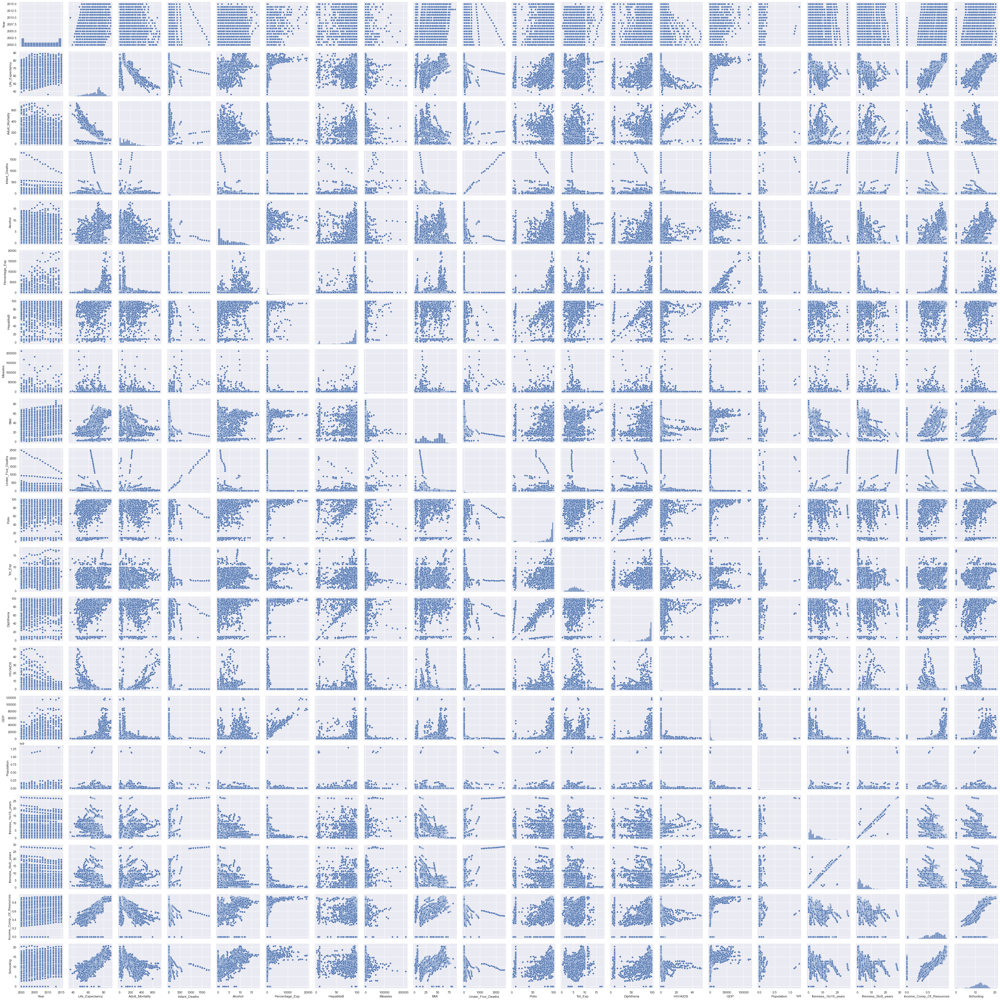

In [24]:
sns.pairplot(dataframe, dropna = True)

# Feature Selection and visualisation

**A.Do various predicting factors which have been chosen initially really affect the 
Life expectancy? What are the predicting variables actually affecting life expectancy?**

To answer this question. Let us use correlation matrix using HeapMap

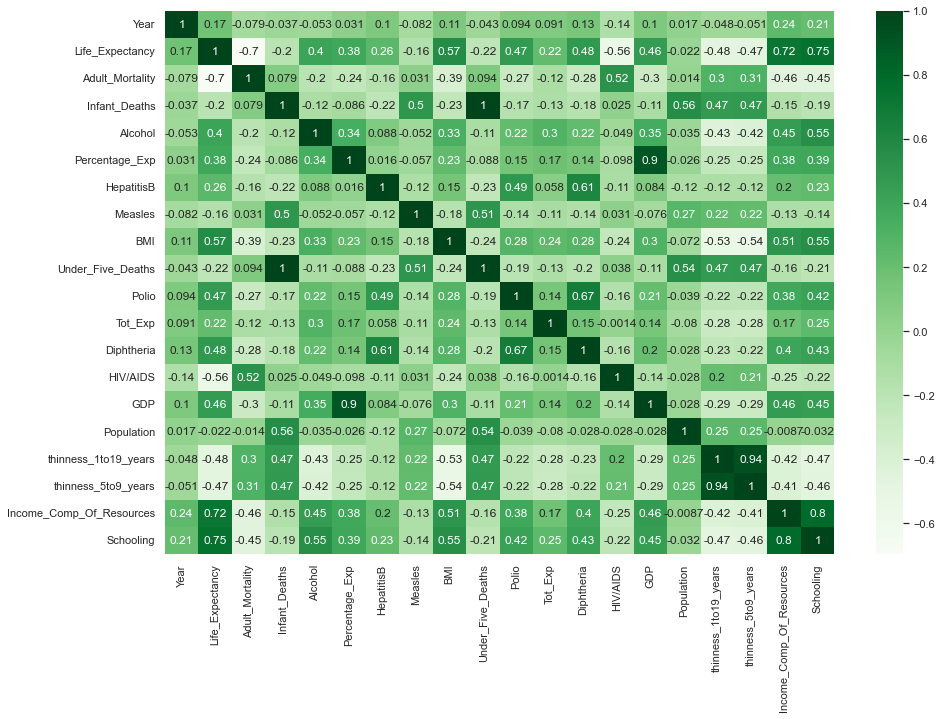

In [22]:
# generate heat map
plt.figure(figsize=(15,10))
sns.heatmap(dataframe.corr(),annot=True,cmap='Greens')
plt.show()

In [23]:
# check correlation of all attributes with life expectancy label
corr_data = dataframe.corr()['Life_Expectancy'].sort_values(ascending=False)
corr_data

Life_Expectancy             1.000000
Schooling                   0.751975
Income_Comp_Of_Resources    0.724776
BMI                         0.567694
Diphtheria                  0.479495
Polio                       0.465556
GDP                         0.461455
Alcohol                     0.404877
Percentage_Exp              0.381864
HepatitisB                  0.256762
Tot_Exp                     0.218086
Year                        0.170033
Population                 -0.021538
Measles                    -0.157586
Infant_Deaths              -0.196557
Under_Five_Deaths          -0.222529
thinness_5to9_years        -0.471584
thinness_1to19_years       -0.477183
HIV/AIDS                   -0.556556
Adult_Mortality            -0.696359
Name: Life_Expectancy, dtype: float64

**From this correlation heatmap and correlation data we can infer that:**

Strong Positive Correlation:
1. Schooling
2. Income composition resources
3. BMI

Strong Negative Correlation:
1. Adult Mortality
2. HIV/AIDS

Moderate Negative Correlation
1. thinness 1-19 years
2. thinness 5-9 years 

Moderate Positive Correlation
1. Diphtheria
2. Polio
3. GDP
4. Alcohol
5. percentage expenditure

**ANSWER**

From Correlation data we can say that Strong Positive Correlation ,Strong Negative Correlation, Moderate Negative Correlation, Moderate Positive Correlation have impact on life expectancy. hence they may be a good predictors of life life expectancy.

All predicting variables was then divided into several broad categories:Immunization related factors, Mortality factors, Economical factors and Social factors.

But Here we have Alcohol Consumption in a Moderate Positive Correlation with life expectancy, How can this be possible!!

**B. Should a country having a lower life expectancy value (<65) increase its healthcare expenditure in 
order to improve its average lifespan?**

In [25]:
#check for life expectency < 65
dataframe[(dataframe['Life_Expectancy']<65)]

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,HepatitisB,Measles,...,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,66.0,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


851 records having a lower life expectancy value (<65)

In [27]:
# This us check the correlations for lower life expectancy value (<65)
df1=dataframe[(dataframe['Life_Expectancy']<65)]
corr_data_1 = df1.corr()['Life_Expectancy'].sort_values(ascending=False)
corr_data_1

Life_Expectancy             1.000000
Year                        0.281354
BMI                         0.249634
Income_Comp_Of_Resources    0.247951
Diphtheria                  0.208459
Schooling                   0.195598
Polio                       0.160088
Population                  0.091477
thinness_5to9_years         0.067246
thinness_1to19_years        0.052825
HepatitisB                  0.043531
GDP                         0.038691
Infant_Deaths               0.027356
Percentage_Exp              0.012086
Under_Five_Deaths          -0.001426
Measles                    -0.108162
Tot_Exp                    -0.156741
Alcohol                    -0.201564
Adult_Mortality            -0.374006
HIV/AIDS                   -0.542226
Name: Life_Expectancy, dtype: float64

In [28]:
# This us check the correlations for high life expectancy value (<65)
df2=dataframe[(dataframe['Life_Expectancy']>=65)]
corr_data_2 = df2.corr()['Life_Expectancy'].sort_values(ascending=False)
corr_data_2

Life_Expectancy             1.000000
Schooling                   0.643120
Income_Comp_Of_Resources    0.576788
GDP                         0.520610
Percentage_Exp              0.470551
Alcohol                     0.443937
Tot_Exp                     0.309941
BMI                         0.282921
Diphtheria                  0.187149
Polio                       0.184493
Year                        0.116224
HepatitisB                  0.066586
Measles                    -0.081632
Population                 -0.099241
Under_Five_Deaths          -0.187771
Infant_Deaths              -0.188690
HIV/AIDS                   -0.258565
thinness_1to19_years       -0.391643
thinness_5to9_years        -0.420130
Adult_Mortality            -0.550420
Name: Life_Expectancy, dtype: float64

Here we have 2 columns for healthcare expenditures:

1. Percentage Expenditure:   Expenditure on health as a percentage of Gross Domestic Product per capita(%)


2. Total Expenditure: General government expenditure on health as a percentage of total government expenditure (%)

In [30]:
# creating separated dataframes for life expectancy value (<65) 
LE_under65 = dataframe[dataframe['Life_Expectancy']<65]
Percent_Exp_L65 = LE_under65.corr()['Life_Expectancy']['Percentage_Exp']
Total_Exp_L65 = LE_under65.corr()['Life_Expectancy']['Tot_Exp']
print("Correction between Life_Expectancy(<65) and Percentage Expenditure :" ,Percent_Exp_L65)
print("\n")
print("Correction between Life_Expectancy(<65) and Total Expenditure :" ,Total_Exp_L65)
print("\n")

# creating separated dataframes for life expectancy value (>=65)
LE_above65 = dataframe[dataframe['Life_Expectancy']>=65]
Percent_Exp_G65 = LE_above65.corr()['Life_Expectancy']['Percentage_Exp']
Total_Exp_G65 = LE_above65.corr()['Life_Expectancy']['Tot_Exp']
print("Correction between Life_Expectancy(>65) and Percentage Expenditure :" ,Percent_Exp_G65)
print("\n")
print("Correction between Life_Expectancy(>65) and Total Expenditure :" ,Total_Exp_G65)

Correction between Life_Expectancy(<65) and Percentage Expenditure : 0.012085545644473223


Correction between Life_Expectancy(<65) and Total Expenditure : -0.15674121073082062


Correction between Life_Expectancy(>65) and Percentage Expenditure : 0.4705507883217776


Correction between Life_Expectancy(>65) and Total Expenditure : 0.3099413438662804


**ANSWER:** 
From above correlations we can say that a country having a high life expectancy value (>65) have moderate/some corelation with healthcare expenditure as compared to a country having a lower life expectancy value (<65).
So General government expenditure on health(including nutrition) should increase and there is a scope to improve average lifespan.

We can also see the correlation with tha help of plots.

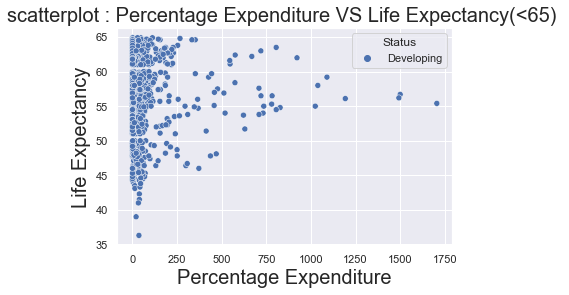

In [31]:
p=sns.scatterplot(data=LE_under65,x="Percentage_Exp", y="Life_Expectancy", hue="Status")
p.set_xlabel("Percentage Expenditure", fontsize = 20)
p.set_ylabel("Life Expectancy", fontsize = 20)
plt.title("scatterplot : Percentage Expenditure VS Life Expectancy(<65) ",fontsize = 20)
plt.show()
#p.set_xlim(0,15)

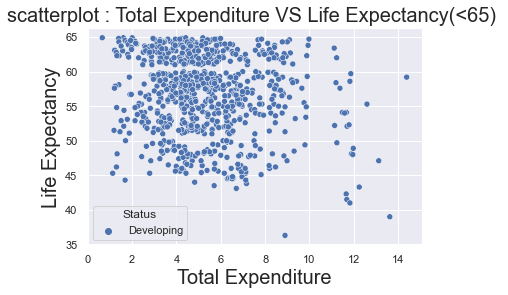

In [32]:
p=sns.scatterplot(data=LE_under65,x="Tot_Exp", y="Life_Expectancy", hue="Status")
p.set_xlabel("Total Expenditure", fontsize = 20)
p.set_ylabel("Life Expectancy", fontsize = 20)
plt.title("scatterplot : Total Expenditure VS Life Expectancy(<65) ",fontsize = 20)
plt.show()
#p.set_xlim(0,15)

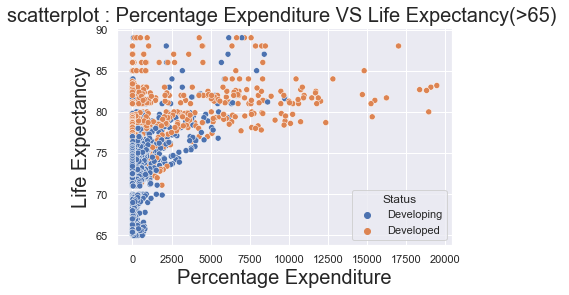

In [33]:
p=sns.scatterplot(data=LE_above65,x="Percentage_Exp", y="Life_Expectancy", hue="Status")
p.set_xlabel("Percentage Expenditure", fontsize = 20)
p.set_ylabel("Life Expectancy", fontsize = 20)
plt.title("scatterplot : Percentage Expenditure VS Life Expectancy(>65) ",fontsize = 20)
plt.show()

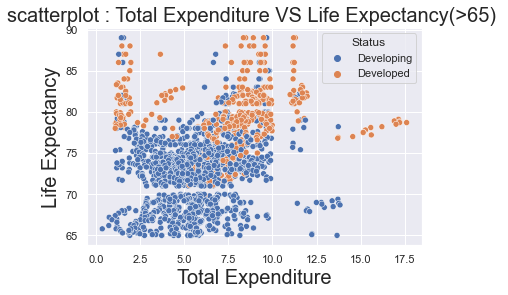

In [34]:
p=sns.scatterplot(data=LE_above65,x="Tot_Exp", y="Life_Expectancy", hue="Status")
p.set_xlabel("Total Expenditure", fontsize = 20)
p.set_ylabel("Life Expectancy", fontsize = 20)
plt.title("scatterplot : Total Expenditure VS Life Expectancy(>65) ",fontsize = 20)
plt.show()

**C. How do Infant and Adult mortality rates affect life expectancy?**

In [35]:
# Lets check the correlations

In [36]:
print("Correction between Life_Expectancy and Adult mortality :" ,corr_data['Adult_Mortality'])
print("Correction between Life_Expectancy and Infant Deaths :" ,corr_data['Infant_Deaths'])

Correction between Life_Expectancy and Adult mortality : -0.6963593137699746
Correction between Life_Expectancy and Infant Deaths : -0.19655717665526176


**ANSWER:** 
1. From this we can say that Adult mortality has high negative correlation with life expectancy. As Adult mortality increases, life expectancy decreases .

We can check it with the help of plots also

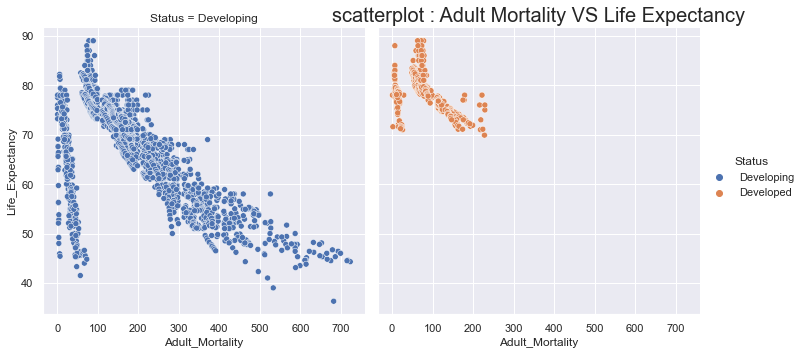

In [37]:
#Lets check some plots
sns.relplot(x="Adult_Mortality", y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("scatterplot : Adult Mortality VS Life Expectancy",fontsize = 20)
plt.show()

Clearly there is a negative correlation.

Text(0.5, 1.0, 'Box Plot : Adult_Mortality')

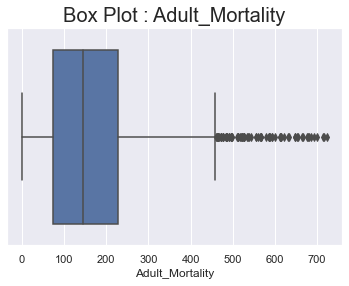

In [38]:
#Box Plot
ax = sns.boxplot(x=dataframe['Adult_Mortality'])
plt.title("Box Plot : Adult_Mortality",fontsize = 20)
#ax.set_xlim(0,100)

In [39]:
dataframe['Adult_Mortality'].describe()

count    2928.000000
mean      164.796448
std       124.292079
min         1.000000
25%        74.000000
50%       144.000000
75%       228.000000
max       723.000000
Name: Adult_Mortality, dtype: float64

**Check for outliers using box plot**

Q1 = 74.000000

Q3 = 228.000000

IQR= Q3-Q1 = 154

Outliers< Q1-1.5IQR < -157

Outliers> Q3+1.5IQR > 459

we can not drop it.

**Now check for Infant_Deaths : Number of Infant Deaths per 1000 population**

As Correction between Life_Expectancy and Infant Deaths : -0.19655717665526176 which is very less

In [40]:
dataframe['Infant_Deaths'].describe()

count    2938.000000
mean       30.303948
std       117.926501
min         0.000000
25%         0.000000
50%         3.000000
75%        22.000000
max      1800.000000
Name: Infant_Deaths, dtype: float64

This feature is having mean 30 with standard deviation 117. Also maximum value is 1800 . Let us check with some graphs

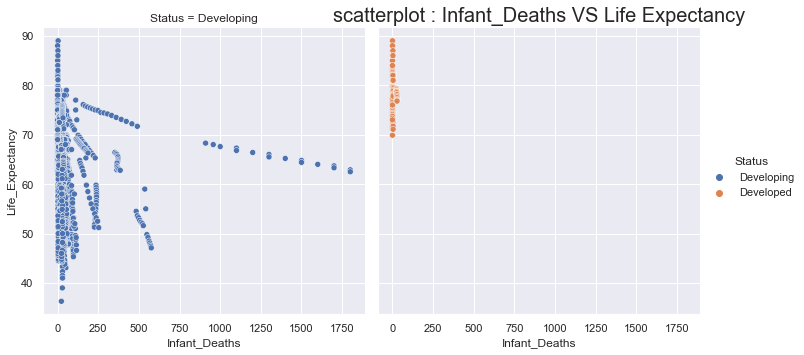

In [42]:
sns.relplot(x="Infant_Deaths", y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("scatterplot : Infant_Deaths VS Life Expectancy",fontsize = 20)
plt.show()

There is a huge variation in this attribute.

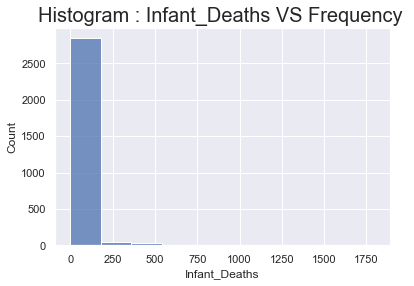

In [43]:
sns.histplot(data=dataframe['Infant_Deaths'], bins=10)
p.set_xlabel("Infant_Deaths", fontsize = 20)
#p.set_ylabel("Life Expectancy", fontsize = 20)
plt.title("Histogram : Infant_Deaths VS Frequency ",fontsize = 20)
#p.set_xlim(0,100)
plt.show()

There are so many outliers in this record.

In [44]:
dataframe['Infant_Deaths'].describe()

count    2938.000000
mean       30.303948
std       117.926501
min         0.000000
25%         0.000000
50%         3.000000
75%        22.000000
max      1800.000000
Name: Infant_Deaths, dtype: float64

Text(0.5, 1.0, 'Box Plot : Infant_Deaths')

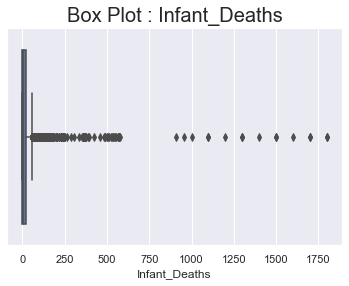

In [45]:
ax = sns.boxplot(x=dataframe['Infant_Deaths'])
plt.title("Box Plot : Infant_Deaths",fontsize = 20)
#ax.set_xlim(0,100)

**Check for outliers using box plot**

Q1 = 0.000000

Q3 = 22.000000

IQR= Q3-Q1 = 22.000000

Outliers< Q1-1.5IQR= 0-1.5*22.000000 <-33

Outliers> Q3+1.5IQR=22+1.5*22>55

we can not drop it. let us check for Infant_Deaths<55 values

(0.0, 70.0)

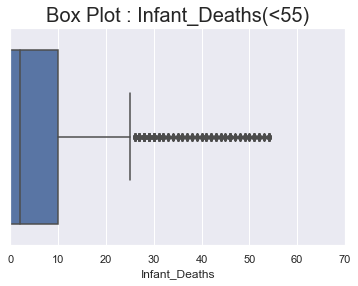

In [46]:
df1=dataframe[dataframe['Infant_Deaths']<55]
ax = sns.boxplot(x=df1['Infant_Deaths'])
plt.title("Box Plot : Infant_Deaths(<55)",fontsize = 20)
ax.set_xlim(0,70)

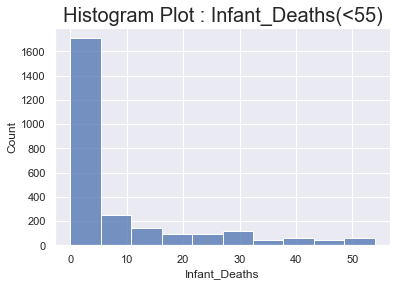

In [47]:
sns.histplot(data=df1['Infant_Deaths'], bins=10)
plt.title("Histogram Plot : Infant_Deaths(<55)",fontsize = 20)
plt.show()

In [48]:
corr_data

Life_Expectancy             1.000000
Schooling                   0.751975
Income_Comp_Of_Resources    0.724776
BMI                         0.567694
Diphtheria                  0.479495
Polio                       0.465556
GDP                         0.461455
Alcohol                     0.404877
Percentage_Exp              0.381864
HepatitisB                  0.256762
Tot_Exp                     0.218086
Year                        0.170033
Population                 -0.021538
Measles                    -0.157586
Infant_Deaths              -0.196557
Under_Five_Deaths          -0.222529
thinness_5to9_years        -0.471584
thinness_1to19_years       -0.477183
HIV/AIDS                   -0.556556
Adult_Mortality            -0.696359
Name: Life_Expectancy, dtype: float64

In [49]:
df1.corr()['Life_Expectancy'].sort_values(ascending=False)

Life_Expectancy             1.000000
Schooling                   0.741876
Income_Comp_Of_Resources    0.707784
BMI                         0.528760
GDP                         0.455832
Diphtheria                  0.428745
Alcohol                     0.424190
Polio                       0.422668
Percentage_Exp              0.381075
Tot_Exp                     0.207436
HepatitisB                  0.203683
Year                        0.153109
Population                  0.082447
Measles                    -0.124392
thinness_5to9_years        -0.510865
thinness_1to19_years       -0.515765
Infant_Deaths              -0.523787
HIV/AIDS                   -0.559499
Under_Five_Deaths          -0.567657
Adult_Mortality            -0.705182
Name: Life_Expectancy, dtype: float64

From above 2 correlation records are showing that after taking Infant_Deaths(<55) there is a improvement in correlation with value -0.523028. Also it is affecting other attribute's correlation.

**ANSWER:** 

From this we can say that Infant_Deaths has negative correlation with life expectancy. As Infant_Deaths increases, life expectancy decreases .

**D. Does Life Expectancy have positive or negative correlation with eating habits, lifestyle, exercise,
smoking, drinking alcohol etc.**

In [50]:
corr_data['BMI']

0.5676935475459853

In [51]:
corr_data["Alcohol"]

0.4048767611266021

From Google:-BMI

below 18.5 – you're in the underweight range. 

between 18.5 and 24.9 – you're in the healthy weight range. 

between 25 and 29.9 – you're in the overweight range. 

between 30 and 39.9 – you're in the obese range.

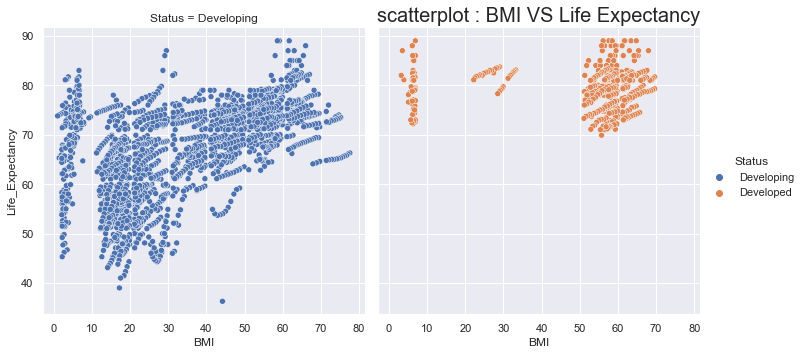

In [52]:
sns.relplot(x="BMI", y="Life_Expectancy", hue="Status",col="Status", data=dataframe)
plt.title("scatterplot : BMI VS Life Expectancy",fontsize = 20)
plt.show()

From correlation BMI shows positive correlation with life expectancy. But some BMI values are not good for health(Practically).May be there are outliers.

Text(0.5, 1.0, 'Box Plot : BMI')

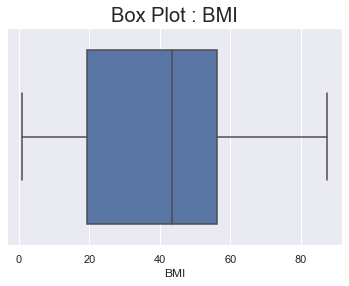

In [53]:
ax = sns.boxplot(x=dataframe['BMI'])
plt.title("Box Plot : BMI",fontsize = 20)
#ax.set_xlim(0,100)

In [54]:
dataframe['BMI'].describe()

count    2904.000000
mean       38.321247
std        20.044034
min         1.000000
25%        19.300000
50%        43.500000
75%        56.200000
max        87.300000
Name: BMI, dtype: float64

Maximum Value is 87!! 

**E. What is the impact of schooling on the lifespan of humans?**

It shows: Number of years of Schooling(years)

In [57]:
corr_data['Schooling']

0.7519754627367001

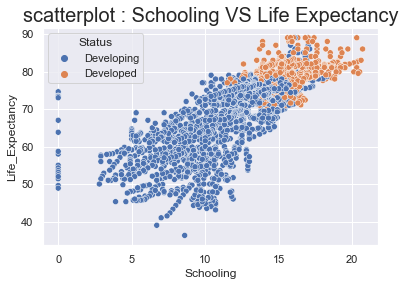

In [58]:
sns.scatterplot(data=dataframe,x="Schooling", y="Life_Expectancy", hue="Status")
plt.title("scatterplot : Schooling VS Life Expectancy",fontsize = 20)
plt.show()

As Number of years of Schooling(years) increases,Life Expectancy also increases. Correlation is very strong.

**F. Does Life Expectancy have a positive or negative relationship with drinking alcohol?**

It shows: Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol)

In [59]:
corr_data["Alcohol"]

0.4048767611266021

Having some positive correlation with Life_Expectancy..

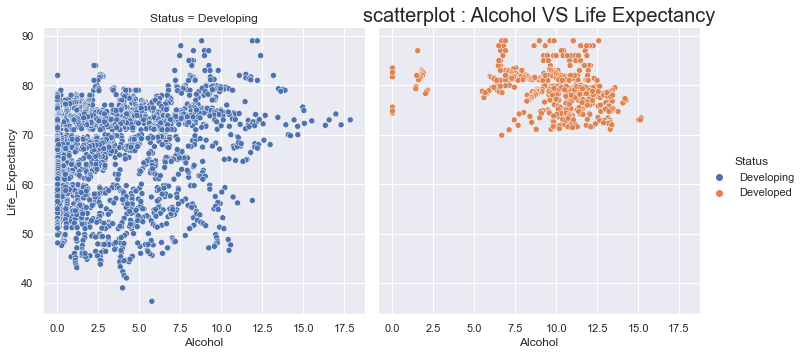

In [61]:
sns.relplot(x="Alcohol", y="Life_Expectancy", hue="Status",col="Status", data=dataframe)
plt.title("scatterplot : Alcohol VS Life Expectancy",fontsize = 20)
plt.show()

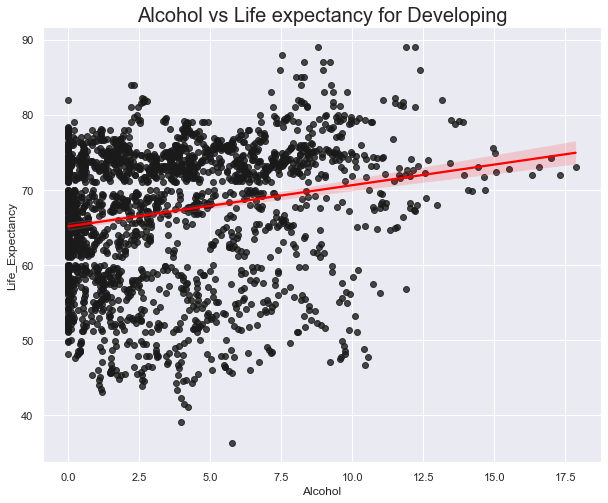

In [62]:
# Check for developing countries
df2=dataframe[dataframe['Status']=='Developing']
plt.figure(figsize=(10,8))
sns.regplot(x="Alcohol",
           y="Life_Expectancy",
           data =  df2,
           scatter_kws={"color":"k"},
           line_kws={"color":"red"})
plt.title("Alcohol vs Life expectancy for Developing",fontsize = 20)
plt.show()

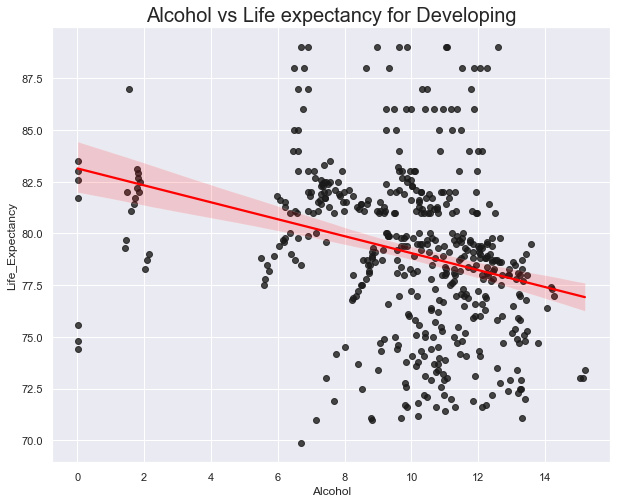

In [63]:
# Check for developing countries
df3=dataframe[dataframe['Status']=='Developed']
plt.figure(figsize=(10,8))
sns.regplot(x="Alcohol",
           y="Life_Expectancy",
           data =  df3,
           scatter_kws={"color":"k"},
           line_kws={"color":"red"})
plt.title("Alcohol vs Life expectancy for Developing",fontsize = 20)
plt.show()

In [64]:
print("Correlation between Life_Expectancy and Alcohol for Developing countries :" ,df2["Alcohol"].corr(df2["Life_Expectancy"]))
print("Correlation between Life_Expectancy and Alcohol for Developed countries :" ,df3["Alcohol"].corr(df3["Life_Expectancy"]))

Correlation between Life_Expectancy and Alcohol for Developing countries : 0.20342901520579193
Correlation between Life_Expectancy and Alcohol for Developed countries : -0.2877693621506767


There is a difference in Correlation between Life_Expectancy and Alcohol for Developing and Developed countries.

Text(0.5, 1.0, 'Box Plot : Alcohol')

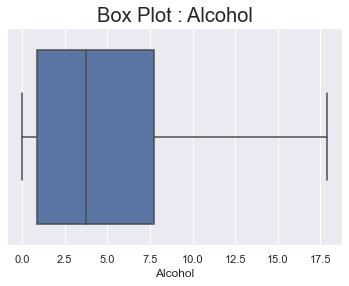

In [65]:
ax = sns.boxplot(x=dataframe['Alcohol'])
plt.title("Box Plot : Alcohol",fontsize = 20)
#ax.set_xlim(0,100)

**G. Do densely populated countries tend to have lower life expectancy?**

In [66]:
corr_data["Population"]

-0.021538108386786287

In [67]:
dataframe['Population'].describe()

count    2.286000e+03
mean     1.275338e+07
std      6.101210e+07
min      3.400000e+01
25%      1.957932e+05
50%      1.386542e+06
75%      7.420359e+06
max      1.293859e+09
Name: Population, dtype: float64

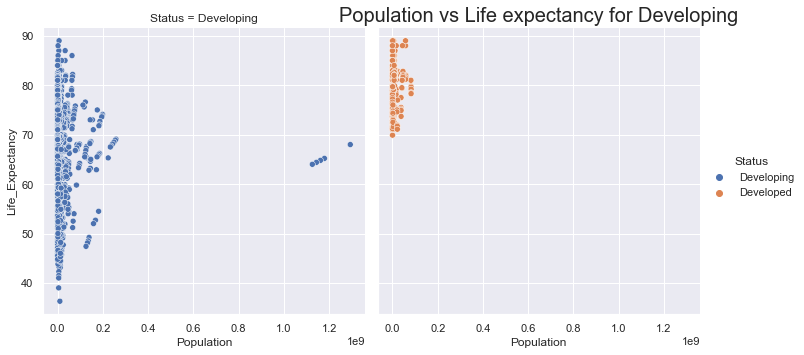

In [68]:
sns.relplot(x='Population', y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("Population vs Life expectancy for Developing",fontsize = 20)
plt.show()

Population doesn't seem to have any good realtion with life expectancy.

**H. What is the impact of Immunization coverage on life Expectancy?**

Immunization Factors Available:

Hepatitis B (HepB) immunization coverage among 1-year-olds (%)

Polio (Pol3) immunization coverage among 1-year-olds (%)

Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)

Correction between Life_Expectancy and HepatitisB : 0.25676194760492504


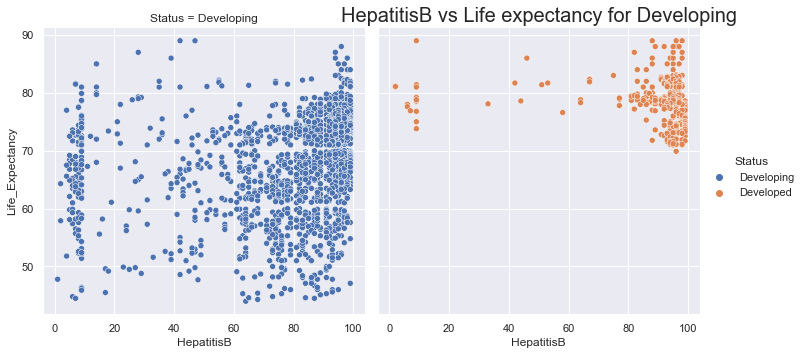

In [70]:
sns.relplot(x='HepatitisB', y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("HepatitisB vs Life expectancy for Developing",fontsize = 20)
print("Correction between Life_Expectancy and HepatitisB :" ,corr_data['HepatitisB'])
plt.show()

Correlation between immunization coverage for HepatitisB vs Life expectancy is positive but low.

Correction between Life_Expectancy and Polio : 0.46555580597719776


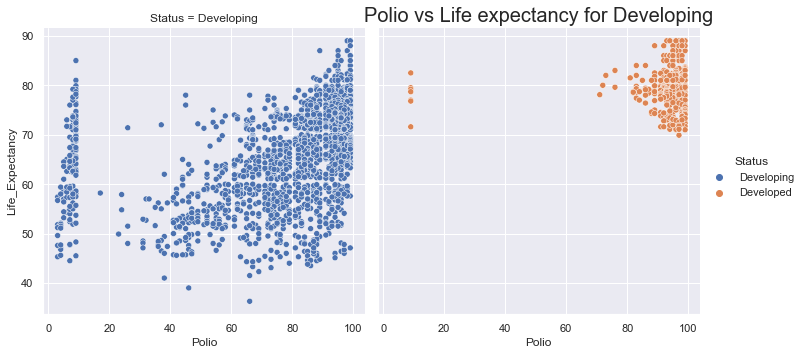

In [71]:
sns.relplot(x='Polio', y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("Polio vs Life expectancy for Developing",fontsize = 20)
print("Correction between Life_Expectancy and Polio :" ,corr_data['Polio'])
plt.show()

Correlation between immunization coverage for Polio vs Life expectancy is positive.

Text(0.5, 1.0, 'Box Plot : Polio')

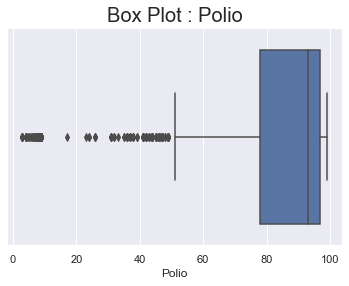

In [72]:
ax = sns.boxplot(x=dataframe['Polio'])
plt.title("Box Plot : Polio",fontsize = 20)
#ax.set_xlim(0,100)

In [73]:
dataframe['Polio'].describe()

count    2919.000000
mean       82.550188
std        23.428046
min         3.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Polio, dtype: float64

Check for outliers in using box plot

Q1 =83.000000
Q3 = 97.000000

IQR= Q3-Q1 = 14

Outliers< Q1-1.5IQR= 83-1.5*14 <62

Outliers> Q3+1.5IQR=97+1.5*14>118

we can not drop it. let us check for polio<62 values

Correction between Life_Expectancy and Diphtheria : 0.47949486434158606


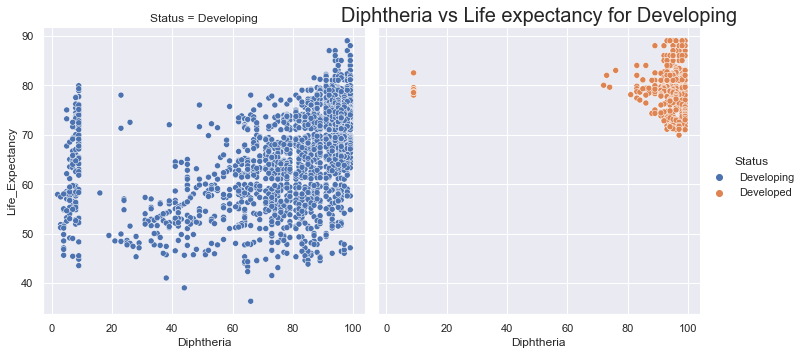

In [74]:
sns.relplot(x='Diphtheria', y="Life_Expectancy", hue="Status", col="Status", data=dataframe)
plt.title("Diphtheria vs Life expectancy for Developing",fontsize = 20)
print("Correction between Life_Expectancy and Diphtheria :" ,corr_data['Diphtheria'])
plt.show()

Text(0.5, 1.0, 'Box Plot : Diphtheria')

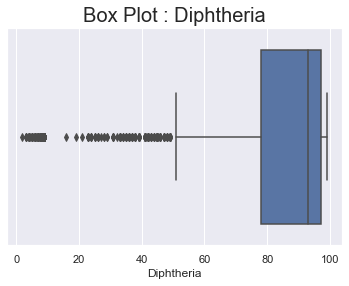

In [75]:
ax = sns.boxplot(x=dataframe['Diphtheria'])
plt.title("Box Plot : Diphtheria",fontsize = 20)
#ax.set_xlim(0,100)

Check for outliers in H_distance using box plot

Q1 =78.000000 Q3 = 97.000000

IQR= Q3-Q1 = 19

Outliers< Q1-1.5IQR= 78-1.5*19 <49.5

Outliers> Q3+1.5IQR=97+1.5*19>98.5

we can not drop it. 

In [77]:
dataframe['Diphtheria'].describe()

count    2919.000000
mean       82.324084
std        23.716912
min         2.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Diphtheria, dtype: float64

Correlation between immunization coverage for Diphtheria vs Life expectancy is positive.

## 1.Data Cleaning 

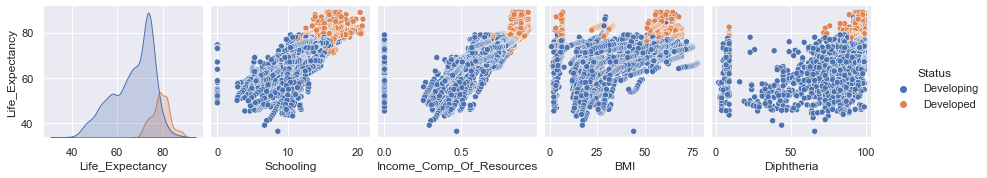

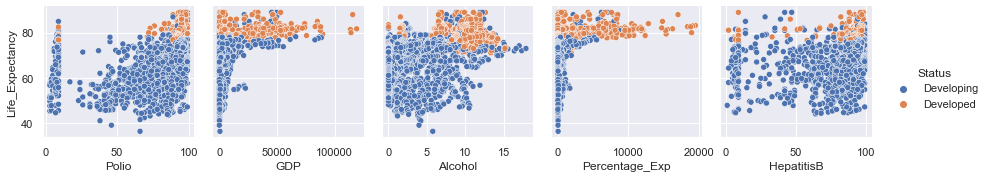

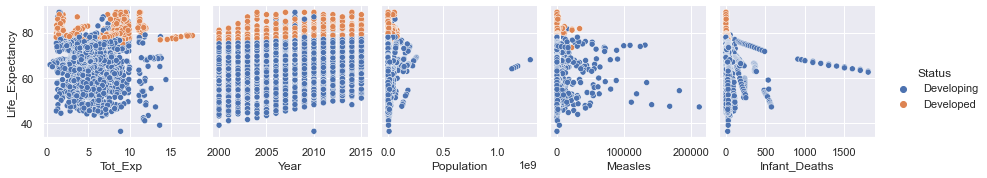

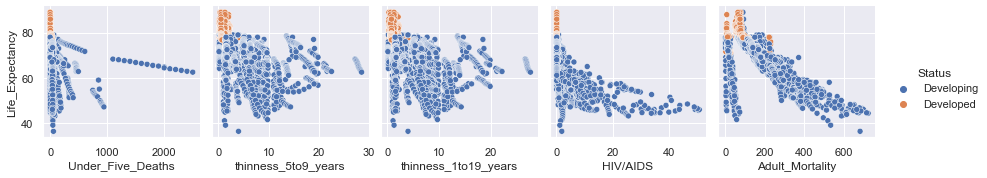

In [78]:
for i in range(0, len(corr_data.index), 5):
    sns.pairplot(data=dataframe,
                x_vars = corr_data.index[i : i + 5],
                y_vars = ['Life_Expectancy'],hue="Status")

We can see from graphs that some attributes have very strong correlation.

In [79]:
dataframe.isnull().sum()

Country                       0
Year                          0
Status                        0
Life_Expectancy              10
Adult_Mortality              10
Infant_Deaths                 0
Alcohol                     194
Percentage_Exp                0
HepatitisB                  553
Measles                       0
BMI                          34
Under_Five_Deaths             0
Polio                        19
Tot_Exp                     226
Diphtheria                   19
HIV/AIDS                      0
GDP                         448
Population                  652
thinness_1to19_years         34
thinness_5to9_years          34
Income_Comp_Of_Resources    167
Schooling                   163
dtype: int64

There are two many null values in GDP,Population and HepatitisB. Also we can not impute these null with some Imputer Because it will not make any sense.

In [80]:
dataframe.shape

(2938, 22)

Let us check for outliers from Box Plots for different attributes

In [81]:
dataframe.loc[dataframe['Infant_Deaths'] >55].shape

(315, 22)

In [82]:
dataframe.loc[dataframe['Diphtheria']<49.5].shape

(298, 22)

In [83]:
dataframe.loc[dataframe['Diphtheria']>98.5].shape

(350, 22)

In [84]:
dataframe.loc[dataframe['Polio']<62].shape

(375, 22)

In [85]:
dataframe.loc[dataframe['Polio']>118].shape

(0, 22)

In [86]:
dataframe.loc[dataframe['Schooling']<3.7].shape

(41, 22)

In [87]:
dataframe.loc[dataframe['Adult_Mortality']>459].shape

(82, 22)

If we check for the rows with all those conditions(AND operationn), We get no such row.

In [88]:
# If we remove all outliers #of rows would be 974 which is very huge
df=dataframe.loc[(dataframe['Infant_Deaths'] >55)|(dataframe['Adult_Mortality']>459)|(dataframe['Schooling']<3.7)|(dataframe['Schooling']>20.6)|(dataframe['Polio']>118)&(dataframe['Polio']<62)|(dataframe['Diphtheria']>98.5)|(dataframe['Diphtheria']<49.5)]
df.shape

(974, 22)

Huge No. So can not simply remove all outliers!!!

As we have very less samples to train our model.

In [93]:
# Let us first remove the columns with large null values

In [96]:
#ake copy first to reduce risk!!
df_copy=dataframe.copy()

In [98]:
df_copy.shape

(2938, 22)

In [94]:
# Let us first remove the columns with large null values
dfNew=dataframe.drop(columns=['HepatitisB','Population','GDP'],inplace=False)

In [95]:
dfNew.shape

(2938, 19)

In [99]:
#Before replacing Values!!
dfNew.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,27.700000,28.600000,0.948000,20.700000


In [100]:
#replacing null values with the median of the respective columns
dfNew.fillna(value=dfNew.median(), inplace=True)
dfNew.isna().any().sum()

0

In [101]:
#After replacing values
dfNew.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.234717,164.725664,30.303948,4.546875,738.251295,2419.592240,38.381178,42.035739,82.617767,5.924098,82.393125,1.742103,4.821886,4.852144,0.630362,12.009837
std,4.613841,9.509115,124.086215,117.926501,3.921946,1987.914858,11467.272489,19.935375,160.445548,23.367166,2.400770,23.655562,5.077785,4.397621,4.485854,0.205140,3.265139
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,17.000000,43.500000,4.000000,93.000000,5.755000,93.000000,0.100000,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,27.700000,28.600000,0.948000,20.700000


In [102]:
dfNew.columns

Index(['Country', 'Year', 'Status', 'Life_Expectancy', 'Adult_Mortality',
       'Infant_Deaths', 'Alcohol', 'Percentage_Exp', 'Measles', 'BMI',
       'Under_Five_Deaths', 'Polio', 'Tot_Exp', 'Diphtheria', 'HIV/AIDS',
       'thinness_1to19_years', 'thinness_5to9_years',
       'Income_Comp_Of_Resources', 'Schooling'],
      dtype='object')

In [103]:
corr_data


Life_Expectancy             1.000000
Schooling                   0.751975
Income_Comp_Of_Resources    0.724776
BMI                         0.567694
Diphtheria                  0.479495
Polio                       0.465556
GDP                         0.461455
Alcohol                     0.404877
Percentage_Exp              0.381864
HepatitisB                  0.256762
Tot_Exp                     0.218086
Year                        0.170033
Population                 -0.021538
Measles                    -0.157586
Infant_Deaths              -0.196557
Under_Five_Deaths          -0.222529
thinness_5to9_years        -0.471584
thinness_1to19_years       -0.477183
HIV/AIDS                   -0.556556
Adult_Mortality            -0.696359
Name: Life_Expectancy, dtype: float64

In [104]:
# check correlation of all attributes with life expectancy label
corr_data_1 = dfNew.corr()['Life_Expectancy'].sort_values(ascending=False)
corr_data_1

Life_Expectancy             1.000000
Schooling                   0.713054
Income_Comp_Of_Resources    0.688662
BMI                         0.556901
Diphtheria                  0.472211
Polio                       0.458399
Alcohol                     0.388918
Percentage_Exp              0.381418
Tot_Exp                     0.208844
Year                        0.170819
Measles                    -0.157767
Infant_Deaths              -0.196769
Under_Five_Deaths          -0.222738
thinness_5to9_years        -0.462473
thinness_1to19_years       -0.468002
HIV/AIDS                   -0.556703
Adult_Mortality            -0.696390
Name: Life_Expectancy, dtype: float64

## 3.Data Scaling

In [106]:
DF_scaled=dfNew

In [357]:
# Import libraries
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

sts = StandardScaler()
# one hot encoding for ordinal attributes
onehot=OneHotEncoder(sparse = False)
X=dfNew
X

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,1154,19.1,83,6.0,8.16,65.0,0.1,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,492,18.6,86,58.0,8.18,62.0,0.1,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,430,18.1,89,62.0,8.13,64.0,0.1,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,2787,17.6,93,67.0,8.52,67.0,0.1,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,3013,17.2,97,68.0,7.87,68.0,0.1,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,31,27.1,42,67.0,7.13,65.0,33.6,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,998,26.7,41,7.0,6.52,68.0,36.7,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,304,26.3,40,73.0,6.53,71.0,39.8,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,529,25.9,39,76.0,6.16,75.0,42.1,1.6,1.7,0.427,9.8


In [358]:
# OneHot Encoding on Day of Status
Y= onehot.fit_transform((X[['Status']]))
X.drop(['Status'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['MON', 'TUE', 'WED', 'THU','FRI','SAT','SUM']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,Country,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,thinness_1to19_years,thinness_5to9_years,Income_Comp_Of_Resources,Schooling,Status_Developed,Status_Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,1154,19.1,83,6.0,8.16,65.0,0.1,17.2,17.3,0.479,10.1,0.0,1.0
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,492,18.6,86,58.0,8.18,62.0,0.1,17.5,17.5,0.476,10.0,0.0,1.0
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,430,18.1,89,62.0,8.13,64.0,0.1,17.7,17.7,0.470,9.9,0.0,1.0
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,2787,17.6,93,67.0,8.52,67.0,0.1,17.9,18.0,0.463,9.8,0.0,1.0
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,3013,17.2,97,68.0,7.87,68.0,0.1,18.2,18.2,0.454,9.5,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,44.3,723.0,27,4.36,0.000000,31,27.1,42,67.0,7.13,65.0,33.6,9.4,9.4,0.407,9.2,0.0,1.0
2934,Zimbabwe,2003,44.5,715.0,26,4.06,0.000000,998,26.7,41,7.0,6.52,68.0,36.7,9.8,9.9,0.418,9.5,0.0,1.0
2935,Zimbabwe,2002,44.8,73.0,25,4.43,0.000000,304,26.3,40,73.0,6.53,71.0,39.8,1.2,1.3,0.427,10.0,0.0,1.0
2936,Zimbabwe,2001,45.3,686.0,25,1.72,0.000000,529,25.9,39,76.0,6.16,75.0,42.1,1.6,1.7,0.427,9.8,0.0,1.0


In [359]:
# OneHot Encoding on Month
Y= onehot.fit_transform((X[['Year']]))
X.drop(['Year'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['JAN', 'FEB', 'MAR', 'APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,Country,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,...,Year_2006,Year_2007,Year_2008,Year_2009,Year_2010,Year_2011,Year_2012,Year_2013,Year_2014,Year_2015
0,Afghanistan,65.0,263.0,62,0.01,71.279624,1154,19.1,83,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,Afghanistan,59.9,271.0,64,0.01,73.523582,492,18.6,86,58.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,Afghanistan,59.9,268.0,66,0.01,73.219243,430,18.1,89,62.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,Afghanistan,59.5,272.0,69,0.01,78.184215,2787,17.6,93,67.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,Afghanistan,59.2,275.0,71,0.01,7.097109,3013,17.2,97,68.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,44.3,723.0,27,4.36,0.000000,31,27.1,42,67.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2934,Zimbabwe,44.5,715.0,26,4.06,0.000000,998,26.7,41,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2935,Zimbabwe,44.8,73.0,25,4.43,0.000000,304,26.3,40,73.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2936,Zimbabwe,45.3,686.0,25,1.72,0.000000,529,25.9,39,76.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [361]:
# OneHot Encoding on Year
Y= onehot.fit_transform((X[['Country']]))
X.drop(['Country'], axis=1, inplace=True)
onehote = pd.DataFrame(Y)
#onehote.columns = ['2009','2010','2011','2012','2013','2014','2015']
onehote.columns = onehot.get_feature_names_out()
X = pd.concat([X, onehote], axis=1)
X

,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,...,Country_United Republic of Tanzania,Country_United States of America,Country_Uruguay,Country_Uzbekistan,Country_Vanuatu,Country_Venezuela (Bolivarian Republic of),Country_Viet Nam,Country_Yemen,Country_Zambia,Country_Zimbabwe
0,65.0,263.0,62,0.01,71.279624,1154,19.1,83,6.0,8.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,59.9,271.0,64,0.01,73.523582,492,18.6,86,58.0,8.18,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,59.9,268.0,66,0.01,73.219243,430,18.1,89,62.0,8.13,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,59.5,272.0,69,0.01,78.184215,2787,17.6,93,67.0,8.52,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,59.2,275.0,71,0.01,7.097109,3013,17.2,97,68.0,7.87,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,44.3,723.0,27,4.36,0.000000,31,27.1,42,67.0,7.13,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2934,44.5,715.0,26,4.06,0.000000,998,26.7,41,7.0,6.52,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2935,44.8,73.0,25,4.43,0.000000,304,26.3,40,73.0,6.53,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2936,45.3,686.0,25,1.72,0.000000,529,25.9,39,76.0,6.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [362]:
# Scaling using standard scaler
train_scaled_STS = sts.fit_transform(X)

In [364]:
train_scaled_STS

array([[-0.44540826,  0.79211913,  0.26882378, ..., -0.07399798,
        -0.07399798, -0.07399798],
       [-0.98182707,  0.85660141,  0.28578638, ..., -0.07399798,
        -0.07399798, -0.07399798],
       [-0.98182707,  0.83242056,  0.30274898, ..., -0.07399798,
        -0.07399798, -0.07399798],
       ...,
       [-2.57004747, -0.73933497, -0.04498439, ..., -0.07399798,
        -0.07399798, 13.51388175],
       [-2.51745739,  4.20161958, -0.04498439, ..., -0.07399798,
        -0.07399798, 13.51388175],
       [-2.44383128,  4.0323536 , -0.05346569, ..., -0.07399798,
        -0.07399798, 13.51388175]])

# 4.TRANSFORMATION PIPELINE

In [513]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [514]:
##df_pipe = pd.read_csv('train_NYTaxi.csv')
#test_pipe = pd.read_csv('test_NYTaxi.csv')
df_pipe = pd.read_csv("./Life Expectancy Data.csv")
df_pipe.shape
df_pipe.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [515]:
df_pipe.shape

(2938, 22)

In [516]:
class drop_underscore(BaseEstimator, TransformerMixin):
   
    def __init__(self, X):
        self.X = X
   
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        # Renaming some column names as they contain trailing spaces.
        X.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Exp","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_1to19_years"," thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Tot_Exp"},inplace=True)
        
        return X

In [517]:
class treat_null(BaseEstimator, TransformerMixin):
    

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        
        print(".......Null Remove ...........")
        X.fillna(value=X.median(), inplace=True)
        #X.dropna(inplace=True)
        return X

In [518]:
class ColDropper(BaseEstimator,TransformerMixin):
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        print(".............Column Drop............")
        X.drop(X[(X["Infant_Deaths"]>55)].index,inplace=True)#Drop Outliers
        #X=X.loc[dataframe['Infant_Deaths']
        return X.drop(columns=['HepatitisB','Population','GDP'])

In [519]:
from sklearn.preprocessing import OneHotEncoder

# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotS(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
        
    
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        print("...........OneHot Encode.............")
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['JAN', 'FEB', 'MAR', 'APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
        #onehot.columns=self.encoder.get_feature_names()
        onehot.columns=self.encoder.get_feature_names_out()
        X = pd.concat([X, onehot], axis=1)
        return X

In [520]:
from sklearn.preprocessing import OneHotEncoder

# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotY(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
        
    
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        #self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        print("...........OneHot Encode.............")
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['JAN', 'FEB', 'MAR', 'APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
        #onehot.columns=self.encoder.get_feature_names()
        onehot.columns=self.encoder.get_feature_names_out()
        X = pd.concat([X, onehot], axis=1)
        return X

In [521]:
from sklearn.preprocessing import OneHotEncoder


# Merge DataFrame with one hot data of categorical features
# This code mainly converts categorical data into one hot data and mergs with actual dataframe
class onehotC(BaseEstimator, TransformerMixin):
    def __init__(self, col):
        self.col = col # on which column, we need to perform one hot encoding
        
    
    # Here we are training the categorical encoder (learning which value should be replaced by which number)
    # by calling fit() only. remember, it will not change anything, but train the encoder object
    def fit(self, X, y=None):
        #self.X=X.reset_index(inplace=True)
        self.encoder = OneHotEncoder(sparse=False)
        self.encoder.fit(X[[self.col]])
        return self
    
    # All actions are here, we drop the categorical column & append the new one hot columns.
    def transform(self, X):
        self.mat = self.encoder.transform(X[[self.col]])
        X.drop([self.col], axis=1, inplace=True)
        onehot = pd.DataFrame(self.mat)
        #onehot.columns = ['H1','H2','H3','H4','H5','H6','H7','H8','H9','H10','H11','H12','H13','H14','H15','H16','H17','H18','H19','H20','H21','H22','H23','H24']
        onehot.columns=self.encoder.get_feature_names_out()
        #onehot.columns = self.names
        X = pd.concat([X, onehot], axis=1)
        #sts = StandardScaler()
        X = X.drop(X.columns[[0]],axis = 1)
        #train_scaled_STS = sts.fit_transform(X)
        #return train_scaled_STS
        print("...........Scaled.............")
        return X

In [522]:
pre_pipe = Pipeline([
    ("drop_underscore",drop_underscore(X=df_pipe)),
    ("Treat Null",treat_null()),
    ("ColDropper",ColDropper()),
    ('onehotS', onehotS(col="Status")),#OneHot Encoding For Status
    ('onehotY', onehotY(col="Year")),#OneHot Encoding For Year
    ('onehotC', onehotC(col="Country")),#OneHot Encoding For Country   
    ("StandardScaler",StandardScaler())    
])

df_prepared = pre_pipe.fit_transform(df_pipe)
df_prepared


.......Null Remove ...........
.............Column Drop............
...........OneHot Encode.............
...........OneHot Encode.............
...........Scaled.............


array([[ 0.82141078, -0.6842411 , -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       [ 0.7883019 , -1.23478233, -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       [ 0.75519302, -0.60082576, -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       ...,
       [-2.8205662 , -0.69258263,  1.22175538, ..., -0.07834107,
        -0.07834107, 12.76469741],
       [-2.76538473,  4.42077757,  1.22175538, ..., -0.07834107,
        -0.07834107, 12.76469741],
       [-2.68813068,  4.24560536,  1.14694995, ..., -0.07834107,
        -0.07834107, 12.76469741]])

In [523]:
df_prepared.shape

(2623, 212)

**Train Test Split**

In [542]:
x=df_prepared.copy()
x

array([[ 0.82141078, -0.6842411 , -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       [ 0.7883019 , -1.23478233, -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       [ 0.75519302, -0.60082576, -0.64838022, ..., -0.07834107,
        -0.07834107, -0.07834107],
       ...,
       [-2.8205662 , -0.69258263,  1.22175538, ..., -0.07834107,
        -0.07834107, 12.76469741],
       [-2.76538473,  4.42077757,  1.22175538, ..., -0.07834107,
        -0.07834107, 12.76469741],
       [-2.68813068,  4.24560536,  1.14694995, ..., -0.07834107,
        -0.07834107, 12.76469741]])

In [543]:
x.shape

(2623, 212)

In [544]:
y_train_ = x[:,0]
x_train_ = np.delete(x, 0, axis = 1)
#ones = np.ones((x_train_.shape[0],1))
#x_train_ = np.hstack((ones,x_train_))
y_train_.shape

(2623,)

In [545]:
x_train_.shape

(2623, 211)

In [560]:
# Train and Validation split in 90:10 ratio as sample size is very low
from sklearn.model_selection import train_test_split
X_train, X_Val, y_train, y_Val = train_test_split(x_train_,y_train_,
                                                    test_size=0.1, 
                                                    random_state=42)

In [561]:
X_train.shape

(2360, 211)

In [562]:
y_train.shape

(2360,)

In [563]:
X_Val.shape

(263, 211)

## Train a Model

**Linear Regression**

In [564]:
#using library for linear regression
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
#ones = np.ones((X_train.shape[0],1))
#X_train= np.hstack((ones,X_train))
lin_reg.fit(X_train, y_train)
#lin_reg.intercept_, lin_reg.coef_

LinearRegression()

In [565]:
Y_prec=lin_reg.predict(X_Val)
Y_prec.size

263

In [566]:
# Calculate mean squared error
from sklearn.metrics import mean_squared_error
loss_1 = mean_squared_error(y_Val,Y_prec)
print("The Mean Square Error is: " , loss_1)

The Mean Square Error is:  9.153076247313197e+25


In [567]:
import time

**Linear Regression:MATRIX METHOD**

In [568]:
#closed form solution/ Normal eq
def Est_Weights(X,Y):
    ones = np.ones((X.shape[0],1))
    X = np.hstack((ones,X))
    w_estimate = np.dot(np.dot(np.linalg.inv(np.dot(X.T,X)),X.T),Y)
    return w_estimate

def Y_predict(X,Weights):
    ones = np.ones((X.shape[0],1))
    X = np.hstack((ones,X))
    return np.dot(X,Weights)

In [569]:
w_estimate=Est_Weights(X_train, y_train)
w_estimate.shape

(212,)

In [570]:
y_Val_predict=Y_predict(X_Val,w_estimate)
y_Val_predict.shape

(263,)

In [571]:
loss_1 = mean_squared_error(y_Val,Y_prec)
print("The Mean Square Error is: " , loss_1)

The Mean Square Error is:  9.153076247313197e+25


Loss is very high in Linear Regression !!

**Linear Regression:Optimization Based**

In [572]:
def error(X, Y, theta):
    hx = np.dot(X, theta)
    err = np.sum((hx - Y.reshape(-1,1))**2)
    
    return err/X.shape[0]

In [573]:
# gradient descend method
def gradient_descent1(X_, Y):
    eta = 0.1  # learning rate
    Total_Iterations=0
    n_iterations = 100000000 #large no of iterations
    m = X_.shape[0]
    error_list = [10000000]
     # random initialization
    ones = np.ones((m,1))
    X = np.hstack((ones,X_))
    theta = np.random.randn(X.shape[1],1) 
    for iteration in range(n_iterations):
        e  = error(X , Y, theta)
        if (abs(e-min(error_list))<(0.0001)):   #check for accuracy
            break
        else:
            error_list.append(e)
        Total_Iterations=Total_Iterations+1   #Count total no. of steps
        gradients = 2/m * X.T.dot(X.dot(theta) - Y.reshape(-1,1))
        theta = theta - eta * gradients
    print("Total iterations to converge:"+ str(Total_Iterations))
    return theta, error_list

In [574]:
start = time.time()
theta, error_list=gradient_descent1(X_train,y_train)
print("Covergance Time for learning rate 0.1 to reach difference less than 0.001 between two consecutive steps:")
print(time.time()-start)

Total iterations to converge:135
Covergance Time for learning rate 0.1 to reach difference less than 0.001 between two consecutive steps:
0.023934125900268555


In [575]:
error_list

[10000000,
 222.4646686373372,
 134.27686367768925,
 84.31369246050139,
 53.917141152547686,
 34.88526133110032,
 22.80834518128844,
 15.080342978730569,
 10.10044819247697,
 6.868860713555755,
 4.755699910538155,
 3.361817387827214,
 2.4330624546306714,
 1.8068862354783621,
 1.3788628422163853,
 1.081594717335852,
 0.871366063966736,
 0.7196666966265144,
 0.6077896393715694,
 0.5233755794567746,
 0.45819462531223193,
 0.40671703149631205,
 0.36518867421381596,
 0.3310305326872478,
 0.30244687481453053,
 0.27816836304125475,
 0.25728271394582714,
 0.23912240444766417,
 0.22318970925796283,
 0.20910628303711923,
 0.19657896334943736,
 0.18537635405012945,
 0.17531261824491767,
 0.16623612631381898,
 0.15802139882483573,
 0.15056330494013725,
 0.14377281977276854,
 0.13757387087961254,
 0.13190095472818555,
 0.12669730459498008,
 0.12191345893410165,
 0.11750612492283431,
 0.11343726295709533,
 0.10967333915798795,
 0.10618470765583034,
 0.10294509466553176,
 0.09993116357728953,
 0.0971

In [576]:
y_Val_predict_GD=Y_predict(X_Val,theta)

In [577]:
loss_1 = mean_squared_error(y_Val,Y_prec)
print("The Mean Square Error is: " , loss_1)

The Mean Square Error is:  9.153076247313197e+25


In [578]:
# Using stochastic Gradient Descend library 
from sklearn.linear_model import SGDRegressor
clf = SGDRegressor()
clf.fit(X_train, y_train)
y_ = clf.predict(X_Val)
mean_squared_error(y_,y_Val)

0.09411527209075982

**Non-parametric Method:KNN**

In [579]:
def Non_parametric(X, Y, V_X ,k=5):
    
    from sklearn.neighbors import KNeighborsRegressor
    #X_= np.delete(X, 0, axis = 1)
    #VX_= np.delete(V_X, 0, axis = 1)
    knnr = KNeighborsRegressor(n_neighbors = k)
    knnr.fit(X,Y)
    y_pred_knn = knnr.predict(V_X)
    return y_pred_knn

In [580]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,3)
print("Time Required for K=3:")
print(time.time()-start)
print("Error for K=3:")
loss_3 = mean_squared_error(y_Val,y_pred_knn)
print("The Mean Square Error is: " , loss_3)

Time Required for K=3:
0.02226114273071289
Error for K=3:
The Mean Square Error is:  0.0691345754978117


In [581]:
start = time.time()
y_pred_knn=Non_parametric(X_train, y_train,X_Val,5)
print("Time Required for K=5:")
print(time.time()-start)
print("Error for K=5:")
loss_5 = mean_squared_error(y_Val,y_pred_knn)
print("The Mean Square Error is: " , loss_5)

Time Required for K=5:
0.016031742095947266
Error for K=5:
The Mean Square Error is:  0.07586535189827802


KNN  with k=3 is performing better.


KNN Model is performig GOOD in this data set.Beacuse it is not assuming that Model is Linear!! 

## 5.Validation Set and Cross Validation

In [582]:
#Splits f folds
def cross_validation_split(dataset, folds):
        dataset_split = []
        df_copy = dataset
        fold_size = int(df_copy.shape[0] / folds)
        
        # for loop to save each fold
        for i in range(folds):
            fold = []
            # while loop to add elements to the folds
            while len(fold) < fold_size:
                # select a random element
                #r = randrange(df_copy.shape[0])
                r = np.random.choice(df_copy.shape[0])
                # determine the index of this element 
                index = df_copy.index[r]
                # save the randomly selected line 
                fold.append(df_copy.loc[index].values.tolist())
                # delete the randomly selected line from
                # dataframe not to select again
                df_copy = df_copy.drop(index)
            # save the fold     
            dataset_split.append(np.asarray(fold))
            
        return dataset_split 

In [583]:
# Validation on f folds
def kfoldCV3(dataset, f=5, k=5, model="Matrix"):
    data=cross_validation_split(dataset,f)
    result=[]
    cv=[]
    # determine training and test sets 
    for i in range(f):
        print("Fold :",i+1)
        r = list(range(f))
        r.pop(i)
        for j in r :
            if j == r[0]:
                cv = data[j]
            else:    
                cv=np.concatenate((cv,data[j]), axis=0)#training set
        
        #Make Function call ready for differnt methods
        if model=="Matrix":
            print("Linear Regression: Matrix Method")
            X=cv[:,1:].copy()
            start = time.time()
            w_estimate=Est_Weights(X, cv[:,0])
            print("Time Required :-")
            print(time.time()-start)
            y_Val_predict=Y_predict(data[i][:,1:],w_estimate)
            #mse_mat=mean_squared_error(data[i][:,0], y_Val_predict)
            mse_mat=(np.power(y_Val_predict - data[i][:,0], 2)).sum()/y_Val_predict.shape[0]
            result.append(mse_mat)
            print(result)
            print("------------------------------------")
            print("\n")
        elif model=="GD":
            print("Linear Regression: Gredient Descend")
            X=cv[:,1:].copy()
            start = time.time()
            theta, error_list=gradient_descent1(X, cv[:,0])
            print("Time Required :-")
            print(time.time()-start)
            y_Val_predict_GD=Y_predict(data[i][:,1:],theta)
            #mse_gd=(np.power(y_Val_predict_GD - data[i][:,0], 2)).sum()/y_Val_predict_GD.shape[0]
            mse_gd=mean_squared_error(data[i][:,0], y_Val_predict_GD)
            result.append(mse_gd)
            print(result)
            print("------------------------------------")
            print("\n")
        elif model=="KNN":
            print("Linear Regression: Non-parametric")
            X=cv[:,1:].copy()
            start = time.time()
            y_pred_knn=Non_parametric(X, cv[:,0],data[i][:,1:],k)
            print("Time Required :-")
            print(time.time()-start)
            #mse_knn=mean_squared_error(data[i][:,0], y_pred_knn)
            mse_knn=(np.power(y_pred_knn - data[i][:,0], 2)).sum()/y_pred_knn.shape[0]
            result.append(mse_knn)
            print(result)
            print("------------------------------------")
            print("\n\n")
        elif model=="Lasso":
            print("Linear Regression: Lasso Regressor:")
            X=cv[:,1:].copy()
            Lreg = linear_model.Lasso(alpha = 0.5)
            start = time.time()
            Lreg.fit(X, cv[:,0])
            print("Time Required :-",time.time()-start)
            y_Val_predict_lr=np.dot(data[i][:,1:],Lreg.coef_)
            mse_lr=mean_squared_error(y_Val_predict_lr,data[i][:,0])
            result.append(mse_lr)
            print(result)
            print("------------------------------------")
            print("\n\n")
        else:
            print("Invalid Model !!")
    mse = (sum(result)/len(result))
    print("The Mean Square Error is: " , mse)
    return mse

In [584]:
train_Val = pd.DataFrame(df_prepared)

KNN with 5 Fold validation:

In [585]:
r=kfoldCV3(train_Val, f=5, k=3, model="KNN")

Fold : 1
Linear Regression: Non-parametric
Time Required :-
0.015622615814208984
[0.07489508926038474]
------------------------------------



Fold : 2
Linear Regression: Non-parametric
Time Required :-
0.031241893768310547
[0.07489508926038474, 0.05721942525319497]
------------------------------------



Fold : 3
Linear Regression: Non-parametric
Time Required :-
0.01562786102294922
[0.07489508926038474, 0.05721942525319497, 0.06478508745301721]
------------------------------------



Fold : 4
Linear Regression: Non-parametric
Time Required :-
0.015621423721313477
[0.07489508926038474, 0.05721942525319497, 0.06478508745301721, 0.057256900122712805]
------------------------------------



Fold : 5
Linear Regression: Non-parametric
Time Required :-
0.015621662139892578
[0.07489508926038474, 0.05721942525319497, 0.06478508745301721, 0.057256900122712805, 0.06004886829603123]
------------------------------------



The Mean Square Error is:  0.06284107407706818


Gradient Descend with 5 fold validation:

In [587]:
r=kfoldCV3(train_Val, f=5, k=5, model="GD")

Fold : 1
Linear Regression: Gredient Descend
Total iterations to converge:261
Time Required :-
0.031215190887451172
[42.95535083536275]
------------------------------------


Fold : 2
Linear Regression: Gredient Descend
Total iterations to converge:306
Time Required :-
0.031239986419677734
[42.95535083536275, 2.889149496346745]
------------------------------------


Fold : 3
Linear Regression: Gredient Descend
Total iterations to converge:164
Time Required :-
0.0156400203704834
[42.95535083536275, 2.889149496346745, 0.051281436401422055]
------------------------------------


Fold : 4
Linear Regression: Gredient Descend
Total iterations to converge:243
Time Required :-
0.031218290328979492
[42.95535083536275, 2.889149496346745, 0.051281436401422055, 11.776206500369511]
------------------------------------


Fold : 5
Linear Regression: Gredient Descend
Total iterations to converge:183
Time Required :-
0.031241416931152344
[42.95535083536275, 2.889149496346745, 0.051281436401422055, 11.7

Error is high as we have not done any features selection yet!!

Next let us try Matrix Method with 5 fold validation:--

In [589]:
r=kfoldCV3(train_Val, f=5, k=5, model="Matrix")

Fold : 1
Linear Regression: Matrix Method
Time Required :-
0.0
[1.7660518144311236e+65]
------------------------------------


Fold : 2
Linear Regression: Matrix Method
Time Required :-
0.015622138977050781
[1.7660518144311236e+65, 3.767065261588868e+31]
------------------------------------


Fold : 3
Linear Regression: Matrix Method
Time Required :-
0.0
[1.7660518144311236e+65, 3.767065261588868e+31, 4.2082835293561034e+99]
------------------------------------


Fold : 4
Linear Regression: Matrix Method
Time Required :-
0.0
[1.7660518144311236e+65, 3.767065261588868e+31, 4.2082835293561034e+99, 4.855535117584818e+35]
------------------------------------


Fold : 5
Linear Regression: Matrix Method
Time Required :-
0.01562190055847168
[1.7660518144311236e+65, 3.767065261588868e+31, 4.2082835293561034e+99, 4.855535117584818e+35, 1788.605745494789]
------------------------------------


The Mean Square Error is:  8.416567058712207e+98


**With 5 fold validation test:**

**Clearly for this particular dataset the best model is KNN with respect to MSE.(May be data set is not so Linear in nature)**

**Also for this particular dataset the all models are taking almost same time.(No.of samples are less)**


**Also as we have not done any featute selection yet, may be thats the reason why Matrix Method and and gradient descend is not performing well**

## 6.Feature Selection:

**Lasso Regressor**

In [590]:
# Copy dataset
X_lasso=df_prepared.copy()

In [591]:
df_lasso=pd.DataFrame(X_lasso)

In [592]:
X_lasso.shape

(2623, 212)

In [593]:
# Extract Features 
y_train_ = X_lasso[:,0]
x_train_= np.delete(X_lasso, 0, axis = 1)

In [594]:
# Import library and fit model
from sklearn import linear_model
Lreg = linear_model.Lasso(alpha = 0.5)
Lreg.fit(x_train_,y_train_)

Lasso(alpha=0.5)

In [595]:
#  lasso on the dataset and removed unnecessary features. As coefficient matrix contains lots of Zeros
Lreg.coef_

array([-0.13400952, -0.        ,  0.        ,  0.        , -0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        ,  0.0189751 ,  0.14255212,
        0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        , -0.        ,
        0.        , -0.        , -0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.  

In [596]:
Lreg.coef_.shape

(211,)

In [597]:
Lreg.intercept_

-5.806067557526803e-16

In [598]:
x_train_.shape

(2623, 211)

In [599]:
# Predict y values
y_ = Lreg.predict(x_train_)
print("Mean Squared Error:")
mean_squared_error(y_,y_train_)

Mean Squared Error:


0.6420458294048808

In [600]:
#predict y using dot product
y_Val_predict=np.dot(x_train_,Lreg.coef_)
y_Val_predict

array([ 0.18622002,  0.25990636,  0.17476731, ..., -0.0298957 ,
       -0.72402073, -0.69990605])

In [601]:
#check error with predicted values of y
mean_squared_error(y_train_,y_Val_predict)

0.6420458294048808

In [602]:
Lreg.score(x_train_, y_train_)

0.35795417059511914

## 5.Validation Set and Cross Validation

**Calling the cross validation function with model name Lasso**

In [603]:
r=kfoldCV3(df_lasso, f=10, k=5, model="Lasso")

Fold : 1
Linear Regression: Lasso Regressor:
Time Required :- 0.015625953674316406
[0.6405955958413465]
------------------------------------



Fold : 2
Linear Regression: Lasso Regressor:
Time Required :- 0.015586376190185547
[0.6405955958413465, 0.5632264901435251]
------------------------------------



Fold : 3
Linear Regression: Lasso Regressor:
Time Required :- 0.015649795532226562
[0.6405955958413465, 0.5632264901435251, 0.6440364488705895]
------------------------------------



Fold : 4
Linear Regression: Lasso Regressor:
Time Required :- 0.015592813491821289
[0.6405955958413465, 0.5632264901435251, 0.6440364488705895, 0.6941344868720876]
------------------------------------



Fold : 5
Linear Regression: Lasso Regressor:
Time Required :- 0.015661239624023438
[0.6405955958413465, 0.5632264901435251, 0.6440364488705895, 0.6941344868720876, 0.5819441254030026]
------------------------------------



Fold : 6
Linear Regression: Lasso Regressor:
Time Required :- 0.0156075954437255

**Mean Squared Error in this Lasso Model is 0.64516** 

## 6b . OLS

In [616]:
#import stasmodel api
import statsmodels.api as sm

In [617]:
#p values any other statistics generation
est = sm.OLS(y_train_, x_train_)
est2 = est.fit()
print(est2.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.963
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              304.4
Date:                Mon, 22 Aug 2022   Prob (F-statistic):                        0.00
Time:                        07:31:08   Log-Likelihood:                          604.41
No. Observations:                2623   AIC:                                     -794.8
Df Residuals:                    2416   BIC:                                      420.7
Df Model:                         207                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

## 6c.Using Feature selection library

In [618]:
#Import Library
from sklearn.feature_selection import SelectFromModel

In [619]:
# Call the libraryfunction
model = SelectFromModel(reg, prefit=True)

In [ ]:
# Features seletion started
X_fs = model.transform(x_train_)

In [615]:
#Shape after doing features selection using library
X_fs.shape

(2938, 34)

**Drastic reduction in dimension!!!!**

Now let us apply differnt models to check MSE

In [505]:
y_train.shape

(2938,)

In [508]:
#using library for linear regression
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_fs, y_train)
#lin_reg.intercept_, lin_reg.coef_

LinearRegression()

In [510]:
# check for accuracy
Y_prec=lin_reg.predict(X_fs)

In [512]:
loss_fs = mean_squared_error(y_train,Y_prec)
print("The Mean Square Error is: " , loss_fs)

The Mean Square Error is:  0.748844698082742


**Mse is very large on same data, this is beacuse our prediction that model is linear is not likely true or may be model is underfitting the data**